# Late Fusion adapted by Transfer Squeeze Net

We will implement late fusion which is introduced in paper "Large-scale Video Classification with Convolutional Neural Network" 

The pipeline will be described in detail as below.

First, we will clip 3 frames from a video that we want to classify. 

Second, we will pass the 3 frames individually through trained squeeze net on image net to get a 1000 result which is used in image net label.

Third, we will concatinate 3 1000 result together to train another FC layer to give the labels that we want to classify our video. 

Above all, we will implement these late fusion approach and fine tune hyperparameters to yeild the best possbile result

# load Squeeze Net model and other libraries

In [1]:
# As usual, a bit of setup
from __future__ import print_function
import time, os, json
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math
import json
import random

from cs231n.classifiers.squeezenet import SqueezeNet
from cs231n.data_utils import load_tiny_imagenet
from cs231n.image_utils import preprocess_image, deprocess_image
from cs231n.image_utils import SQUEEZENET_MEAN, SQUEEZENET_STD


%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

def get_session():
    """Create a session that dynamically allocates memory."""
    # See: https://www.tensorflow.org/tutorials/using_gpu#allowing_gpu_memory_growth
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    session = tf.Session(config=config)
    return session

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

# load dataset and preprocess
 - First, run DataProprocessing Notebook to get label (Y) and data (X) txt file. 
 - Second, move label and data txt file into this notebook foler
 - third, run the code below

In [2]:
def get_data(num_training = 1845, num_validation = 200, num_test = 200):
    ''' 
    load the training data provided by Jake 
    
    '''
    # load the data
    x_total = np.load("data_3_frame_more_data.npy")
    y_total = np.load("label_3_frame_more_data.npy")
        
#     # Subsample the data index for train, test, and validation
#     train_index = np.arange(0,num_training+num_validation+num_test)
#     valid_index = random.sample(range(0, num_training+num_validation+num_test), num_validation)
#     train_index = np.delete(train_index, valid_index)
#     test_index = random.sample(range(0, num_training+num_test), num_test)
#     train_index = np.delete(train_index, test_index)
    train_index = np.load("train_index_3_frame.npy") 
    valid_index = np.load("valid_index_3_frame.npy")
    test_index = np.load("test_index_3_frame.npy")
    
    valid_index = valid_index[0:50]
    test_index = test_index[0:50]
    for each_valid_index in valid_index:
        remove_index = np.where((train_index/5).astype(int) == (each_valid_index/5).astype(int))
        train_index = np.delete(train_index, remove_index)
    
    for each_test_index in test_index:
        remove_index = np.where((test_index/5).astype(int) == (each_test_index/5).astype(int))
        train_index = np.delete(train_index, remove_index)
    
    # training data
    x_train = x_total[train_index]
    y_train = y_total[train_index]
    # validation data
    x_val = x_total[valid_index]
    y_val = y_total[valid_index]
    # test data
    x_test = x_total[test_index]
    y_test = y_total[test_index]
    
#     # save the same index for fine tune the best model
#     np.save('train_index_3_frame.npy', train_index)
#     np.save('valid_index_3_frame.npy', valid_index)
#     np.save('test_index_3_frame.npy', test_index)
#     print (y_test)
#     print (np.where(y_test == 0))
#     print (np.where(y_test == 1))
#     print (np.where(y_test == 2))
#     print (np.where(y_test == 3))
#     print (10*'-')
#     print (np.where(y_val == 0))
#     print (np.where(y_val == 1))
#     print (np.where(y_val == 2))
#     print (np.where(y_val == 3))

#     # Subsample the data
#     # training data
#     mask_train = range(0, num_training)
#     x_train = x_total[mask_train]
#     y_train = y_total[mask_train]
#     # validation data
#     mask_val = range(num_training, num_training + num_validation)
#     x_val = x_total[mask_val]
#     y_val = y_total[mask_val]
#     # test data
#     mask_test = range(num_training+num_validation, num_training+num_validation+num_test)
#     x_test = x_total[mask_test]
#     y_test = y_total[mask_test]
    
    # normalize the data: subtract the mean
    mean_video = np.floor(np.mean(x_train, axis=0))
    x_train = x_train - mean_video
    x_val = x_val - mean_video
    x_test = x_test - mean_video
    
    return x_train, y_train, x_val, y_val, x_test, y_test

x_train, y_train, x_val, y_val, x_test, y_test = get_data()

print('Train data shape: ', x_train.shape)
print('Train labels shape: ', y_train.shape)
print('Validation data shape: ', x_val.shape)
print('Validation labels shape: ', y_val.shape)
print('Test data shape: ', x_test.shape)
print('Test labels shape: ', y_test.shape)

Train data shape:  (1845, 3, 224, 224, 3)
Train labels shape:  (1845,)
Validation data shape:  (200, 3, 224, 224, 3)
Validation labels shape:  (200,)
Test data shape:  (200, 3, 224, 224, 3)
Test labels shape:  (200,)


# define to train the last layer

In [3]:
def my_model(rg, lr, dr, dc, FC_size):
    tf.reset_default_graph()
    sess = get_session()
    SAVE_PATH = 'cs231n/datasets/squeezenet.ckpt'
    model = SqueezeNet(save_path=SAVE_PATH, sess=sess)
    
    regularizers = 0
    NUM_CLASSES = 4 
    with tf.variable_scope('classifier_squeeze_frame'):
        with tf.variable_scope('layer0'):
            FRAME_PER_VIDEO = tf.constant(3, dtype='int32')
            x = model.features
            dims = tf.shape(x)
            N,H,W,C = dims[0], dims[1], dims[2], dims[3]
            x = tf.reshape(x, [tf.to_int32(N/FRAME_PER_VIDEO), H*W*C*FRAME_PER_VIDEO]) 
            W1 = tf.get_variable("weights1",shape=[259584,FC_size])
            b1 = tf.get_variable("bias1",shape=[FC_size])
            x = tf.matmul(x,W1)+b1
            regularizers += tf.nn.l2_loss(W1)
            W2 = tf.get_variable("weights2",shape=[FC_size,NUM_CLASSES])
            b2 = tf.get_variable("bias2",shape=[NUM_CLASSES])
            x = tf.matmul(x,W2)+b2
            regularizers += tf.nn.l2_loss(W2)
            
    model.classifier = tf.reshape(x,[-1, NUM_CLASSES])
    total_loss = tf.nn.softmax_cross_entropy_with_logits(labels=tf.one_hot(model.labels, NUM_CLASSES), logits=model.classifier)
    mean_loss = tf.reduce_mean(total_loss + regularizers*rg)
    classifier_squeeze_variable = tf.contrib.framework.get_variables('classifier_squeeze_frame')
    global_step = tf.Variable(0, trainable=False)
    starter_learning_rate = lr
    learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, dc, dr, staircase=True)
    optimizer = tf.train.AdamOptimizer(learning_rate) # select optimizer and set learning rate
    train_step_last_layer = optimizer.minimize(mean_loss, var_list = classifier_squeeze_variable)
    train_step_all_layer = optimizer.minimize(mean_loss)
    return sess, model, mean_loss, train_step_last_layer, train_step_all_layer  

# define run model

In [4]:
def run_model(session, model, loss_val, Xd, yd,
              epochs=1, batch_size=40, print_every=100,
              training=None, plot_losses=False):
    # create confusion matrix holder
    N = 4
    conf_matrix = np.zeros((N,N))
    
    # total acc list
    total_correct_list = []
    
    # have tensorflow compute accuracy
    pred_label = tf.argmax(model.classifier,1)
    correct_prediction = tf.equal(tf.argmax(model.classifier,1), model.labels)
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
    
    # shuffle indicies
    train_indicies = np.arange(Xd.shape[0])
    np.random.shuffle(train_indicies)

    training_now = training is not None
    
    # setting up variables we want to compute (and optimizing)
    # if we have a training function, add that to things we compute
    variables = [pred_label, loss_val, correct_prediction, accuracy]
    
    if training_now:
        variables[-1] = training
    
    # counter 
    iter_cnt = 0
    for e in range(epochs):
        # keep track of losses and accuracy
        correct = 0
        losses = []
        # make sure we iterate over the dataset once
        for i in range(int(math.ceil(Xd.shape[0]/batch_size))):
            # generate indicies for the batch
            start_idx = (i*batch_size)%Xd.shape[0]
            idx = train_indicies[start_idx:start_idx+batch_size]
            
            # create a feed dictionary for this batch
            X_batch = Xd[idx,:]
            N,F,H,W,C = X_batch.shape
            X_batch_reshape = np.reshape(X_batch, [N*F,H,W,C])
            feed_dict = {model.image: X_batch_reshape,
                         model.labels: yd[idx]}
            # get batch size
            actual_batch_size = yd[idx].shape[0]
            
            # have tensorflow compute loss and correct predictions
            # and (if given) perform a training step
            pred_label_val, loss, corr, _ = session.run(variables,feed_dict=feed_dict)

            for index in range(len(pred_label_val)):
                row_index = yd[idx][index]
                col_index = pred_label_val[index]
                conf_matrix[row_index][col_index] += 1
            
            # aggregate performance stats
            losses.append(loss*actual_batch_size)
            correct += np.sum(corr)
            
            # print every now and then
            if training_now and (iter_cnt % print_every) == 0:
                print("Iteration {0}: with minibatch training loss = {1:.3g} and accuracy of {2:.2g}"\
                      .format(iter_cnt,loss,np.sum(corr)/actual_batch_size))
            iter_cnt += 1
        total_correct = correct/Xd.shape[0]
        total_correct_list.append(total_correct)
        total_loss = np.sum(losses)/Xd.shape[0]
        print("Epoch {2}, Overall loss = {0:.3g} and accuracy of {1:.3g}"\
              .format(total_loss,total_correct,e+1))
        if plot_losses:
            plt.plot(losses)
            plt.grid(True)
            plt.title('Epoch {} Loss'.format(e+1))
            plt.xlabel('minibatch number')
            plt.ylabel('minibatch loss')
            plt.show()
    return total_loss,total_correct_list,conf_matrix

# train, validate, and test the model


--------------------------------------------------------------------------------
Trial number: 0
--------------------------------------------------------------------------------
reg: 0.111597, lr: 0.004886, dr: 0.886735, dc: 681, FC_size: 100 
INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


Train last layer
Iteration 0: with minibatch training loss = 13.2 and accuracy of 0.17
Iteration 100: with minibatch training loss = 32.3 and accuracy of 0.33
Iteration 200: with minibatch training loss = 4.88 and accuracy of 0.33
Iteration 300: with minibatch training loss = 1.3 and accuracy of 0.67
Epoch 1, Overall loss = 27.1 and accuracy of 0.291


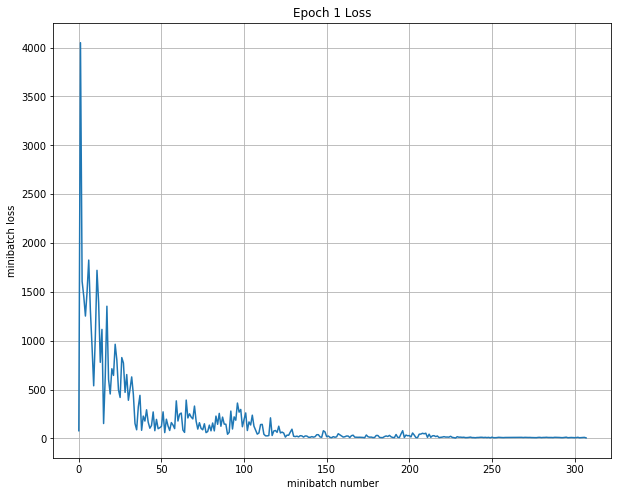

Iteration 400: with minibatch training loss = 1.47 and accuracy of 0.17
Iteration 500: with minibatch training loss = 1.72 and accuracy of 0.17
Iteration 600: with minibatch training loss = 1.36 and accuracy of 0.67
Epoch 2, Overall loss = 1.54 and accuracy of 0.317


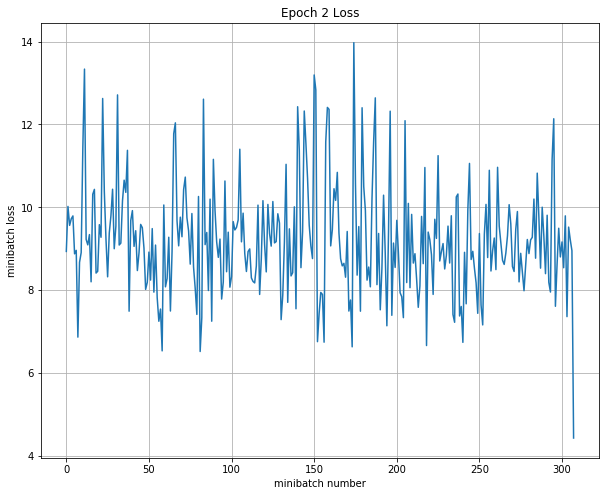

Iteration 700: with minibatch training loss = 1.54 and accuracy of 0.17
Iteration 800: with minibatch training loss = 1.57 and accuracy of 0.17
Iteration 900: with minibatch training loss = 1.55 and accuracy of 0.33
Epoch 3, Overall loss = 1.61 and accuracy of 0.32


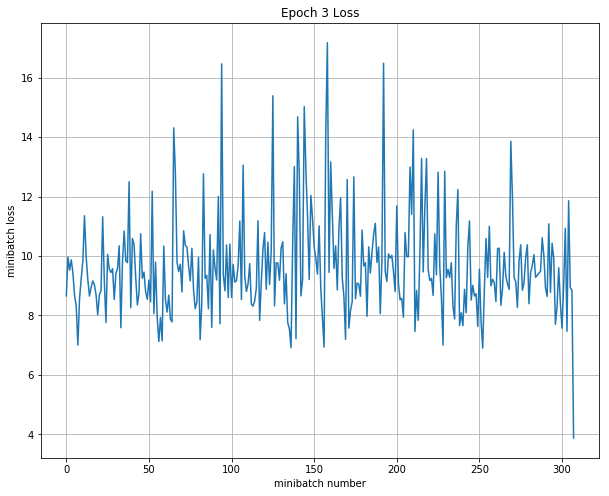

Iteration 1000: with minibatch training loss = 1.68 and accuracy of 0.5
Iteration 1100: with minibatch training loss = 1.74 and accuracy of 0.33
Iteration 1200: with minibatch training loss = 1.36 and accuracy of 0.33
Epoch 4, Overall loss = 1.64 and accuracy of 0.318


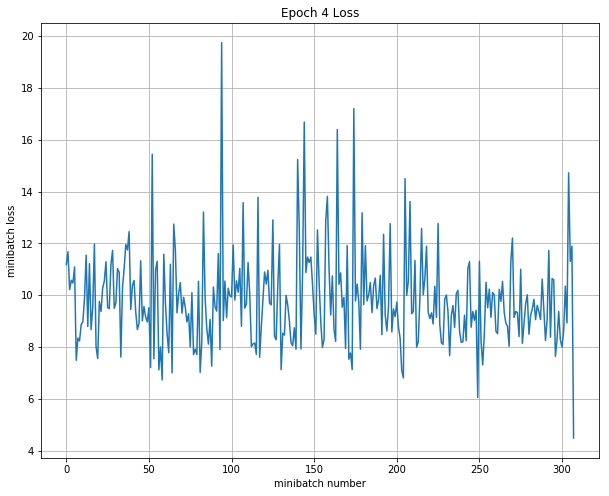

Iteration 1300: with minibatch training loss = 2.18 and accuracy of 0.17
Iteration 1400: with minibatch training loss = 1.59 and accuracy of 0.33
Iteration 1500: with minibatch training loss = 1.91 and accuracy of 0.67
Epoch 5, Overall loss = 2.24 and accuracy of 0.292


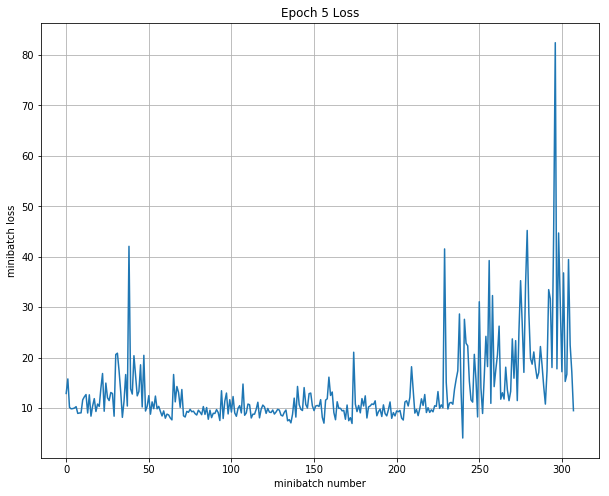

Iteration 1600: with minibatch training loss = 1.57 and accuracy of 0.17
Iteration 1700: with minibatch training loss = 2.08 and accuracy of 0.5
Iteration 1800: with minibatch training loss = 2.21 and accuracy of 0.17
Epoch 6, Overall loss = 1.8 and accuracy of 0.305


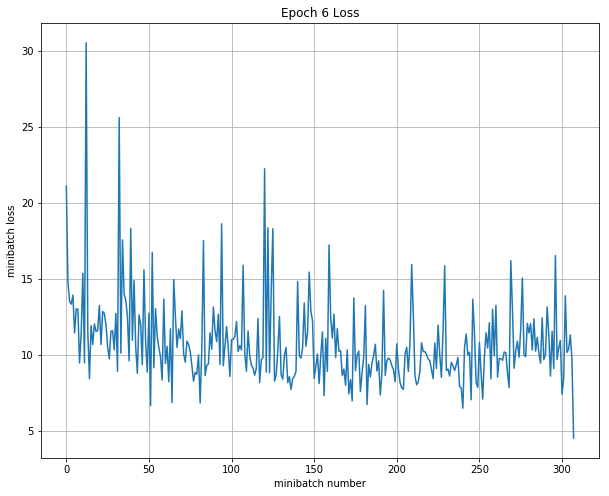

Iteration 1900: with minibatch training loss = 2.07 and accuracy of 0
Iteration 2000: with minibatch training loss = 2.05 and accuracy of 0.33
Iteration 2100: with minibatch training loss = 1.15 and accuracy of 0.67
Epoch 7, Overall loss = 1.73 and accuracy of 0.295


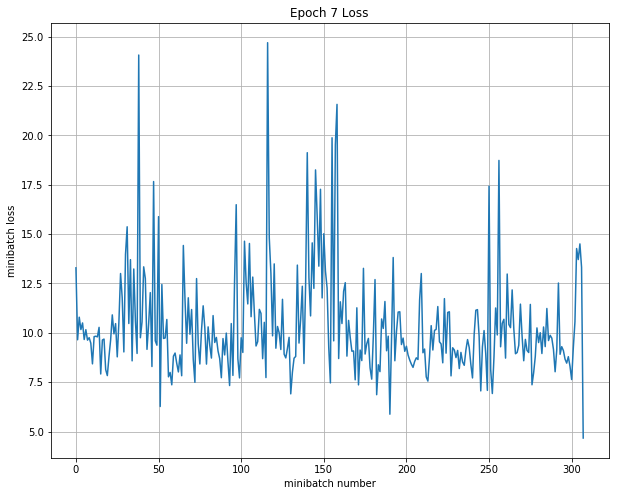

Iteration 2200: with minibatch training loss = 5.26 and accuracy of 0.33
Iteration 2300: with minibatch training loss = 2.42 and accuracy of 0.17
Iteration 2400: with minibatch training loss = 1.67 and accuracy of 0.33
Epoch 8, Overall loss = 2.36 and accuracy of 0.282


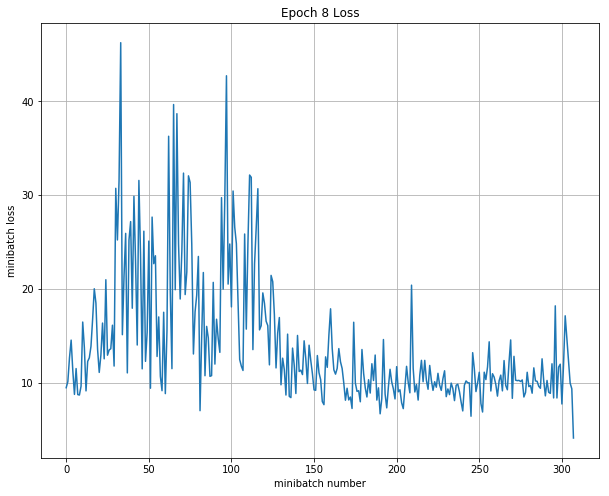

Iteration 2500: with minibatch training loss = 2.06 and accuracy of 0.33
Iteration 2600: with minibatch training loss = 1.14 and accuracy of 0.67
Iteration 2700: with minibatch training loss = 1.76 and accuracy of 0.33
Epoch 9, Overall loss = 1.99 and accuracy of 0.284


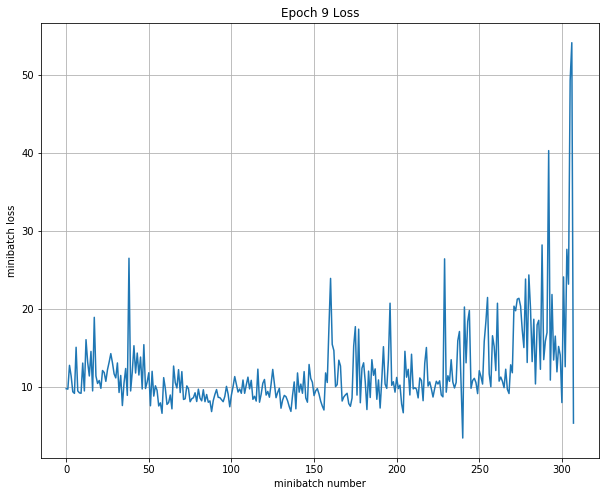

Iteration 2800: with minibatch training loss = 3.5 and accuracy of 0.33
Iteration 2900: with minibatch training loss = 17 and accuracy of 0
Iteration 3000: with minibatch training loss = 31.1 and accuracy of 0
Epoch 10, Overall loss = 8.71 and accuracy of 0.275


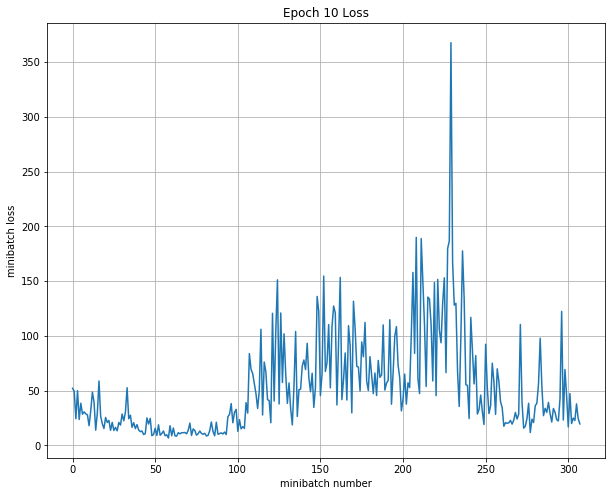

Train all layer
Iteration 0: with minibatch training loss = 5.39 and accuracy of 0.17
Iteration 100: with minibatch training loss = 224 and accuracy of 0.17
Iteration 200: with minibatch training loss = 62.6 and accuracy of 0.33
Iteration 300: with minibatch training loss = 26.4 and accuracy of 0.33
Epoch 1, Overall loss = 443 and accuracy of 0.304


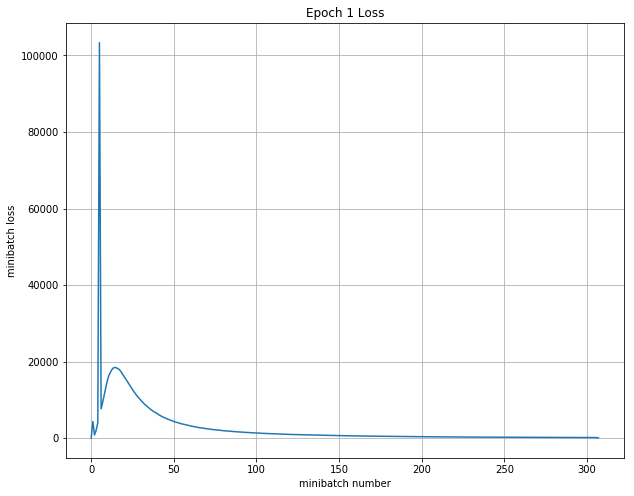

Iteration 400: with minibatch training loss = 13.6 and accuracy of 0.17
Iteration 500: with minibatch training loss = 7.79 and accuracy of 0.33
Iteration 600: with minibatch training loss = 5.13 and accuracy of 0.17
Epoch 2, Overall loss = 11.1 and accuracy of 0.307


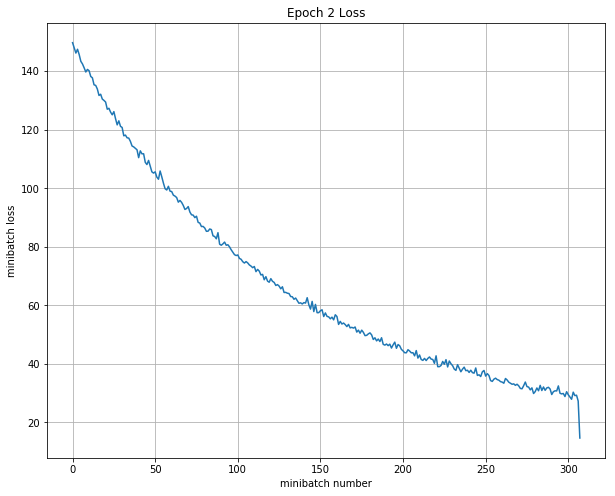

Iteration 700: with minibatch training loss = 3.75 and accuracy of 0
Iteration 800: with minibatch training loss = 2.65 and accuracy of 0.17
Iteration 900: with minibatch training loss = 2.27 and accuracy of 0.17
Epoch 3, Overall loss = 3.14 and accuracy of 0.313


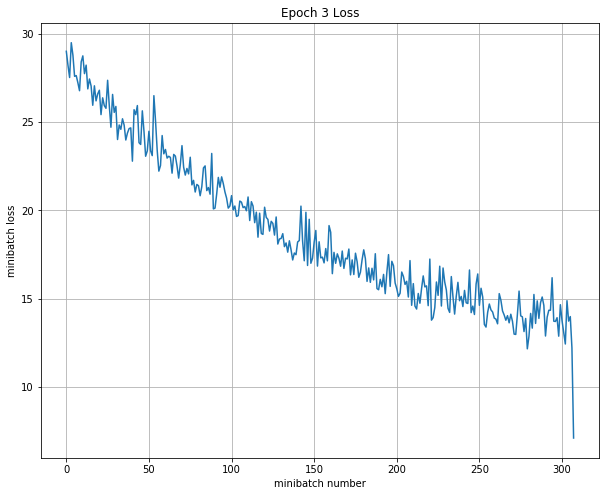

Iteration 1000: with minibatch training loss = 1.96 and accuracy of 0.33
Iteration 1100: with minibatch training loss = 1.91 and accuracy of 0.33
Iteration 1200: with minibatch training loss = 1.78 and accuracy of 0.5
Epoch 4, Overall loss = 1.94 and accuracy of 0.309


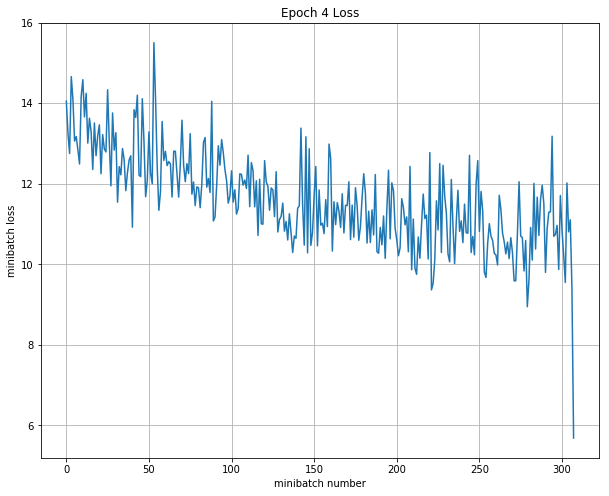

Iteration 1300: with minibatch training loss = 1.61 and accuracy of 0.5
Iteration 1400: with minibatch training loss = 1.59 and accuracy of 0
Iteration 1500: with minibatch training loss = 1.56 and accuracy of 0.17
Epoch 5, Overall loss = 1.7 and accuracy of 0.307


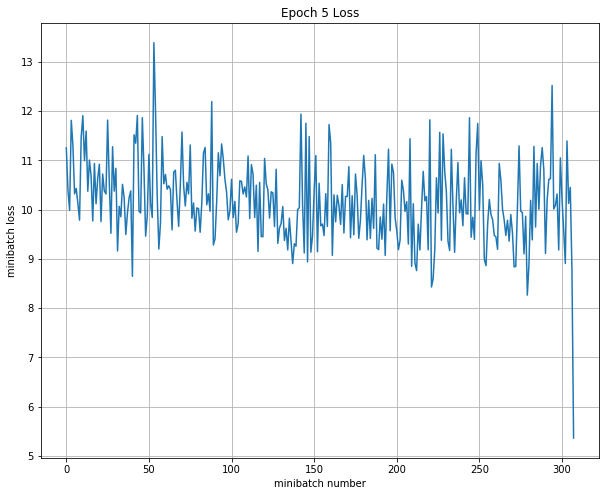

Iteration 1600: with minibatch training loss = 1.71 and accuracy of 0.33
Iteration 1700: with minibatch training loss = 1.84 and accuracy of 0.33
Iteration 1800: with minibatch training loss = 1.54 and accuracy of 0.33
Epoch 6, Overall loss = 1.64 and accuracy of 0.311


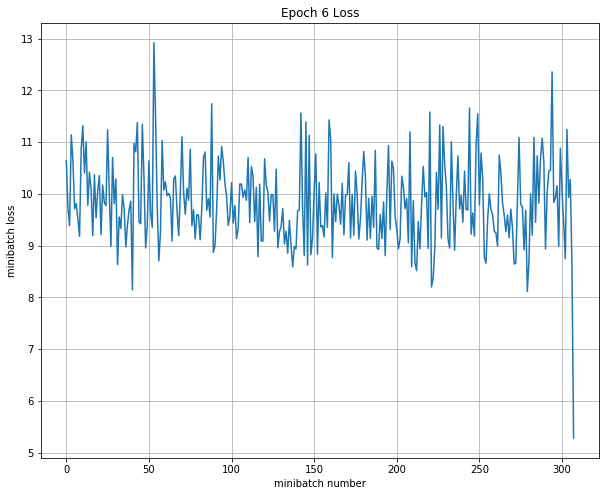

Iteration 1900: with minibatch training loss = 1.54 and accuracy of 0.33
Iteration 2000: with minibatch training loss = 1.45 and accuracy of 0.33
Iteration 2100: with minibatch training loss = 1.7 and accuracy of 0.17
Epoch 7, Overall loss = 1.62 and accuracy of 0.309


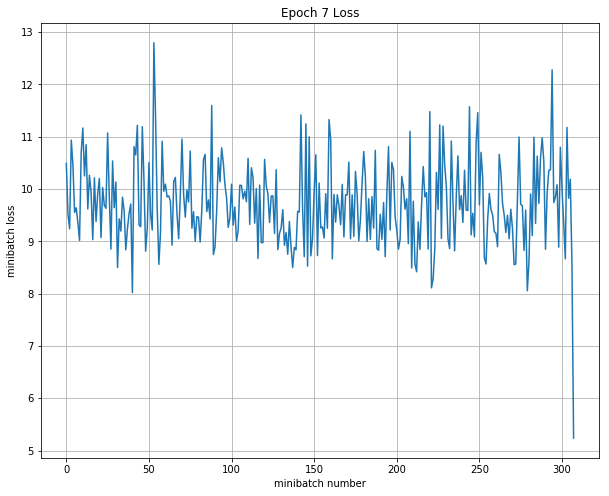

Iteration 2200: with minibatch training loss = 1.54 and accuracy of 0.5
Iteration 2300: with minibatch training loss = 1.44 and accuracy of 0.5
Iteration 2400: with minibatch training loss = 1.92 and accuracy of 0.17
Epoch 8, Overall loss = 1.61 and accuracy of 0.311


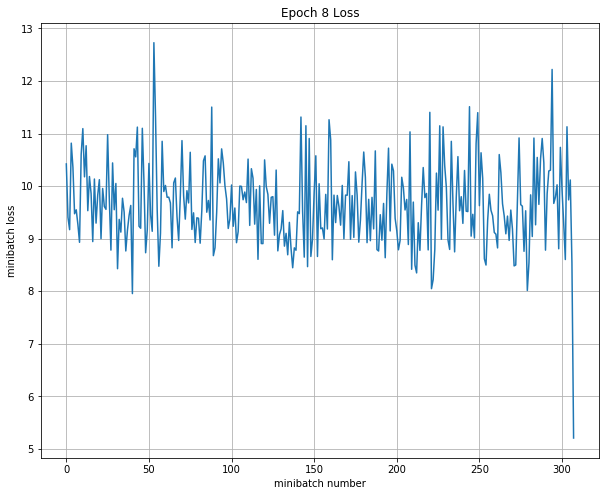

Iteration 2500: with minibatch training loss = 1.45 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 1.46 and accuracy of 0.17
Iteration 2700: with minibatch training loss = 1.62 and accuracy of 0.33
Epoch 9, Overall loss = 1.6 and accuracy of 0.311


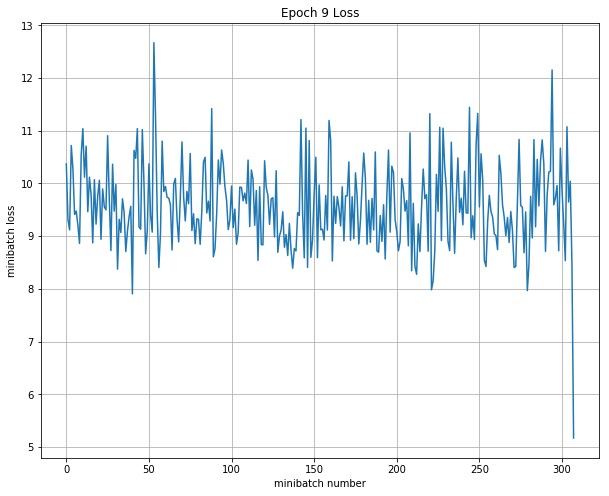

Iteration 2800: with minibatch training loss = 1.71 and accuracy of 0.17
Iteration 2900: with minibatch training loss = 1.44 and accuracy of 0.5
Iteration 3000: with minibatch training loss = 1.83 and accuracy of 0.17
Epoch 10, Overall loss = 1.59 and accuracy of 0.311


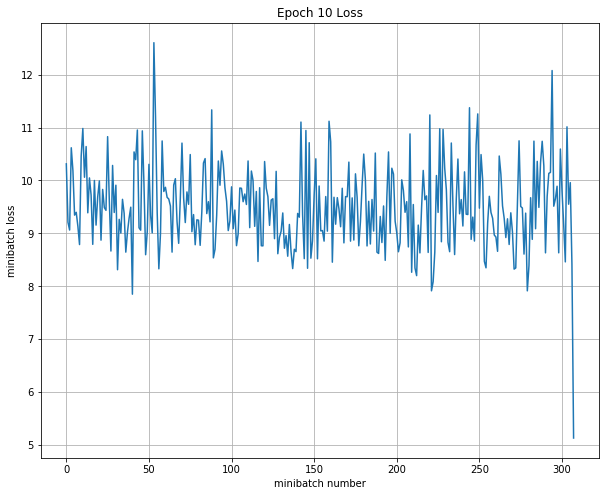

Validation
Epoch 1, Overall loss = 1.59 and accuracy of 0.31
Test
Epoch 1, Overall loss = 1.57 and accuracy of 0.325

--------------------------------------------------------------------------------
Trial number: 1
--------------------------------------------------------------------------------
reg: 0.611903, lr: 0.000680, dr: 0.839249, dc: 508, FC_size: 100 
INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


Train last layer
Iteration 0: with minibatch training loss = 65 and accuracy of 0.17
Iteration 100: with minibatch training loss = 7.14 and accuracy of 0.33
Iteration 200: with minibatch training loss = 11.9 and accuracy of 0.33
Iteration 300: with minibatch training loss = 3.43 and accuracy of 0.17
Epoch 1, Overall loss = 9.52 and accuracy of 0.285


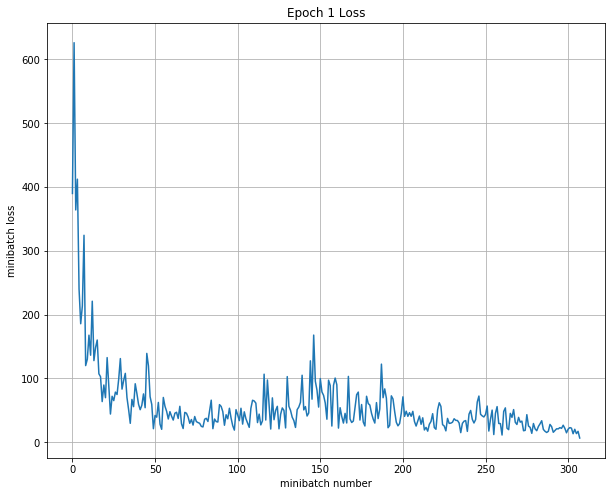

Iteration 400: with minibatch training loss = 1.98 and accuracy of 0.5
Iteration 500: with minibatch training loss = 2.3 and accuracy of 0
Iteration 600: with minibatch training loss = 1.93 and accuracy of 0.17
Epoch 2, Overall loss = 2.7 and accuracy of 0.294


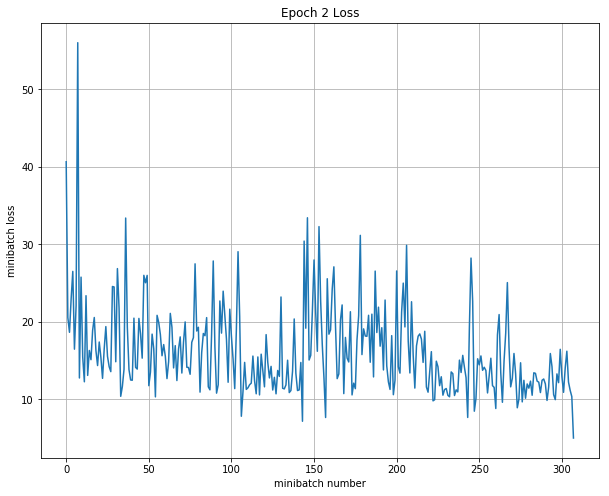

Iteration 700: with minibatch training loss = 1.57 and accuracy of 0.33
Iteration 800: with minibatch training loss = 1.78 and accuracy of 0.33
Iteration 900: with minibatch training loss = 1.74 and accuracy of 0.5
Epoch 3, Overall loss = 1.79 and accuracy of 0.292


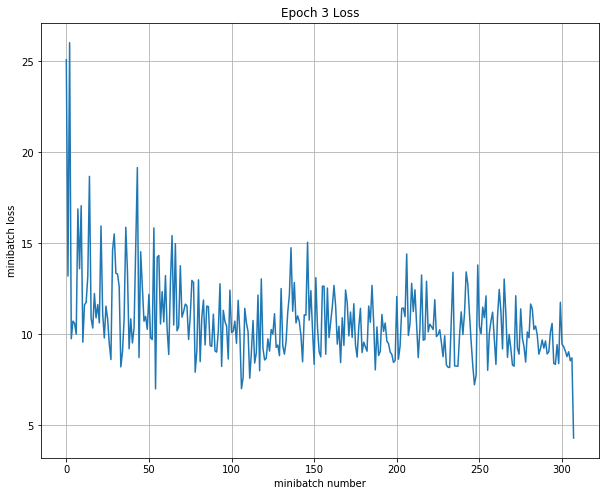

Iteration 1000: with minibatch training loss = 1.61 and accuracy of 0.17
Iteration 1100: with minibatch training loss = 1.41 and accuracy of 0.17
Iteration 1200: with minibatch training loss = 1.4 and accuracy of 0.5
Epoch 4, Overall loss = 1.47 and accuracy of 0.319


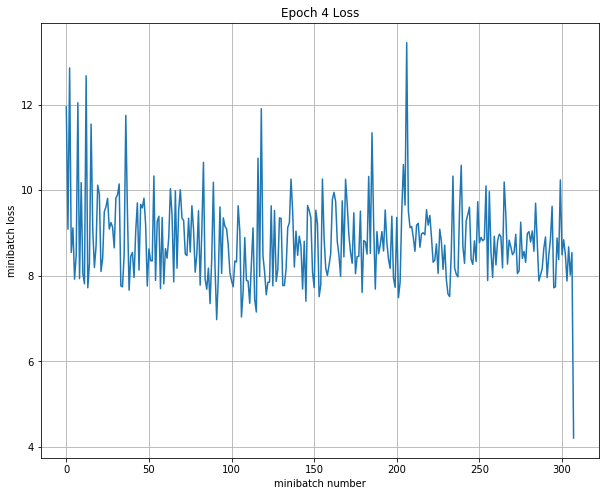

Iteration 1300: with minibatch training loss = 1.51 and accuracy of 0
Iteration 1400: with minibatch training loss = 1.37 and accuracy of 0.5
Iteration 1500: with minibatch training loss = 1.43 and accuracy of 0.17
Epoch 5, Overall loss = 1.4 and accuracy of 0.325


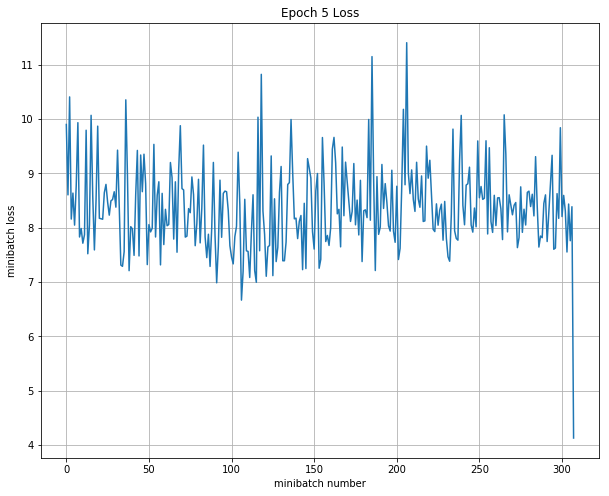

Iteration 1600: with minibatch training loss = 1.36 and accuracy of 0.33
Iteration 1700: with minibatch training loss = 1.32 and accuracy of 0.33
Iteration 1800: with minibatch training loss = 1.32 and accuracy of 0.33
Epoch 6, Overall loss = 1.37 and accuracy of 0.327


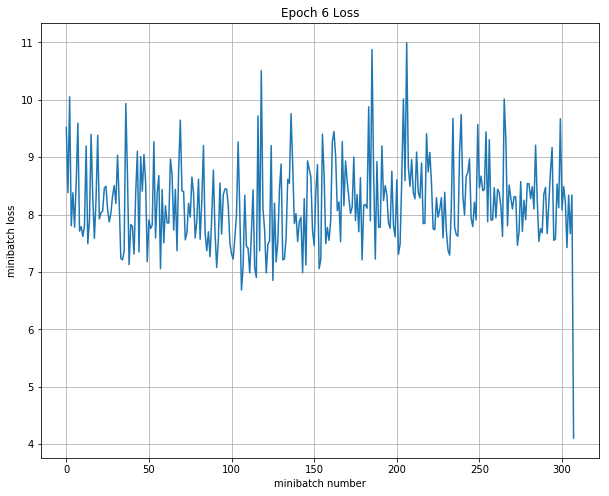

Iteration 1900: with minibatch training loss = 1.29 and accuracy of 0.17
Iteration 2000: with minibatch training loss = 1.47 and accuracy of 0.17
Iteration 2100: with minibatch training loss = 1.4 and accuracy of 0.33
Epoch 7, Overall loss = 1.36 and accuracy of 0.326


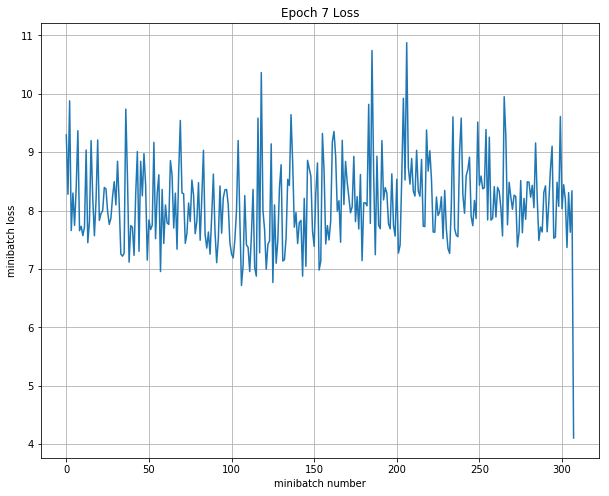

Iteration 2200: with minibatch training loss = 1.22 and accuracy of 0.33
Iteration 2300: with minibatch training loss = 1.37 and accuracy of 0.33
Iteration 2400: with minibatch training loss = 1.48 and accuracy of 0.17
Epoch 8, Overall loss = 1.35 and accuracy of 0.326


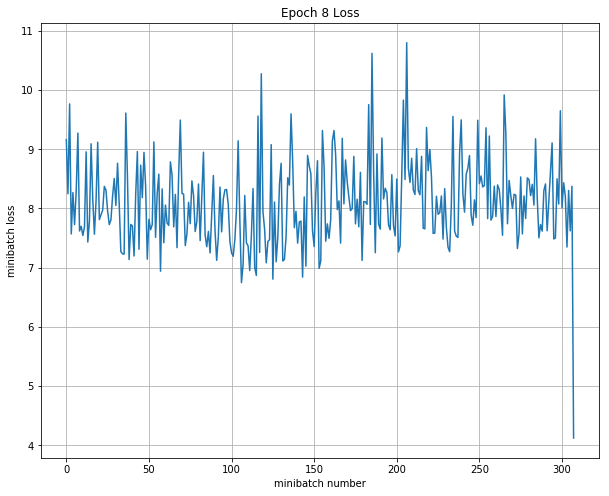

Iteration 2500: with minibatch training loss = 1.62 and accuracy of 0.17
Iteration 2600: with minibatch training loss = 1.58 and accuracy of 0
Iteration 2700: with minibatch training loss = 1.25 and accuracy of 0.17
Epoch 9, Overall loss = 1.36 and accuracy of 0.328


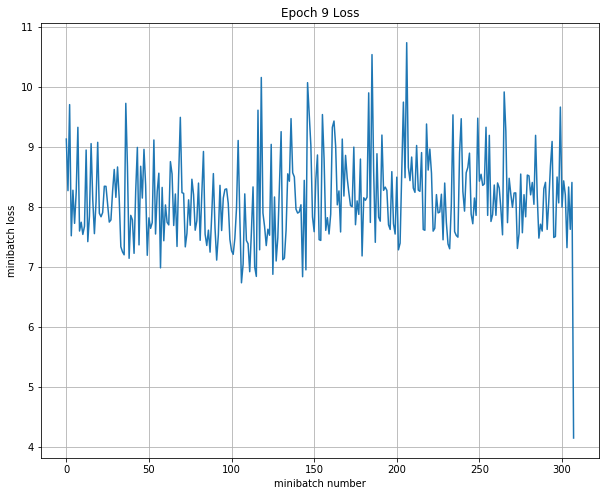

Iteration 2800: with minibatch training loss = 1.36 and accuracy of 0.33
Iteration 2900: with minibatch training loss = 1.26 and accuracy of 0
Iteration 3000: with minibatch training loss = 1.24 and accuracy of 0.5
Epoch 10, Overall loss = 1.36 and accuracy of 0.327


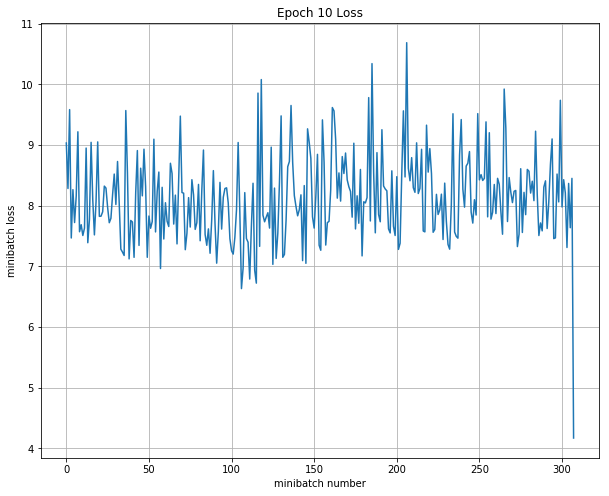

Train all layer
Iteration 0: with minibatch training loss = 1.35 and accuracy of 0.33
Iteration 100: with minibatch training loss = 1.49 and accuracy of 0.17
Iteration 200: with minibatch training loss = 1.52 and accuracy of 0.17
Iteration 300: with minibatch training loss = 1.45 and accuracy of 0.33
Epoch 1, Overall loss = 1.59 and accuracy of 0.327


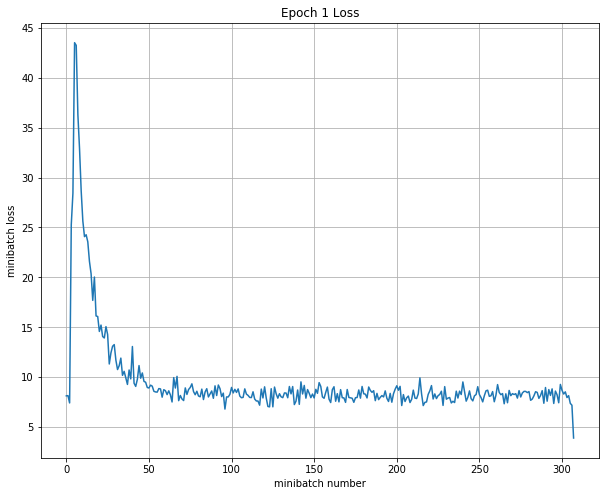

Iteration 400: with minibatch training loss = 1.55 and accuracy of 0.33
Iteration 500: with minibatch training loss = 1.32 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.47 and accuracy of 0.33
Epoch 2, Overall loss = 1.35 and accuracy of 0.334


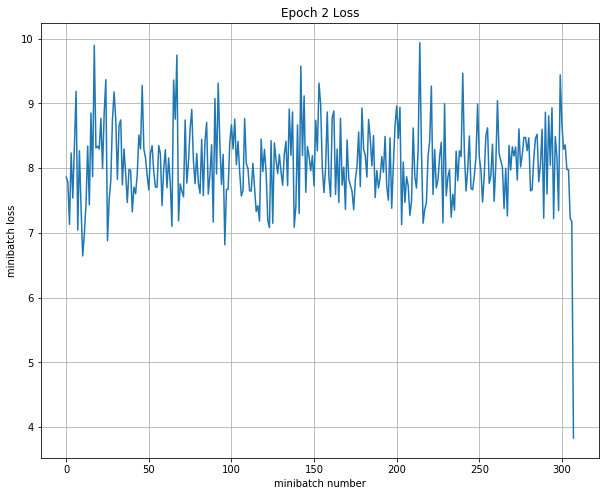

Iteration 700: with minibatch training loss = 1.41 and accuracy of 0.33
Iteration 800: with minibatch training loss = 1.4 and accuracy of 0
Iteration 900: with minibatch training loss = 1.4 and accuracy of 0.17
Epoch 3, Overall loss = 1.34 and accuracy of 0.334


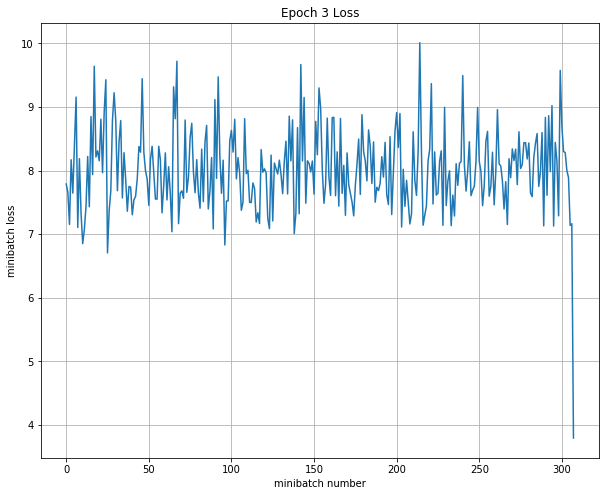

Iteration 1000: with minibatch training loss = 1.44 and accuracy of 0
Iteration 1100: with minibatch training loss = 1.36 and accuracy of 0.5
Iteration 1200: with minibatch training loss = 1.34 and accuracy of 0.17
Epoch 4, Overall loss = 1.33 and accuracy of 0.334


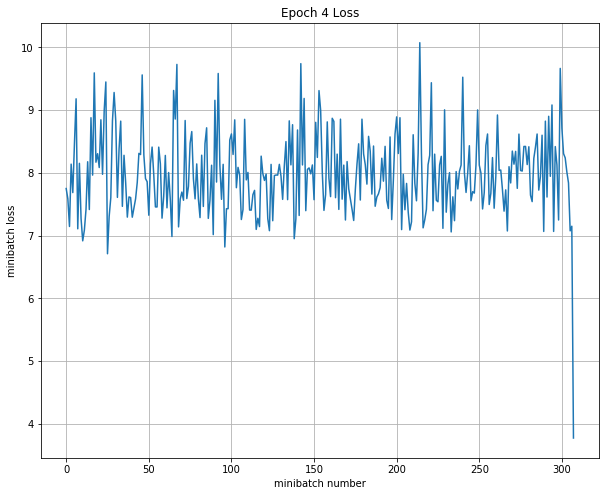

Iteration 1300: with minibatch training loss = 1.19 and accuracy of 0.67
Iteration 1400: with minibatch training loss = 1.36 and accuracy of 0.5
Iteration 1500: with minibatch training loss = 1.34 and accuracy of 0
Epoch 5, Overall loss = 1.33 and accuracy of 0.334


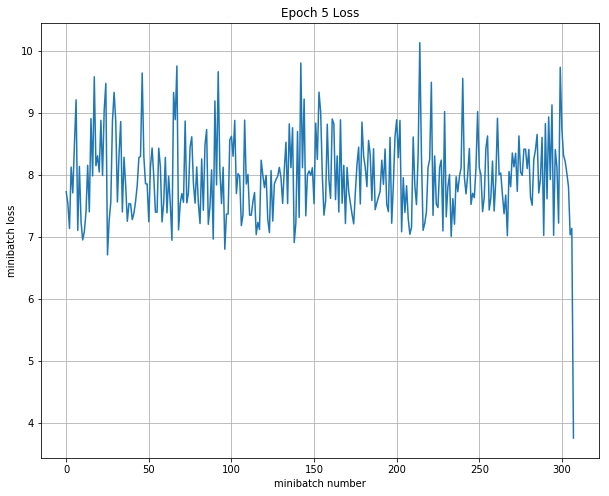

Iteration 1600: with minibatch training loss = 1.38 and accuracy of 0.33
Iteration 1700: with minibatch training loss = 1.27 and accuracy of 0.83
Iteration 1800: with minibatch training loss = 1.32 and accuracy of 0.33
Epoch 6, Overall loss = 1.33 and accuracy of 0.334


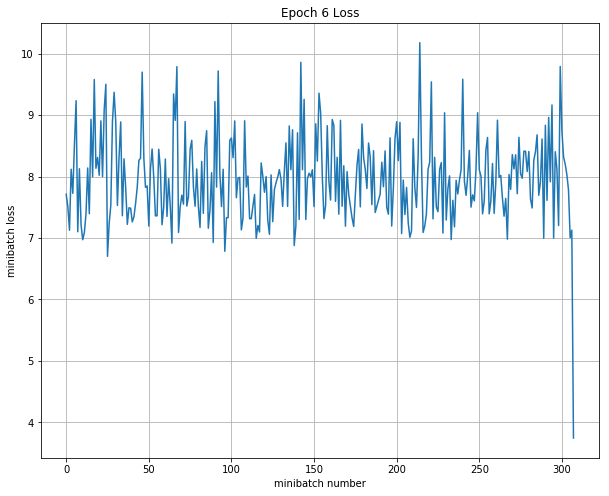

Iteration 1900: with minibatch training loss = 1.41 and accuracy of 0.33
Iteration 2000: with minibatch training loss = 1.38 and accuracy of 0.17
Iteration 2100: with minibatch training loss = 1.23 and accuracy of 0.5
Epoch 7, Overall loss = 1.33 and accuracy of 0.334


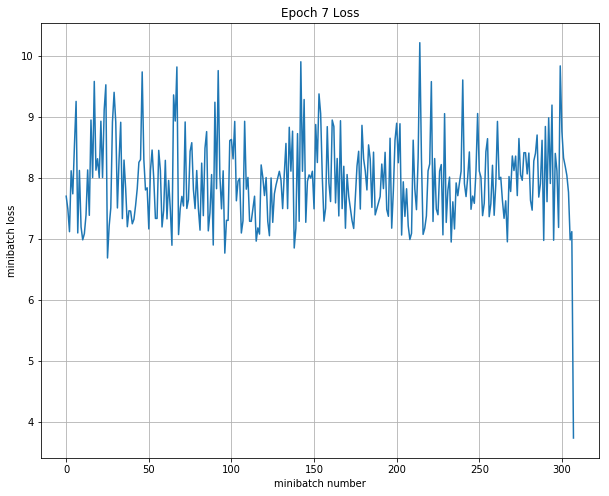

Iteration 2200: with minibatch training loss = 1.37 and accuracy of 0.17
Iteration 2300: with minibatch training loss = 1.55 and accuracy of 0.17
Iteration 2400: with minibatch training loss = 1.4 and accuracy of 0.17
Epoch 8, Overall loss = 1.33 and accuracy of 0.334


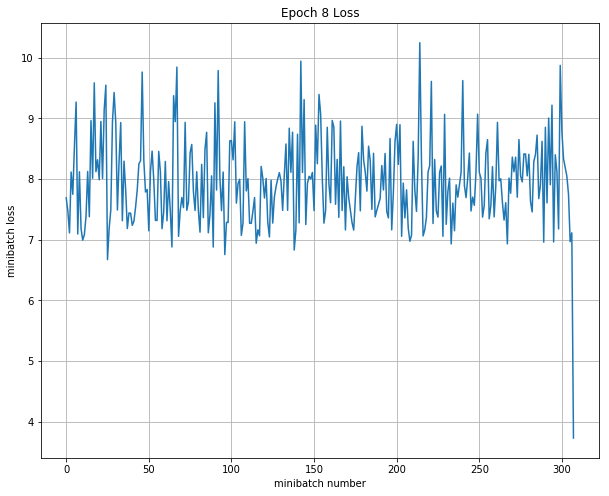

Iteration 2500: with minibatch training loss = 1.3 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 1.35 and accuracy of 0.33
Iteration 2700: with minibatch training loss = 1.31 and accuracy of 0
Epoch 9, Overall loss = 1.33 and accuracy of 0.334


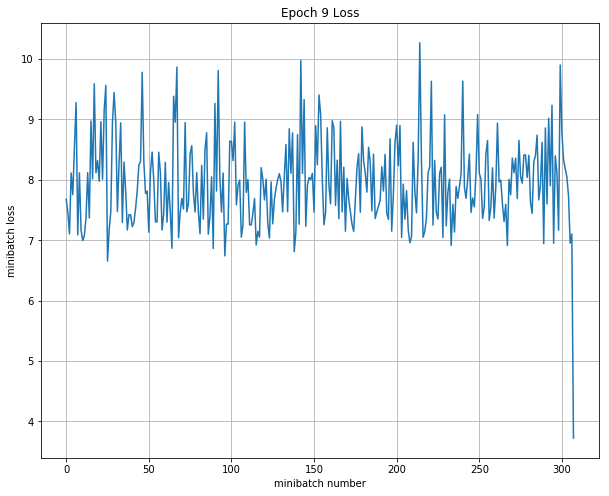

Iteration 2800: with minibatch training loss = 1.49 and accuracy of 0.33
Iteration 2900: with minibatch training loss = 1.33 and accuracy of 0.5
Iteration 3000: with minibatch training loss = 1.17 and accuracy of 0.67
Epoch 10, Overall loss = 1.33 and accuracy of 0.334


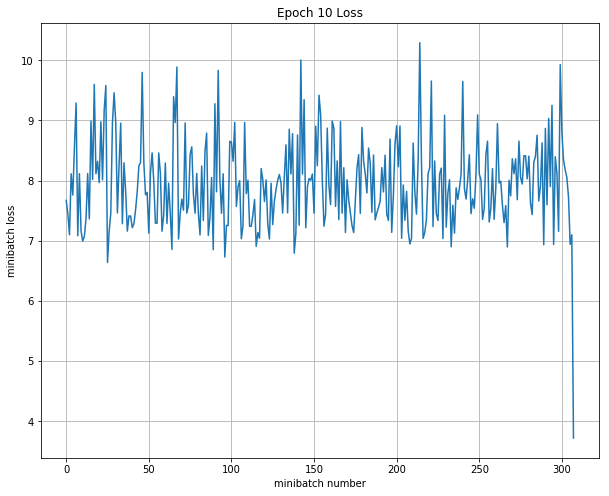

Validation
Epoch 1, Overall loss = 1.32 and accuracy of 0.35
Test
Epoch 1, Overall loss = 1.29 and accuracy of 0.38

--------------------------------------------------------------------------------
Trial number: 2
--------------------------------------------------------------------------------
reg: 0.002288, lr: 0.000786, dr: 0.909957, dc: 717, FC_size: 100 
INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


Train last layer
Iteration 0: with minibatch training loss = 1.99 and accuracy of 0.33
Iteration 100: with minibatch training loss = 8.3 and accuracy of 0.5
Iteration 200: with minibatch training loss = 7.88 and accuracy of 0.17
Iteration 300: with minibatch training loss = 4.36 and accuracy of 0.5
Epoch 1, Overall loss = 10.2 and accuracy of 0.31


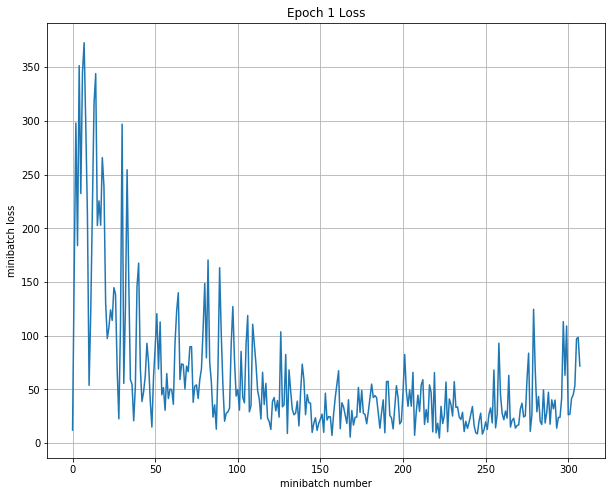

Iteration 400: with minibatch training loss = 15.4 and accuracy of 0.17
Iteration 500: with minibatch training loss = 0.867 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.95 and accuracy of 0.5
Epoch 2, Overall loss = 3.98 and accuracy of 0.429


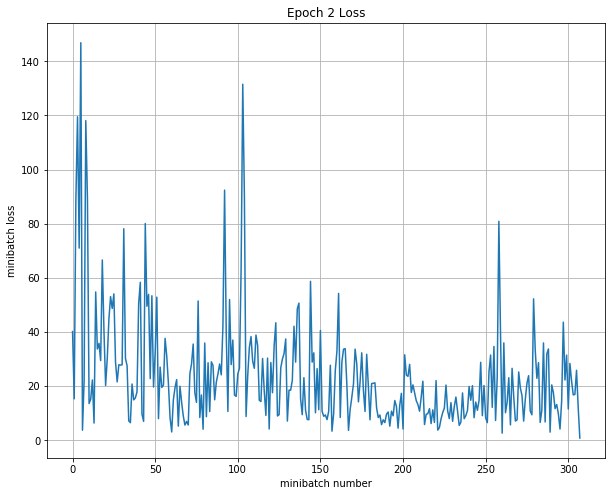

Iteration 700: with minibatch training loss = 2.21 and accuracy of 0.33
Iteration 800: with minibatch training loss = 2.12 and accuracy of 0.5
Iteration 900: with minibatch training loss = 0.78 and accuracy of 0.67
Epoch 3, Overall loss = 2.81 and accuracy of 0.427


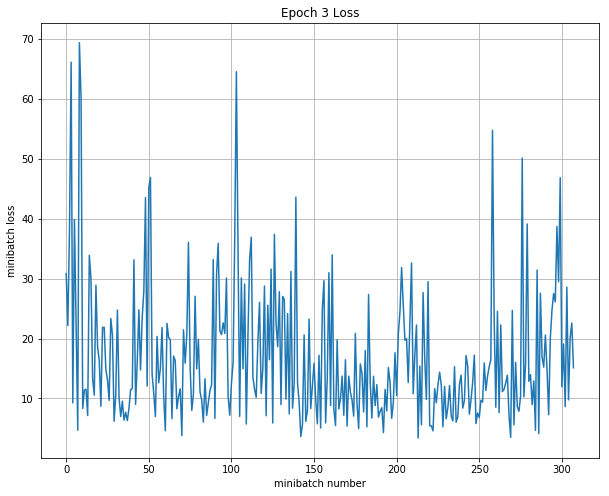

Iteration 1000: with minibatch training loss = 1.35 and accuracy of 0.33
Iteration 1100: with minibatch training loss = 0.824 and accuracy of 1
Iteration 1200: with minibatch training loss = 3.24 and accuracy of 0.33
Epoch 4, Overall loss = 2.08 and accuracy of 0.451


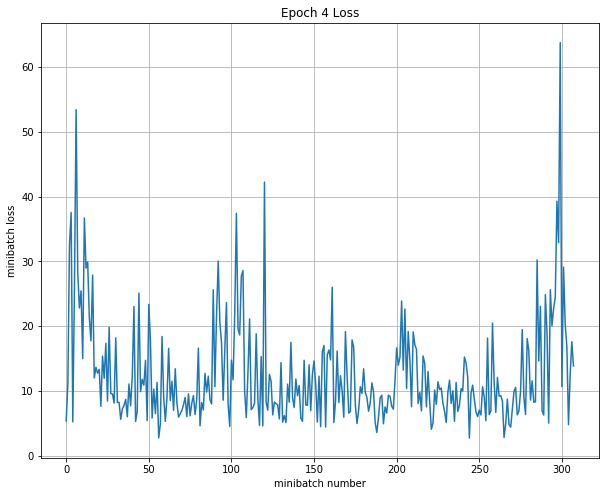

Iteration 1300: with minibatch training loss = 1.33 and accuracy of 0.5
Iteration 1400: with minibatch training loss = 0.897 and accuracy of 1
Iteration 1500: with minibatch training loss = 1.32 and accuracy of 0.5
Epoch 5, Overall loss = 1.68 and accuracy of 0.471


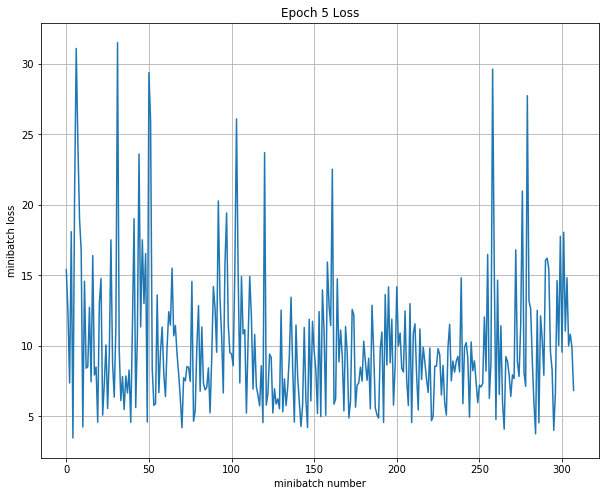

Iteration 1600: with minibatch training loss = 1.06 and accuracy of 0.83
Iteration 1700: with minibatch training loss = 2.19 and accuracy of 0.17
Iteration 1800: with minibatch training loss = 0.651 and accuracy of 1
Epoch 6, Overall loss = 1.54 and accuracy of 0.466


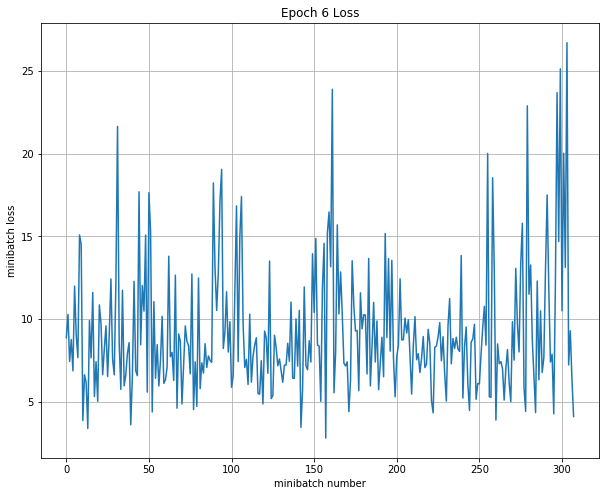

Iteration 1900: with minibatch training loss = 0.697 and accuracy of 0.83
Iteration 2000: with minibatch training loss = 1.67 and accuracy of 0.33
Iteration 2100: with minibatch training loss = 1.48 and accuracy of 0.67
Epoch 7, Overall loss = 1.46 and accuracy of 0.483


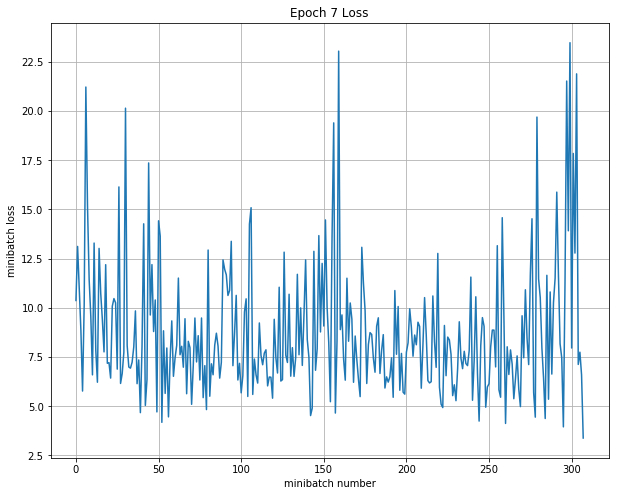

Iteration 2200: with minibatch training loss = 1.98 and accuracy of 0.17
Iteration 2300: with minibatch training loss = 2.19 and accuracy of 0.17
Iteration 2400: with minibatch training loss = 0.685 and accuracy of 0.83
Epoch 8, Overall loss = 1.42 and accuracy of 0.473


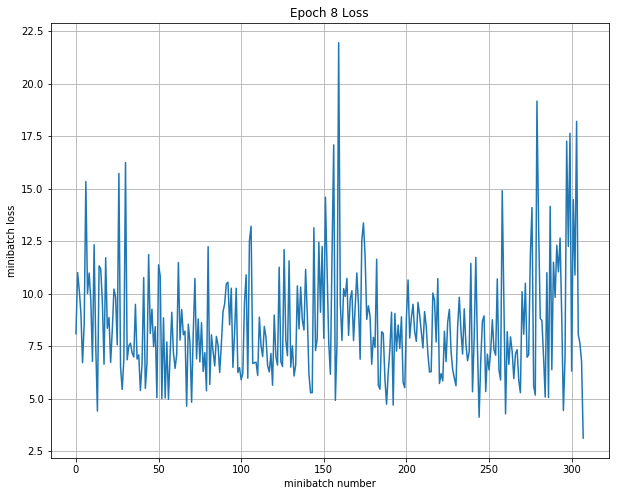

Iteration 2500: with minibatch training loss = 1.31 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 1.61 and accuracy of 0.17
Iteration 2700: with minibatch training loss = 1.37 and accuracy of 0.5
Epoch 9, Overall loss = 1.38 and accuracy of 0.47


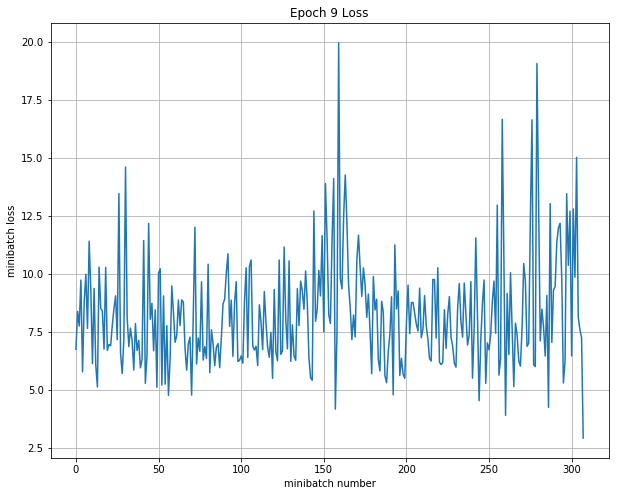

Iteration 2800: with minibatch training loss = 0.913 and accuracy of 0.83
Iteration 2900: with minibatch training loss = 1.18 and accuracy of 0.83
Iteration 3000: with minibatch training loss = 1.41 and accuracy of 0.5
Epoch 10, Overall loss = 1.35 and accuracy of 0.478


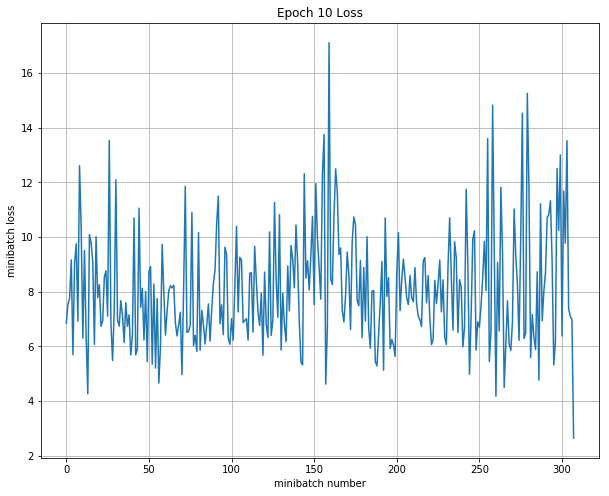

Train all layer
Iteration 0: with minibatch training loss = 1.18 and accuracy of 0.5
Iteration 100: with minibatch training loss = 1.66 and accuracy of 0.5
Iteration 200: with minibatch training loss = 1.65 and accuracy of 0.33
Iteration 300: with minibatch training loss = 1.42 and accuracy of 0.17
Epoch 1, Overall loss = 1.99 and accuracy of 0.299


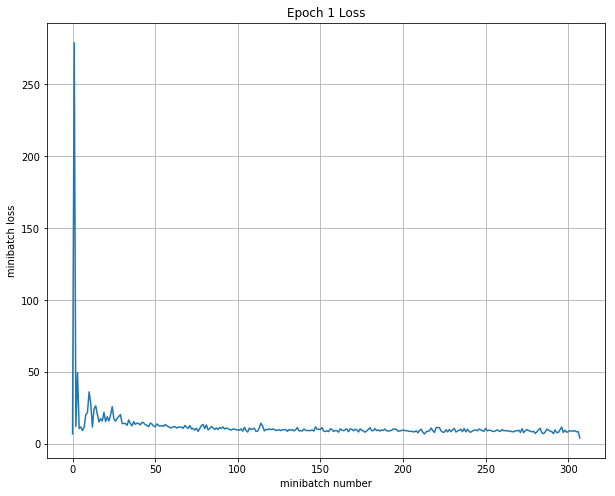

Iteration 400: with minibatch training loss = 1.59 and accuracy of 0.17
Iteration 500: with minibatch training loss = 1.37 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.57 and accuracy of 0.17
Epoch 2, Overall loss = 1.45 and accuracy of 0.322


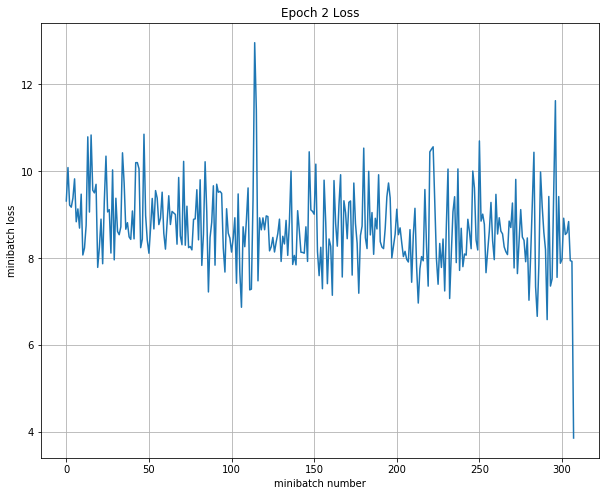

Iteration 700: with minibatch training loss = 1.61 and accuracy of 0
Iteration 800: with minibatch training loss = 1.39 and accuracy of 0.33
Iteration 900: with minibatch training loss = 1.19 and accuracy of 0.67
Epoch 3, Overall loss = 1.4 and accuracy of 0.326


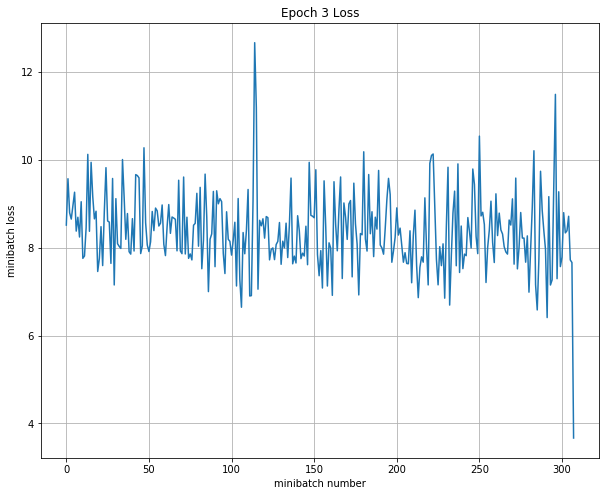

Iteration 1000: with minibatch training loss = 1.26 and accuracy of 0.67
Iteration 1100: with minibatch training loss = 1.32 and accuracy of 0.17
Iteration 1200: with minibatch training loss = 1.35 and accuracy of 0
Epoch 4, Overall loss = 1.37 and accuracy of 0.327


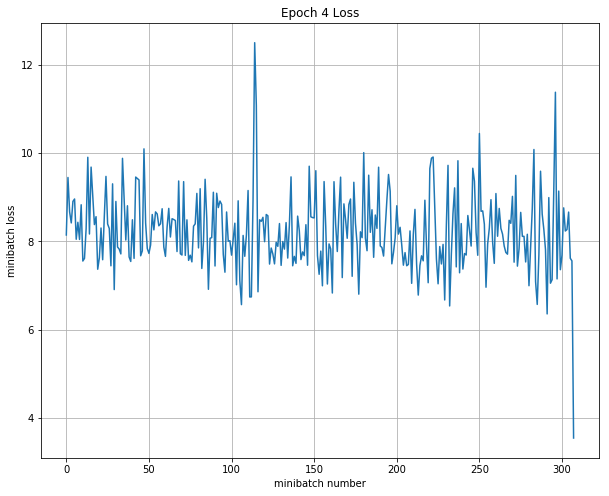

Iteration 1300: with minibatch training loss = 1.54 and accuracy of 0
Iteration 1400: with minibatch training loss = 1.46 and accuracy of 0.17
Iteration 1500: with minibatch training loss = 1.39 and accuracy of 0.67
Epoch 5, Overall loss = 1.36 and accuracy of 0.33


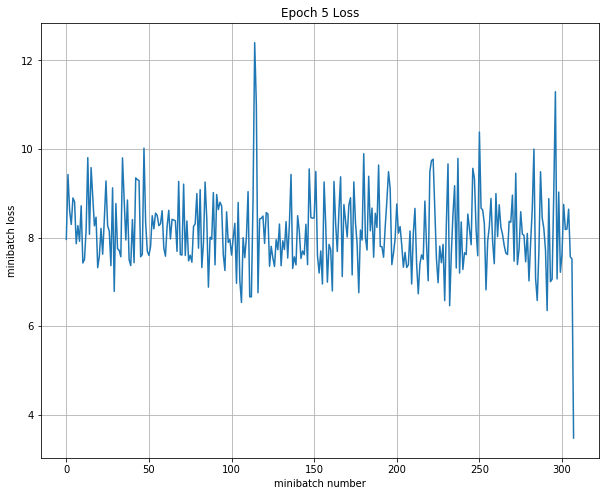

Iteration 1600: with minibatch training loss = 1.26 and accuracy of 0.5
Iteration 1700: with minibatch training loss = 1.28 and accuracy of 0.17
Iteration 1800: with minibatch training loss = 1.49 and accuracy of 0.33
Epoch 6, Overall loss = 1.35 and accuracy of 0.327


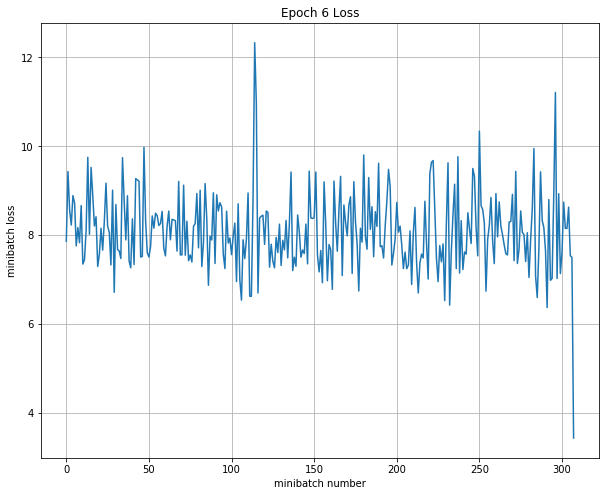

Iteration 1900: with minibatch training loss = 1.4 and accuracy of 0.17
Iteration 2000: with minibatch training loss = 1.26 and accuracy of 0.17
Iteration 2100: with minibatch training loss = 1.42 and accuracy of 0.17
Epoch 7, Overall loss = 1.35 and accuracy of 0.327


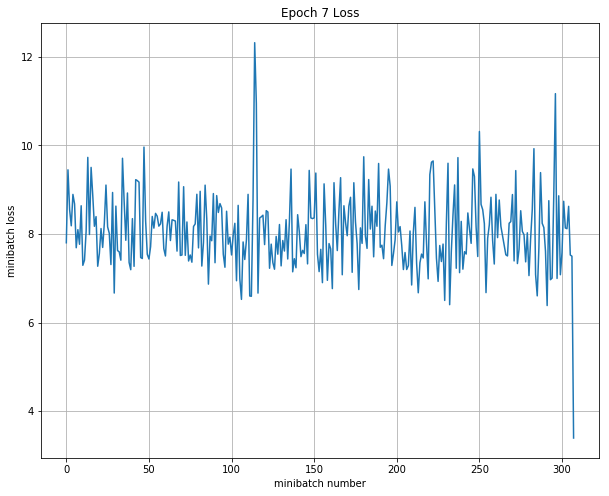

Iteration 2200: with minibatch training loss = 1.52 and accuracy of 0.17
Iteration 2300: with minibatch training loss = 1.26 and accuracy of 0.17
Iteration 2400: with minibatch training loss = 1.35 and accuracy of 0.17
Epoch 8, Overall loss = 1.34 and accuracy of 0.32


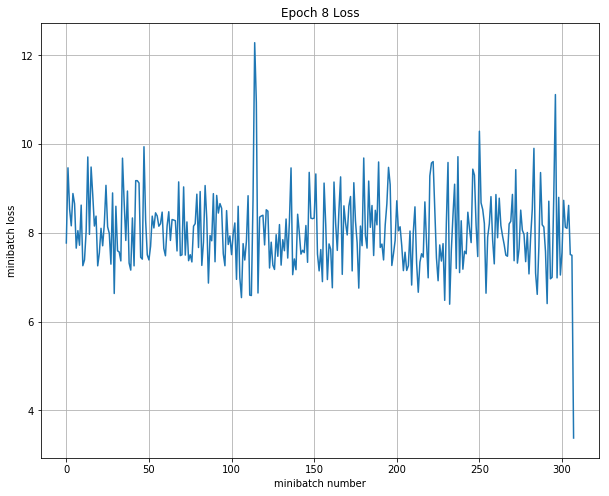

Iteration 2500: with minibatch training loss = 1.3 and accuracy of 0.17
Iteration 2600: with minibatch training loss = 1.58 and accuracy of 0
Iteration 2700: with minibatch training loss = 1.2 and accuracy of 0.17
Epoch 9, Overall loss = 1.34 and accuracy of 0.322


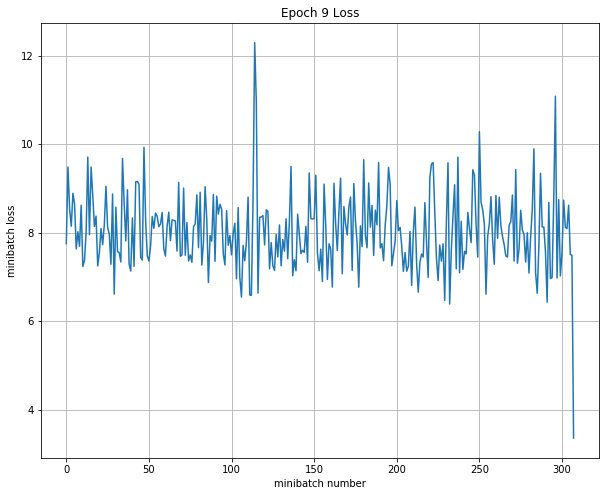

Iteration 2800: with minibatch training loss = 1.47 and accuracy of 0.17
Iteration 2900: with minibatch training loss = 1.24 and accuracy of 0.17
Iteration 3000: with minibatch training loss = 1.29 and accuracy of 0.5
Epoch 10, Overall loss = 1.34 and accuracy of 0.322


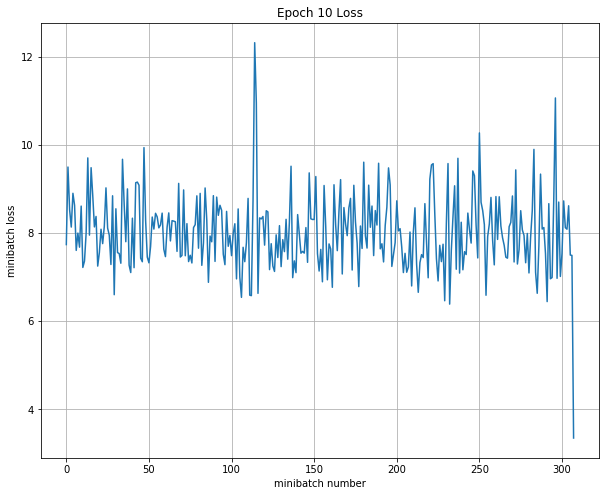

Validation
Epoch 1, Overall loss = 1.32 and accuracy of 0.35
Test
Epoch 1, Overall loss = 1.29 and accuracy of 0.38

--------------------------------------------------------------------------------
Trial number: 3
--------------------------------------------------------------------------------
reg: 3.578901, lr: 0.001515, dr: 0.963100, dc: 765, FC_size: 100 
INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


Train last layer
Iteration 0: with minibatch training loss = 373 and accuracy of 0
Iteration 100: with minibatch training loss = 7.52 and accuracy of 0.17
Iteration 200: with minibatch training loss = 4.53 and accuracy of 0.33
Iteration 300: with minibatch training loss = 2.08 and accuracy of 0.33
Epoch 1, Overall loss = 15.9 and accuracy of 0.27


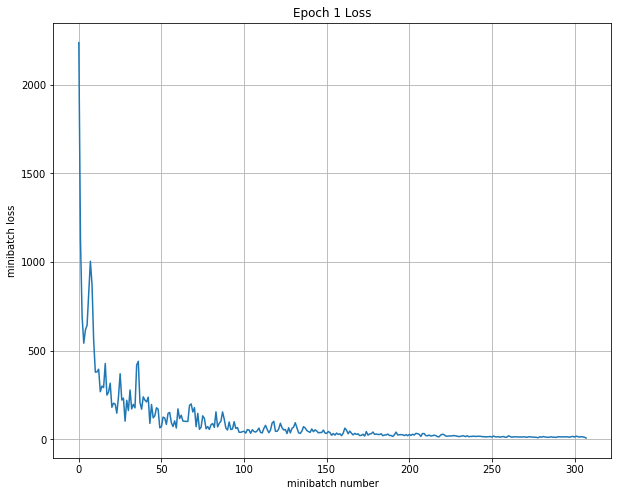

Iteration 400: with minibatch training loss = 1.66 and accuracy of 0.17
Iteration 500: with minibatch training loss = 1.75 and accuracy of 0.17
Iteration 600: with minibatch training loss = 1.55 and accuracy of 0.17
Epoch 2, Overall loss = 1.57 and accuracy of 0.283


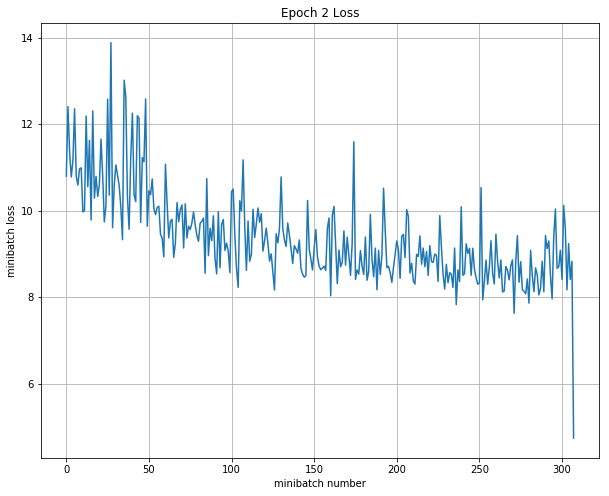

Iteration 700: with minibatch training loss = 1.32 and accuracy of 0.5
Iteration 800: with minibatch training loss = 1.55 and accuracy of 0.17
Iteration 900: with minibatch training loss = 1.41 and accuracy of 0
Epoch 3, Overall loss = 1.43 and accuracy of 0.304


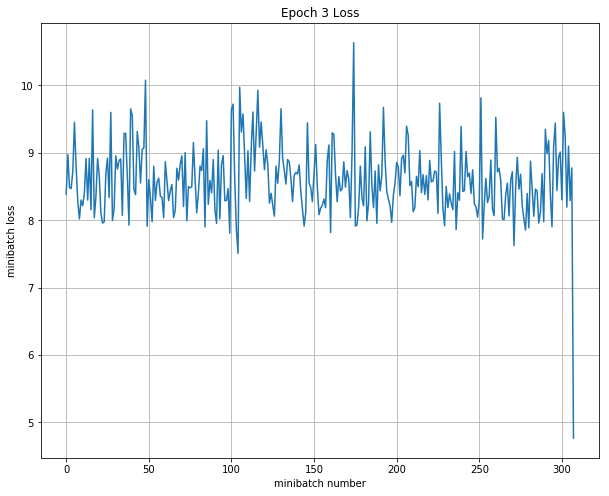

Iteration 1000: with minibatch training loss = 1.4 and accuracy of 0.33
Iteration 1100: with minibatch training loss = 1.29 and accuracy of 0.5
Iteration 1200: with minibatch training loss = 1.37 and accuracy of 0.5
Epoch 4, Overall loss = 1.41 and accuracy of 0.308


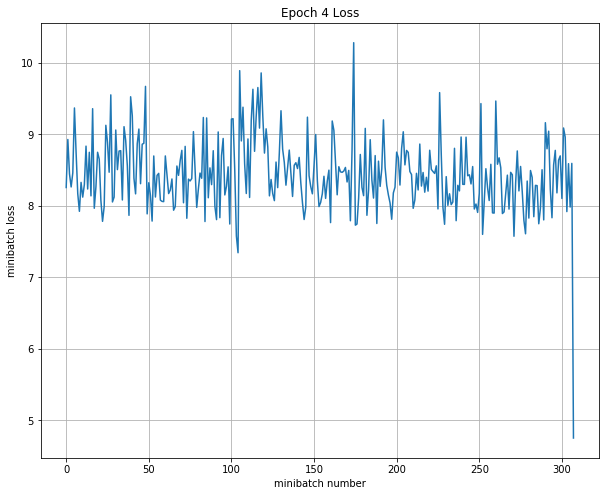

Iteration 1300: with minibatch training loss = 1.39 and accuracy of 0.33
Iteration 1400: with minibatch training loss = 1.37 and accuracy of 0.17
Iteration 1500: with minibatch training loss = 1.32 and accuracy of 0.67
Epoch 5, Overall loss = 1.4 and accuracy of 0.311


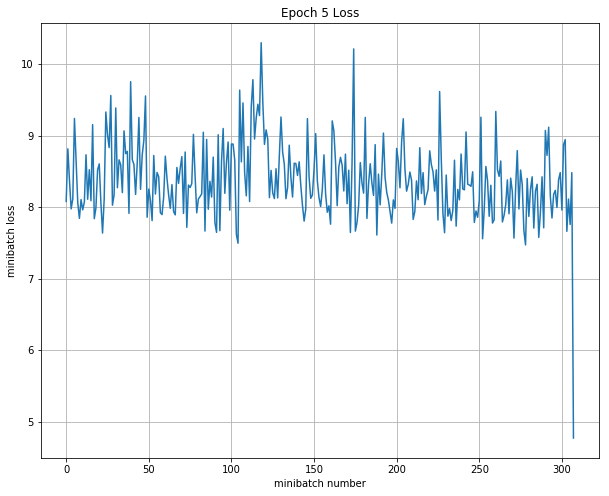

Iteration 1600: with minibatch training loss = 1.48 and accuracy of 0
Iteration 1700: with minibatch training loss = 1.27 and accuracy of 0.67
Iteration 1800: with minibatch training loss = 1.55 and accuracy of 0.17
Epoch 6, Overall loss = 1.38 and accuracy of 0.307


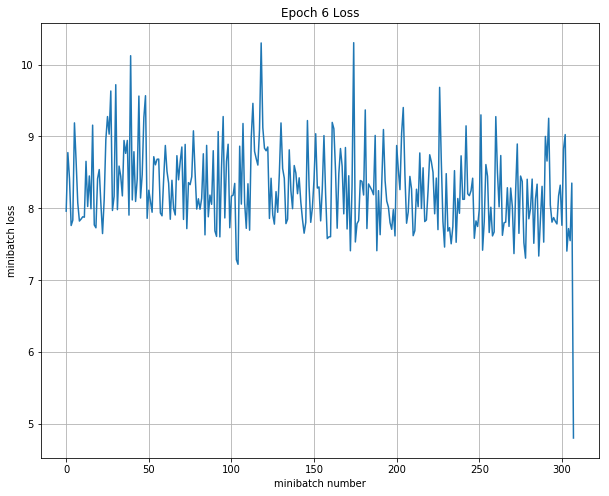

Iteration 1900: with minibatch training loss = 1.28 and accuracy of 0.83
Iteration 2000: with minibatch training loss = 1.37 and accuracy of 0.33
Iteration 2100: with minibatch training loss = 1.22 and accuracy of 0.33
Epoch 7, Overall loss = 1.37 and accuracy of 0.306


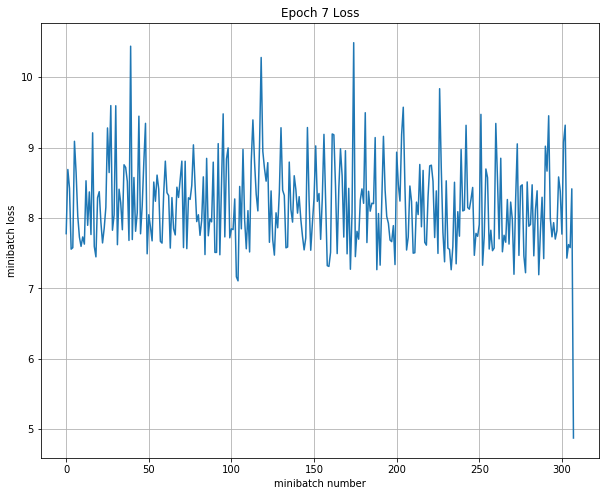

Iteration 2200: with minibatch training loss = 1.67 and accuracy of 0
Iteration 2300: with minibatch training loss = 1.26 and accuracy of 0.33
Iteration 2400: with minibatch training loss = 1.36 and accuracy of 0.5
Epoch 8, Overall loss = 1.38 and accuracy of 0.321


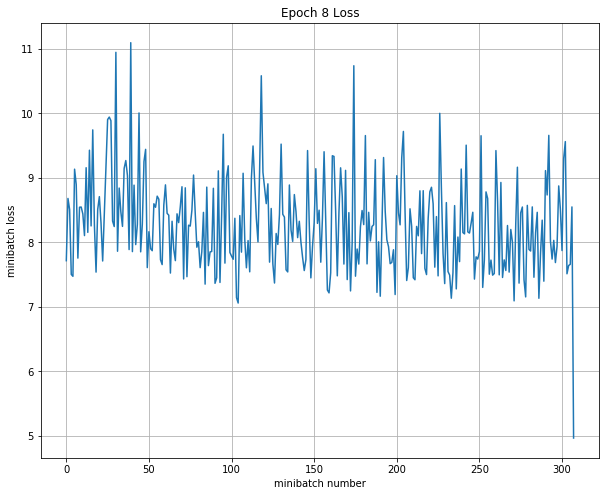

Iteration 2500: with minibatch training loss = 1.55 and accuracy of 0.17
Iteration 2600: with minibatch training loss = 1.37 and accuracy of 0.17
Iteration 2700: with minibatch training loss = 1.24 and accuracy of 0.5
Epoch 9, Overall loss = 1.4 and accuracy of 0.328


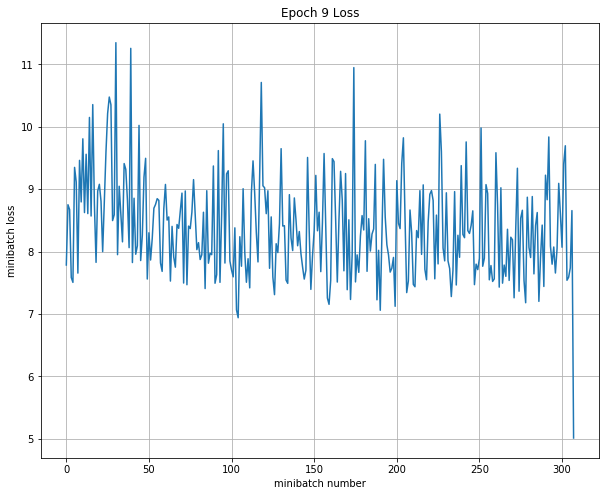

Iteration 2800: with minibatch training loss = 1.43 and accuracy of 0.17
Iteration 2900: with minibatch training loss = 1.32 and accuracy of 0
Iteration 3000: with minibatch training loss = 1.34 and accuracy of 0.17
Epoch 10, Overall loss = 1.41 and accuracy of 0.336


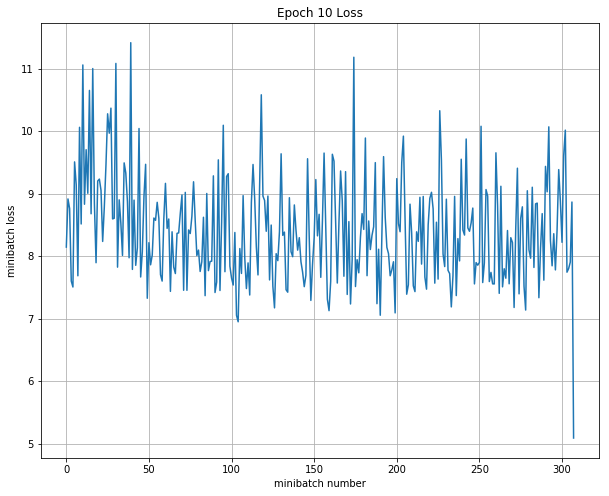

Train all layer
Iteration 0: with minibatch training loss = 1.57 and accuracy of 0.17
Iteration 100: with minibatch training loss = 1.44 and accuracy of 0
Iteration 200: with minibatch training loss = 1.25 and accuracy of 0.33
Iteration 300: with minibatch training loss = 1.2 and accuracy of 0.5
Epoch 1, Overall loss = 2.34 and accuracy of 0.332


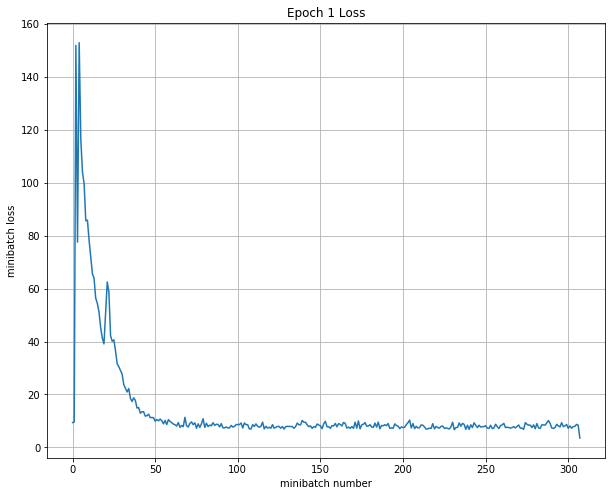

Iteration 400: with minibatch training loss = 1.2 and accuracy of 0.5
Iteration 500: with minibatch training loss = 1.2 and accuracy of 0.33
Iteration 600: with minibatch training loss = 1.26 and accuracy of 0.33
Epoch 2, Overall loss = 1.34 and accuracy of 0.332


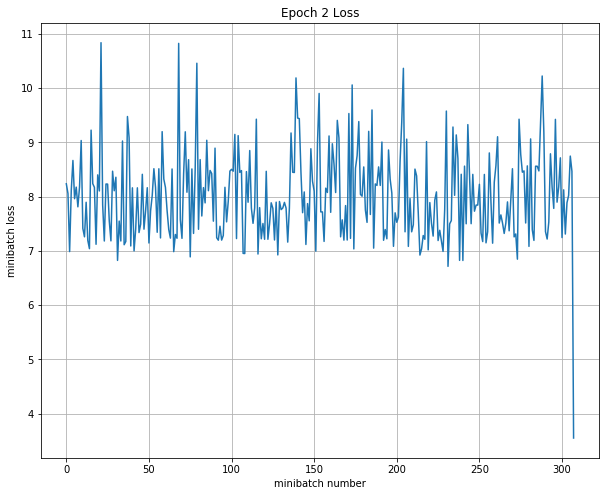

Iteration 700: with minibatch training loss = 1.32 and accuracy of 0
Iteration 800: with minibatch training loss = 1.29 and accuracy of 0.17
Iteration 900: with minibatch training loss = 1.44 and accuracy of 0.17
Epoch 3, Overall loss = 1.35 and accuracy of 0.331


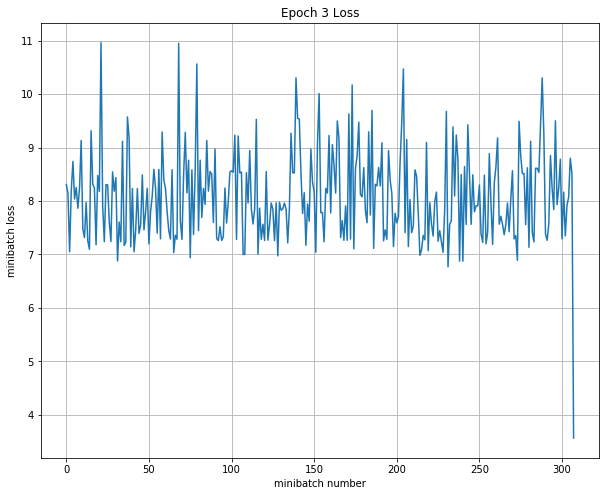

Iteration 1000: with minibatch training loss = 1.44 and accuracy of 0.17
Iteration 1100: with minibatch training loss = 1.48 and accuracy of 0.5
Iteration 1200: with minibatch training loss = 1.43 and accuracy of 0.33
Epoch 4, Overall loss = 1.36 and accuracy of 0.333


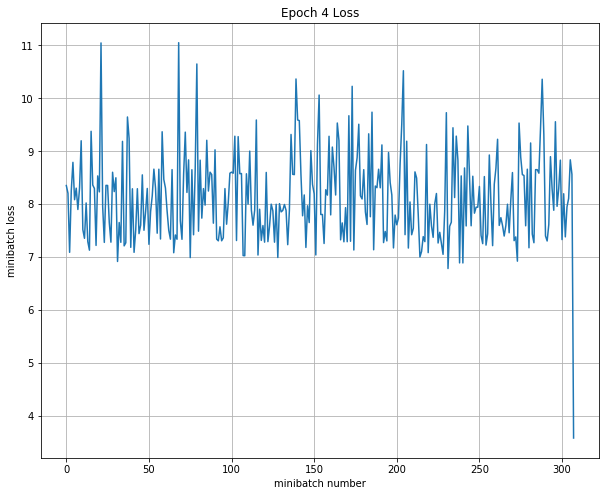

Iteration 1300: with minibatch training loss = 1.85 and accuracy of 0.17
Iteration 1400: with minibatch training loss = 1.22 and accuracy of 0.5
Iteration 1500: with minibatch training loss = 1.25 and accuracy of 0.5
Epoch 5, Overall loss = 1.36 and accuracy of 0.333


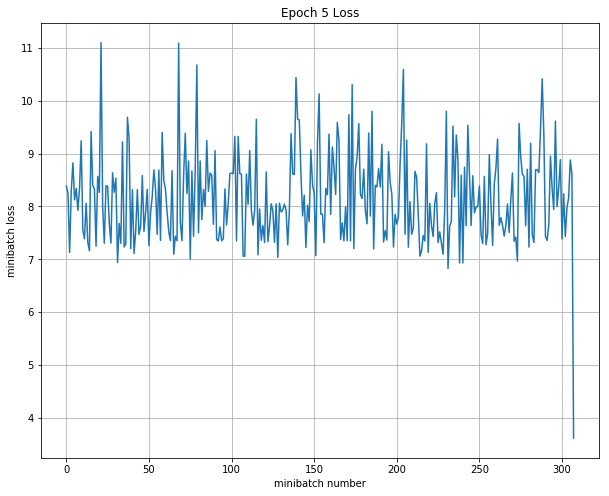

Iteration 1600: with minibatch training loss = 1.4 and accuracy of 0.33
Iteration 1700: with minibatch training loss = 1.32 and accuracy of 0.33
Iteration 1800: with minibatch training loss = 1.46 and accuracy of 0.17
Epoch 6, Overall loss = 1.37 and accuracy of 0.334


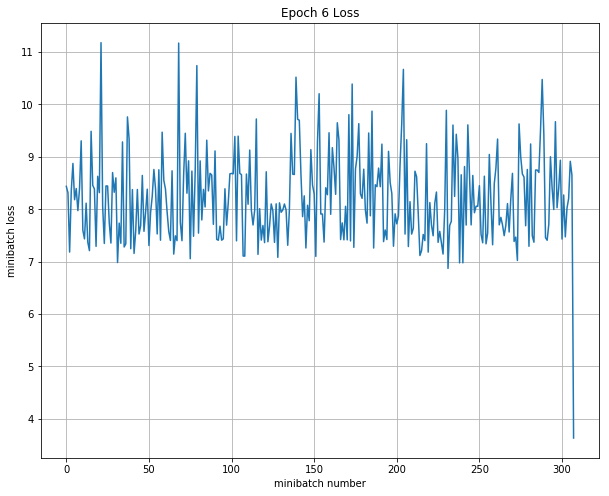

Iteration 1900: with minibatch training loss = 1.38 and accuracy of 0.17
Iteration 2000: with minibatch training loss = 1.55 and accuracy of 0.17
Iteration 2100: with minibatch training loss = 1.22 and accuracy of 0.5
Epoch 7, Overall loss = 1.37 and accuracy of 0.335


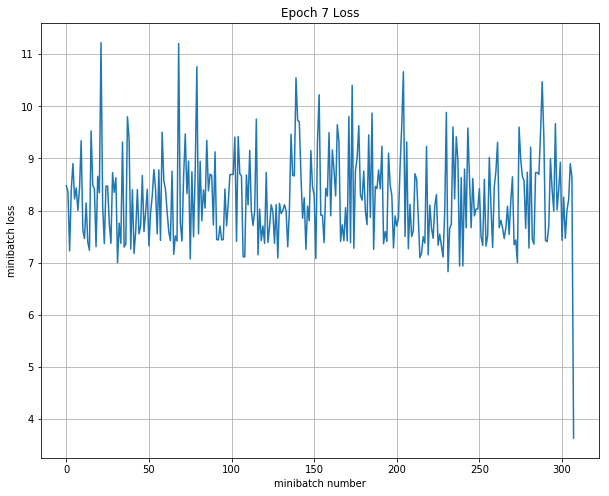

Iteration 2200: with minibatch training loss = 1.26 and accuracy of 0.17
Iteration 2300: with minibatch training loss = 1.37 and accuracy of 0.67
Iteration 2400: with minibatch training loss = 1.44 and accuracy of 0.33
Epoch 8, Overall loss = 1.38 and accuracy of 0.336


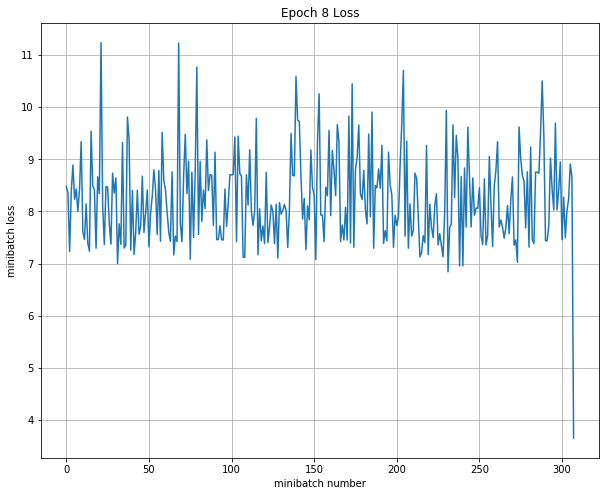

Iteration 2500: with minibatch training loss = 1.23 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 1.59 and accuracy of 0.33
Iteration 2700: with minibatch training loss = 1.58 and accuracy of 0.33
Epoch 9, Overall loss = 1.38 and accuracy of 0.338


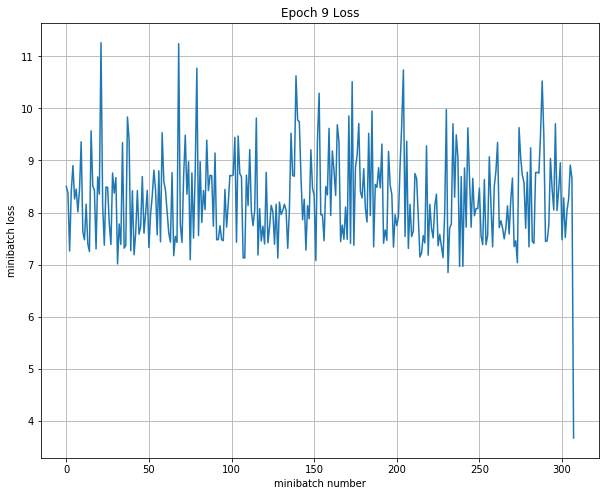

Iteration 2800: with minibatch training loss = 1.46 and accuracy of 0.17
Iteration 2900: with minibatch training loss = 1.18 and accuracy of 0.33
Iteration 3000: with minibatch training loss = 1.19 and accuracy of 0.5
Epoch 10, Overall loss = 1.38 and accuracy of 0.34


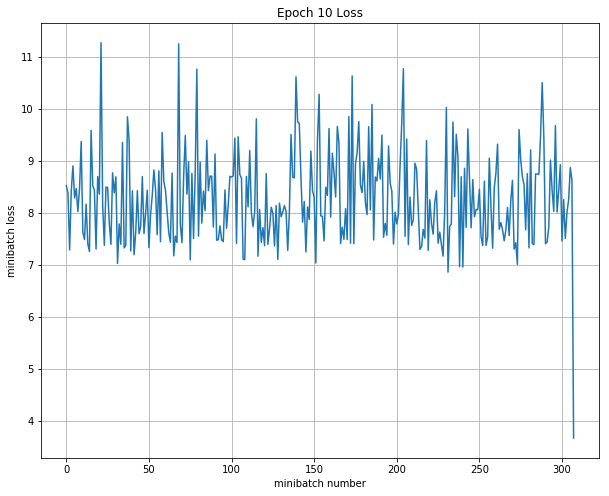

Validation
Epoch 1, Overall loss = 1.37 and accuracy of 0.35
Test
Epoch 1, Overall loss = 1.35 and accuracy of 0.38

--------------------------------------------------------------------------------
Trial number: 4
--------------------------------------------------------------------------------
reg: 0.068797, lr: 0.000085, dr: 0.800892, dc: 665, FC_size: 100 
INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


Train last layer
Iteration 0: with minibatch training loss = 8.54 and accuracy of 0.5
Iteration 100: with minibatch training loss = 3.88 and accuracy of 0.5
Iteration 200: with minibatch training loss = 4.28 and accuracy of 0.17
Iteration 300: with minibatch training loss = 3.28 and accuracy of 0.33
Epoch 1, Overall loss = 4.71 and accuracy of 0.358


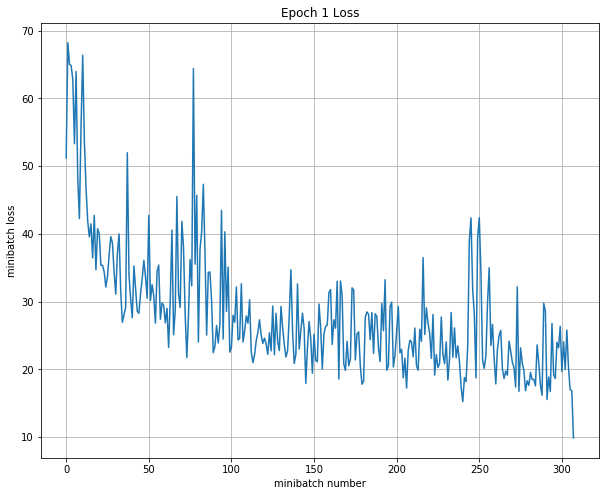

Iteration 400: with minibatch training loss = 2.95 and accuracy of 0.83
Iteration 500: with minibatch training loss = 2.85 and accuracy of 0.5
Iteration 600: with minibatch training loss = 2.46 and accuracy of 0.33
Epoch 2, Overall loss = 3.14 and accuracy of 0.435


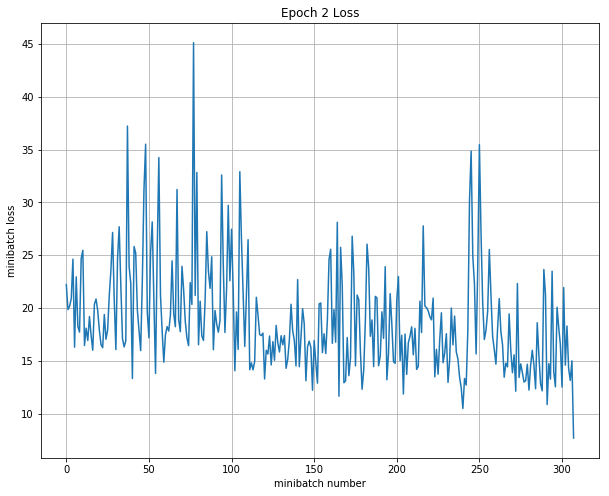

Iteration 700: with minibatch training loss = 2.67 and accuracy of 0.5
Iteration 800: with minibatch training loss = 2.05 and accuracy of 0.5
Iteration 900: with minibatch training loss = 1.76 and accuracy of 0.67
Epoch 3, Overall loss = 2.61 and accuracy of 0.456


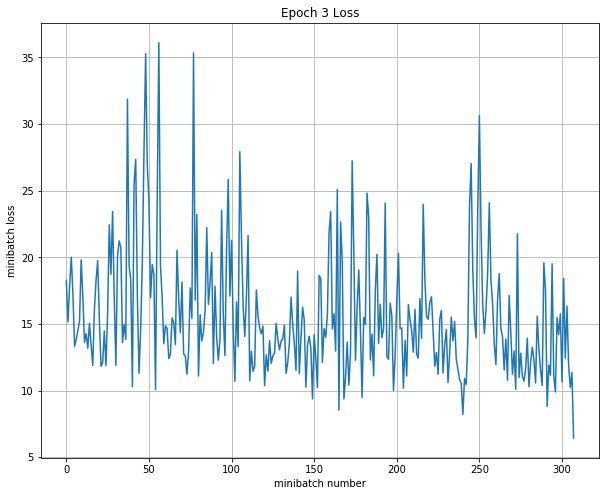

Iteration 1000: with minibatch training loss = 2.13 and accuracy of 0.83
Iteration 1100: with minibatch training loss = 2.36 and accuracy of 0.5
Iteration 1200: with minibatch training loss = 1.63 and accuracy of 0.67
Epoch 4, Overall loss = 2.25 and accuracy of 0.467


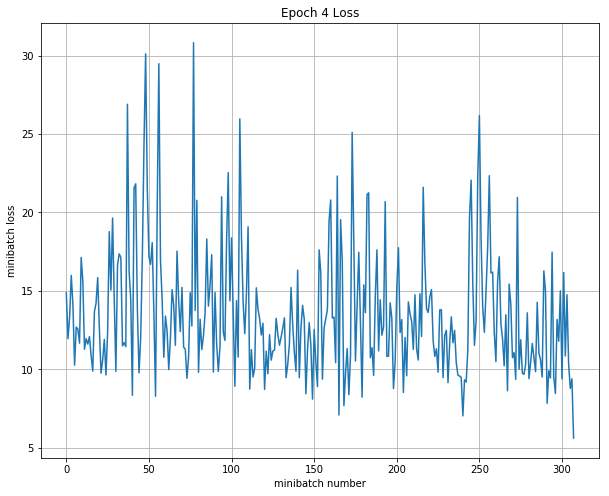

Iteration 1300: with minibatch training loss = 2.17 and accuracy of 0.5
Iteration 1400: with minibatch training loss = 1.07 and accuracy of 1
Iteration 1500: with minibatch training loss = 2.26 and accuracy of 0
Epoch 5, Overall loss = 2.04 and accuracy of 0.475


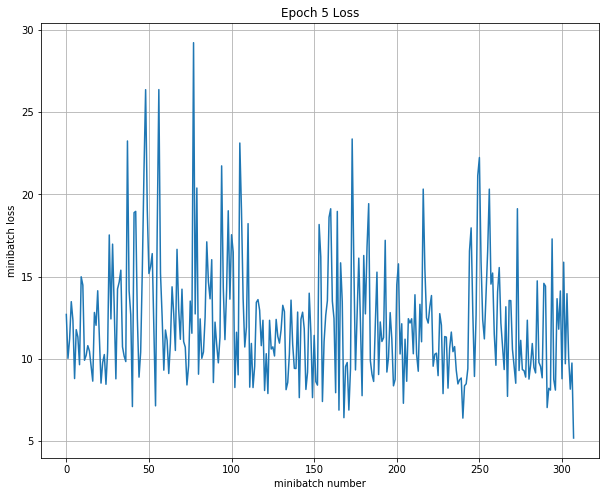

Iteration 1600: with minibatch training loss = 1.86 and accuracy of 0.67
Iteration 1700: with minibatch training loss = 3.31 and accuracy of 0.17
Iteration 1800: with minibatch training loss = 1.49 and accuracy of 0.5
Epoch 6, Overall loss = 1.91 and accuracy of 0.468


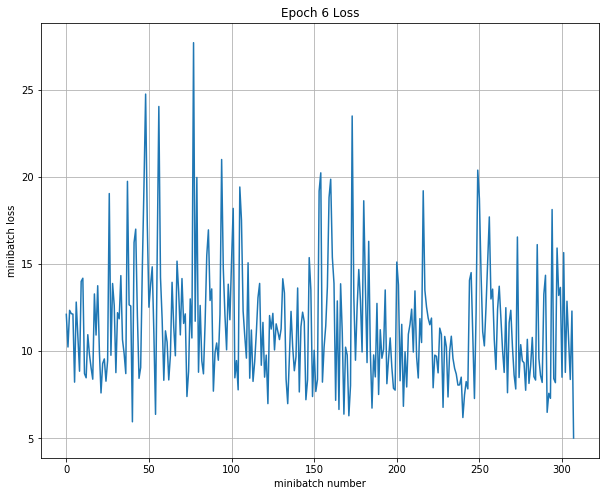

Iteration 1900: with minibatch training loss = 2.27 and accuracy of 0.33
Iteration 2000: with minibatch training loss = 1.34 and accuracy of 0.67
Iteration 2100: with minibatch training loss = 1.72 and accuracy of 0.67
Epoch 7, Overall loss = 1.82 and accuracy of 0.458


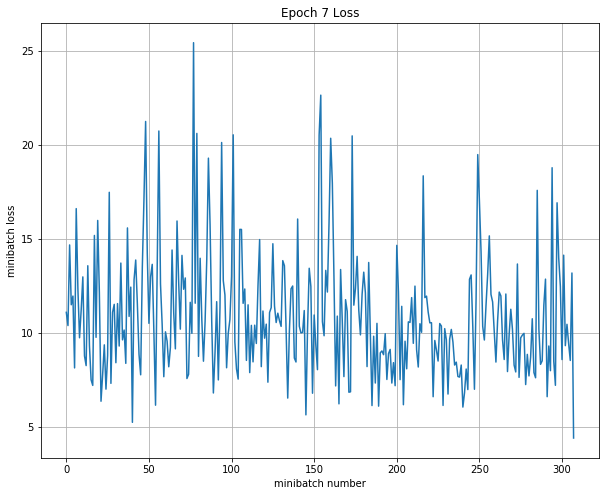

Iteration 2200: with minibatch training loss = 0.988 and accuracy of 0.83
Iteration 2300: with minibatch training loss = 1.7 and accuracy of 0.5
Iteration 2400: with minibatch training loss = 2.11 and accuracy of 0.5
Epoch 8, Overall loss = 1.76 and accuracy of 0.459


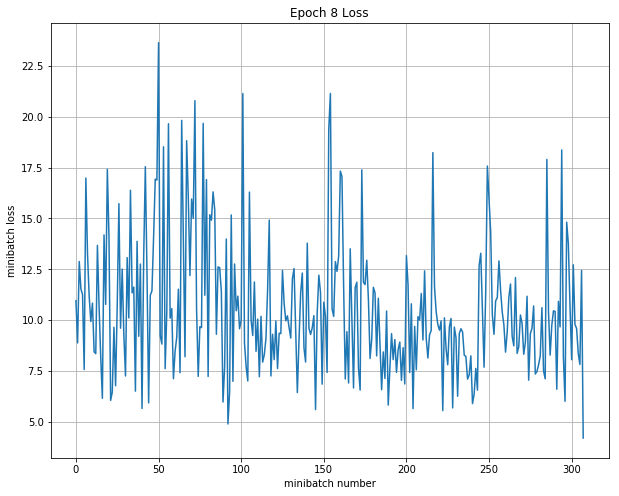

Iteration 2500: with minibatch training loss = 0.932 and accuracy of 0.83
Iteration 2600: with minibatch training loss = 1.9 and accuracy of 0.33
Iteration 2700: with minibatch training loss = 1.35 and accuracy of 0.33
Epoch 9, Overall loss = 1.7 and accuracy of 0.451


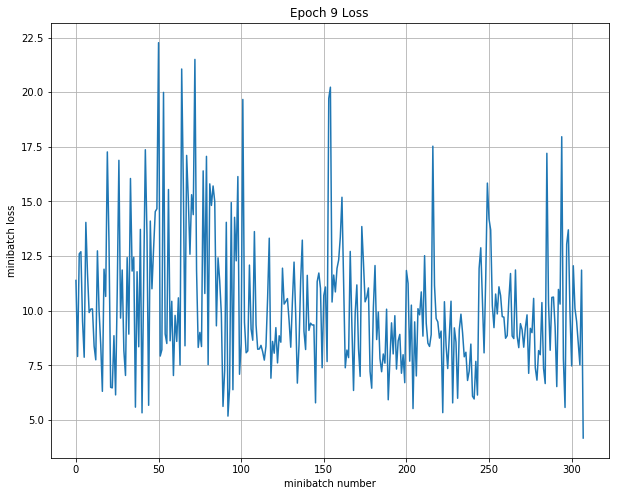

Iteration 2800: with minibatch training loss = 1.97 and accuracy of 0.33
Iteration 2900: with minibatch training loss = 1.94 and accuracy of 0.33
Iteration 3000: with minibatch training loss = 1.04 and accuracy of 0.83
Epoch 10, Overall loss = 1.66 and accuracy of 0.447


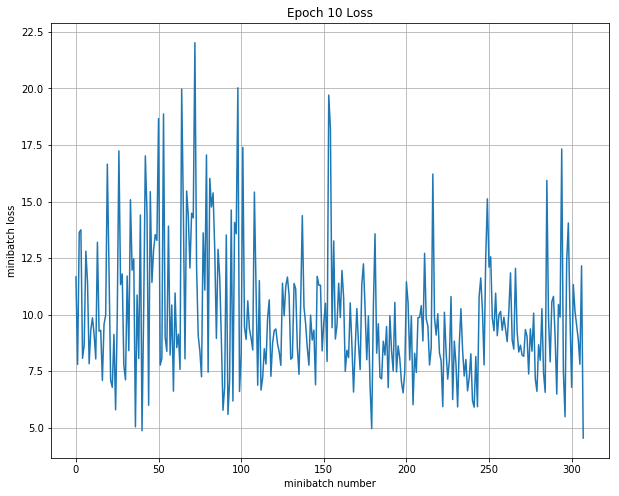

Train all layer
Iteration 0: with minibatch training loss = 1.68 and accuracy of 0.33
Iteration 100: with minibatch training loss = 1.05 and accuracy of 0.83
Iteration 200: with minibatch training loss = 1.18 and accuracy of 0.67
Iteration 300: with minibatch training loss = 1.03 and accuracy of 0.83
Epoch 1, Overall loss = 1.38 and accuracy of 0.519


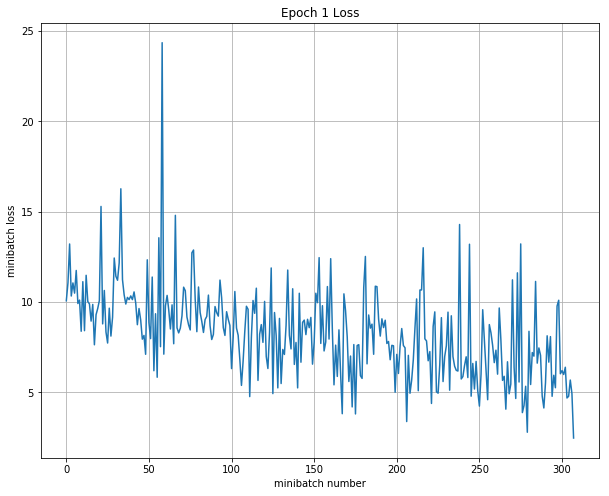

Iteration 400: with minibatch training loss = 1.71 and accuracy of 0.33
Iteration 500: with minibatch training loss = 0.613 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.746 and accuracy of 1
Epoch 2, Overall loss = 0.98 and accuracy of 0.713


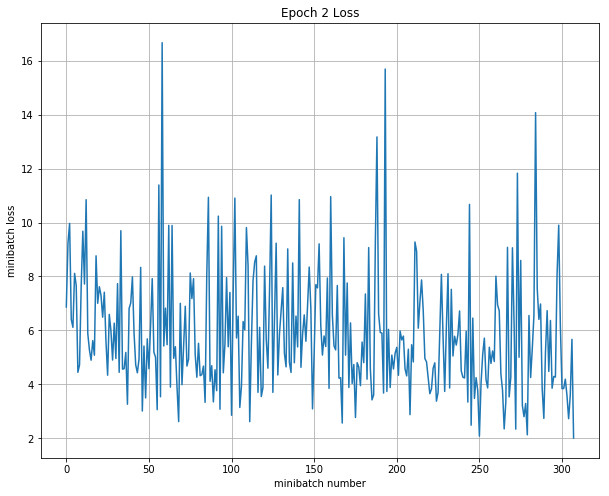

Iteration 700: with minibatch training loss = 0.515 and accuracy of 1
Iteration 800: with minibatch training loss = 0.534 and accuracy of 0.83
Iteration 900: with minibatch training loss = 1.59 and accuracy of 0.67
Epoch 3, Overall loss = 0.795 and accuracy of 0.785


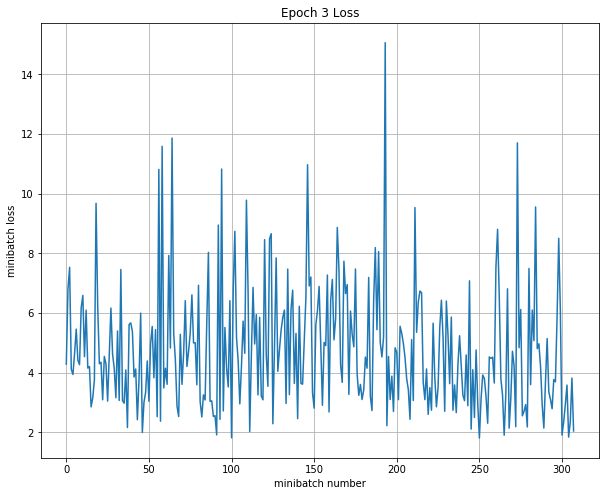

Iteration 1000: with minibatch training loss = 0.937 and accuracy of 0.83
Iteration 1100: with minibatch training loss = 0.436 and accuracy of 1
Iteration 1200: with minibatch training loss = 0.393 and accuracy of 1
Epoch 4, Overall loss = 0.668 and accuracy of 0.843


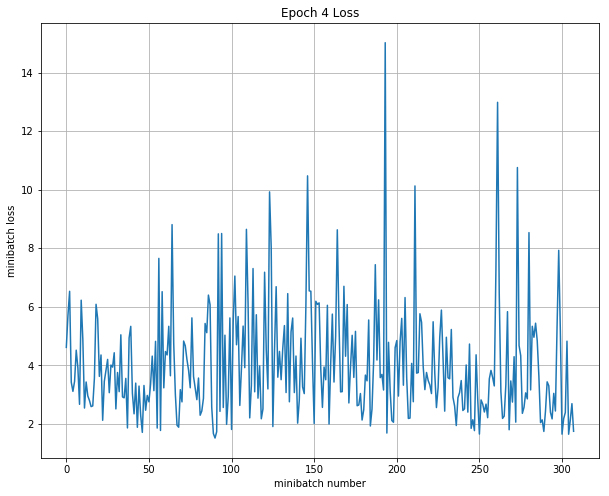

Iteration 1300: with minibatch training loss = 0.312 and accuracy of 1
Iteration 1400: with minibatch training loss = 0.999 and accuracy of 0.83
Iteration 1500: with minibatch training loss = 0.246 and accuracy of 1
Epoch 5, Overall loss = 0.557 and accuracy of 0.89


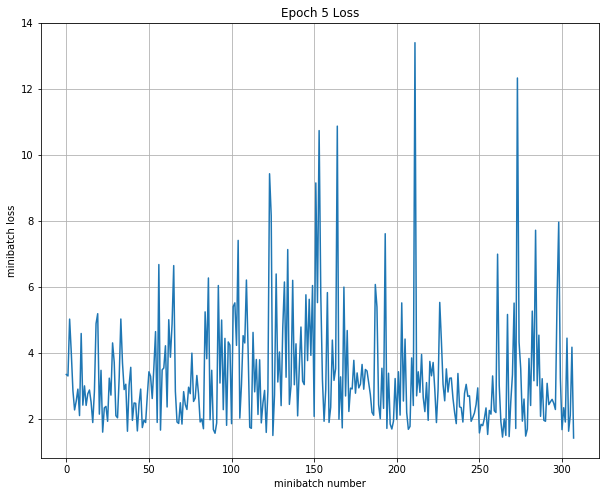

Iteration 1600: with minibatch training loss = 0.422 and accuracy of 1
Iteration 1700: with minibatch training loss = 0.285 and accuracy of 1
Iteration 1800: with minibatch training loss = 0.394 and accuracy of 0.83
Epoch 6, Overall loss = 0.45 and accuracy of 0.92


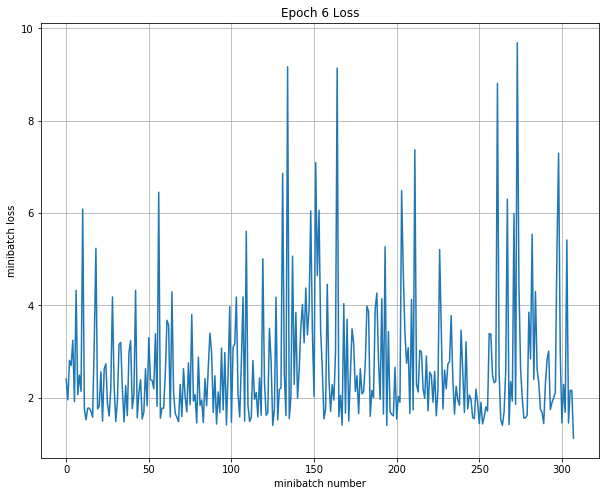

Iteration 1900: with minibatch training loss = 0.393 and accuracy of 0.83
Iteration 2000: with minibatch training loss = 0.634 and accuracy of 1
Iteration 2100: with minibatch training loss = 0.313 and accuracy of 1
Epoch 7, Overall loss = 0.469 and accuracy of 0.916


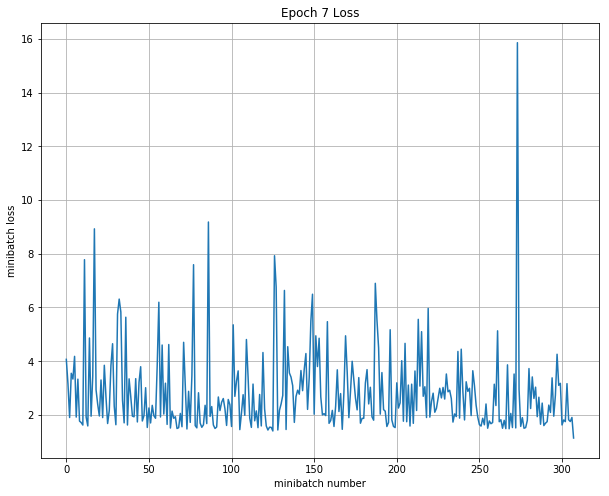

Iteration 2200: with minibatch training loss = 0.3 and accuracy of 1
Iteration 2300: with minibatch training loss = 0.464 and accuracy of 0.83
Iteration 2400: with minibatch training loss = 0.685 and accuracy of 0.67
Epoch 8, Overall loss = 0.412 and accuracy of 0.93


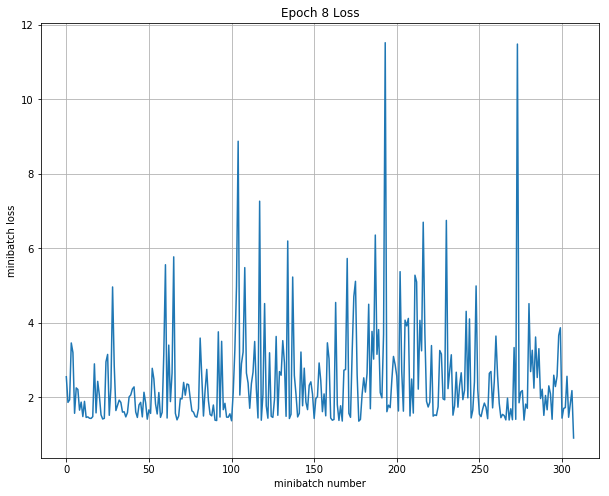

Iteration 2500: with minibatch training loss = 0.56 and accuracy of 0.83
Iteration 2600: with minibatch training loss = 0.231 and accuracy of 1
Iteration 2700: with minibatch training loss = 0.315 and accuracy of 1
Epoch 9, Overall loss = 0.358 and accuracy of 0.953


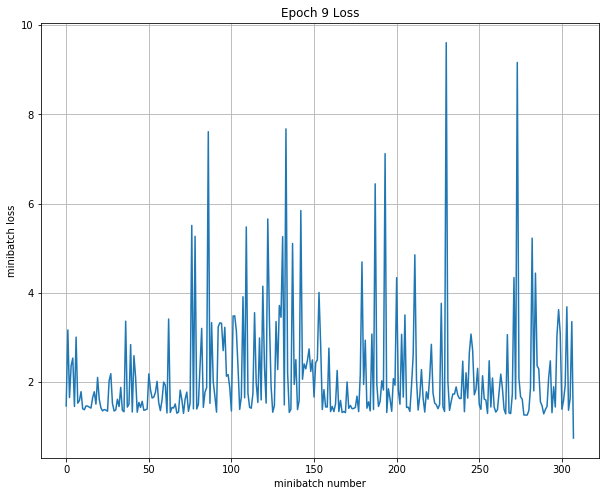

Iteration 2800: with minibatch training loss = 0.327 and accuracy of 1
Iteration 2900: with minibatch training loss = 0.255 and accuracy of 1
Iteration 3000: with minibatch training loss = 0.333 and accuracy of 0.83
Epoch 10, Overall loss = 0.337 and accuracy of 0.959


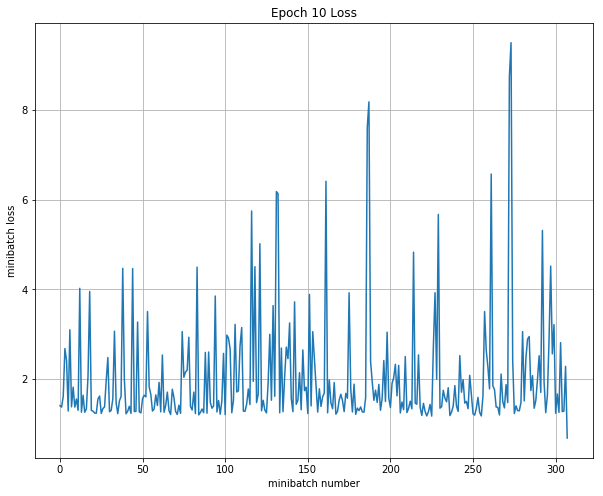

Validation
Epoch 1, Overall loss = 0.624 and accuracy of 0.87
Test
Epoch 1, Overall loss = 0.418 and accuracy of 0.94

--------------------------------------------------------------------------------
Trial number: 5
--------------------------------------------------------------------------------
reg: 4.291679, lr: 0.002359, dr: 0.962538, dc: 628, FC_size: 100 
INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


Train last layer
Iteration 0: with minibatch training loss = 447 and accuracy of 0.5
Iteration 100: with minibatch training loss = 5.18 and accuracy of 0.33
Iteration 200: with minibatch training loss = 3.59 and accuracy of 0.17
Iteration 300: with minibatch training loss = 1.46 and accuracy of 0.17
Epoch 1, Overall loss = 18.2 and accuracy of 0.291


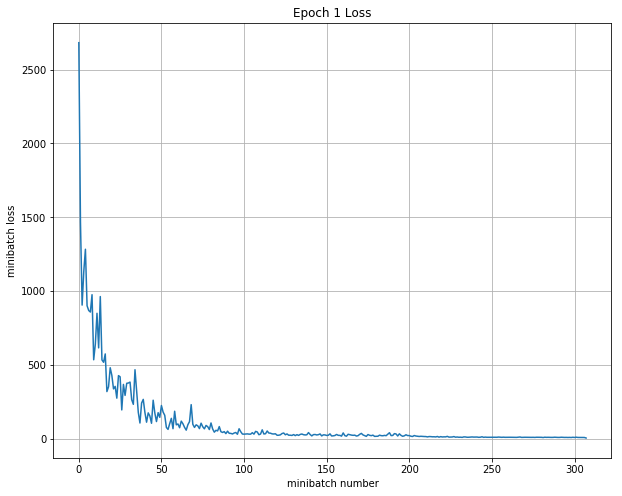

Iteration 400: with minibatch training loss = 1.43 and accuracy of 0.33
Iteration 500: with minibatch training loss = 1.34 and accuracy of 0.33
Iteration 600: with minibatch training loss = 1.45 and accuracy of 0.17
Epoch 2, Overall loss = 1.42 and accuracy of 0.306


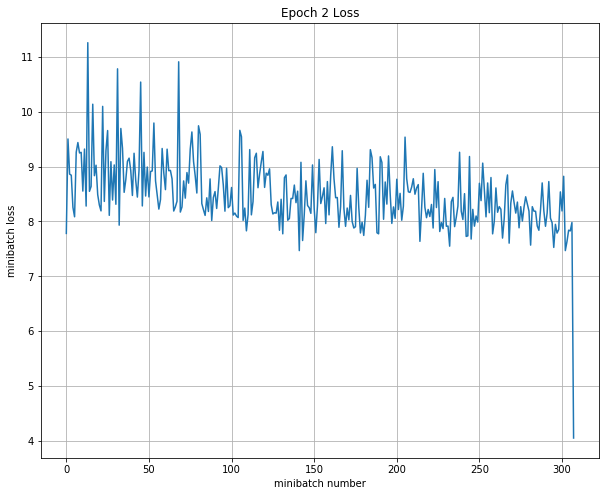

Iteration 700: with minibatch training loss = 1.28 and accuracy of 0.67
Iteration 800: with minibatch training loss = 1.56 and accuracy of 0.17
Iteration 900: with minibatch training loss = 1.34 and accuracy of 0.5
Epoch 3, Overall loss = 1.35 and accuracy of 0.334


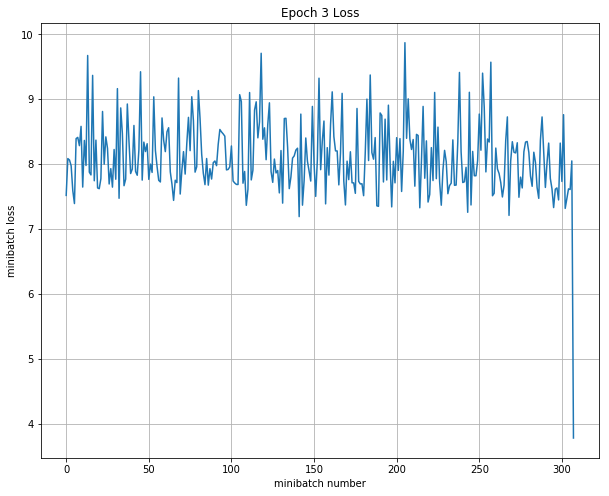

Iteration 1000: with minibatch training loss = 1.48 and accuracy of 0.17
Iteration 1100: with minibatch training loss = 1.49 and accuracy of 0.17
Iteration 1200: with minibatch training loss = 1.24 and accuracy of 0.33
Epoch 4, Overall loss = 1.33 and accuracy of 0.334


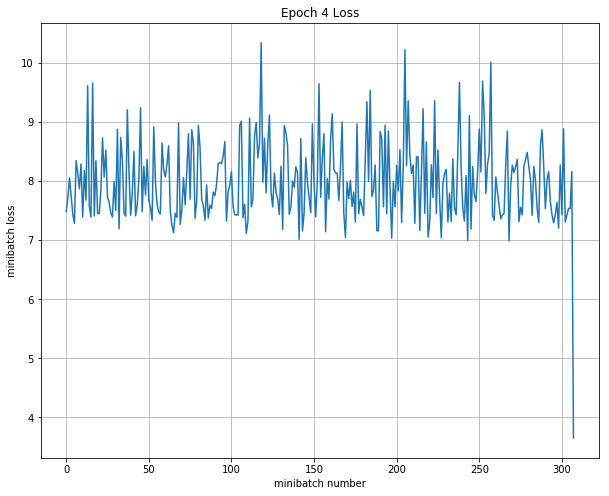

Iteration 1300: with minibatch training loss = 1.5 and accuracy of 0.33
Iteration 1400: with minibatch training loss = 1.33 and accuracy of 0.33
Iteration 1500: with minibatch training loss = 1.23 and accuracy of 0.83
Epoch 5, Overall loss = 1.42 and accuracy of 0.334


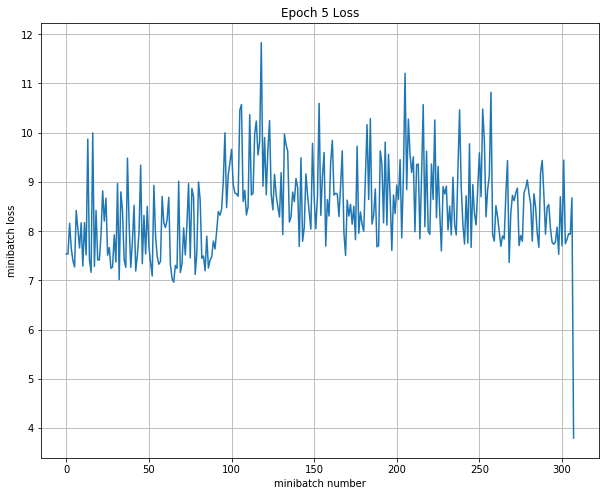

Iteration 1600: with minibatch training loss = 1.42 and accuracy of 0.5
Iteration 1700: with minibatch training loss = 1.55 and accuracy of 0
Iteration 1800: with minibatch training loss = 1.44 and accuracy of 0.33
Epoch 6, Overall loss = 1.42 and accuracy of 0.332


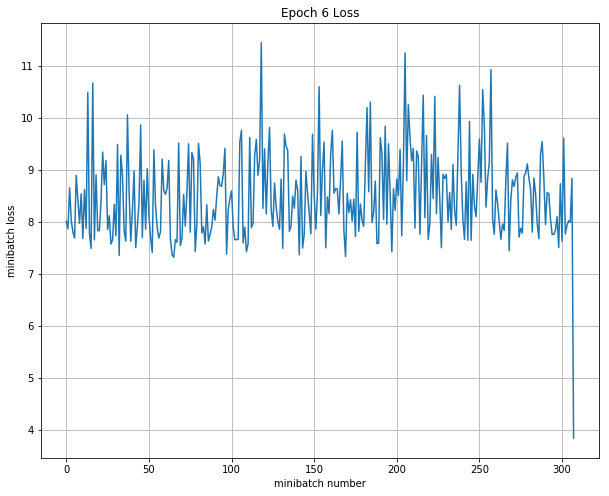

Iteration 1900: with minibatch training loss = 1.23 and accuracy of 0.5
Iteration 2000: with minibatch training loss = 1.45 and accuracy of 0
Iteration 2100: with minibatch training loss = 1.78 and accuracy of 0.17
Epoch 7, Overall loss = 1.43 and accuracy of 0.333


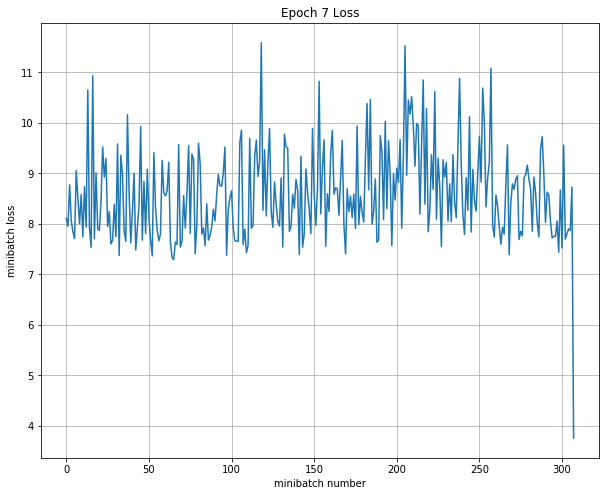

Iteration 2200: with minibatch training loss = 1.37 and accuracy of 0.33
Iteration 2300: with minibatch training loss = 1.37 and accuracy of 0.33
Iteration 2400: with minibatch training loss = 1.74 and accuracy of 0
Epoch 8, Overall loss = 1.48 and accuracy of 0.338


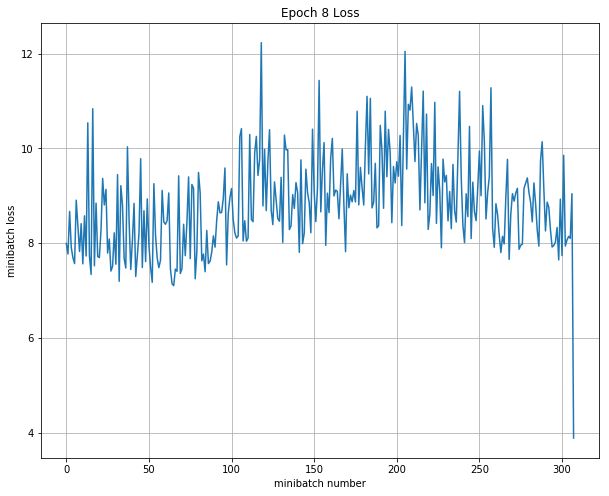

Iteration 2500: with minibatch training loss = 1.29 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 1.36 and accuracy of 0.33
Iteration 2700: with minibatch training loss = 1.46 and accuracy of 0.33
Epoch 9, Overall loss = 1.5 and accuracy of 0.338


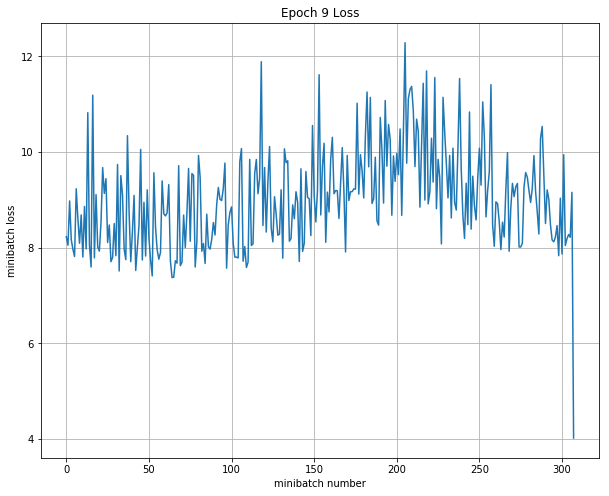

Iteration 2800: with minibatch training loss = 1.32 and accuracy of 0.5
Iteration 2900: with minibatch training loss = 1.41 and accuracy of 0.17
Iteration 3000: with minibatch training loss = 2.01 and accuracy of 0.17
Epoch 10, Overall loss = 1.54 and accuracy of 0.333


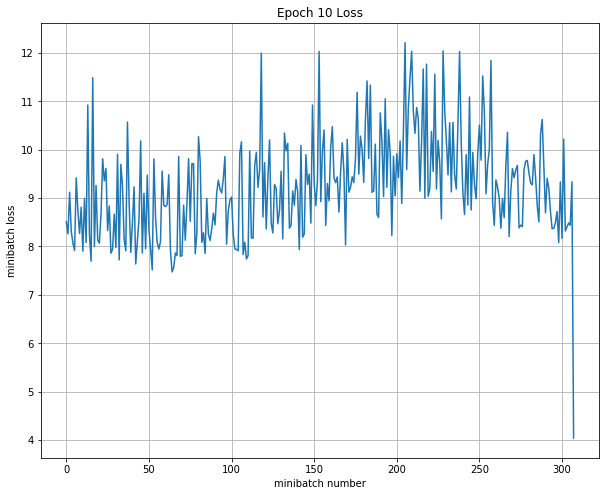

Train all layer
Iteration 0: with minibatch training loss = 1.35 and accuracy of 0.5
Iteration 100: with minibatch training loss = 3.11 and accuracy of 0.5
Iteration 200: with minibatch training loss = 2.12 and accuracy of 0.17
Iteration 300: with minibatch training loss = 1.76 and accuracy of 0.33
Epoch 1, Overall loss = 68.1 and accuracy of 0.319


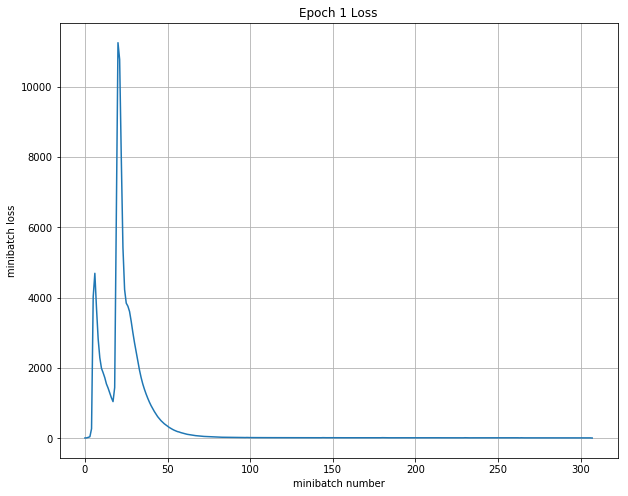

Iteration 400: with minibatch training loss = 1.8 and accuracy of 0.67
Iteration 500: with minibatch training loss = 1.38 and accuracy of 0.67
Iteration 600: with minibatch training loss = 1.42 and accuracy of 0.17
Epoch 2, Overall loss = 1.64 and accuracy of 0.334


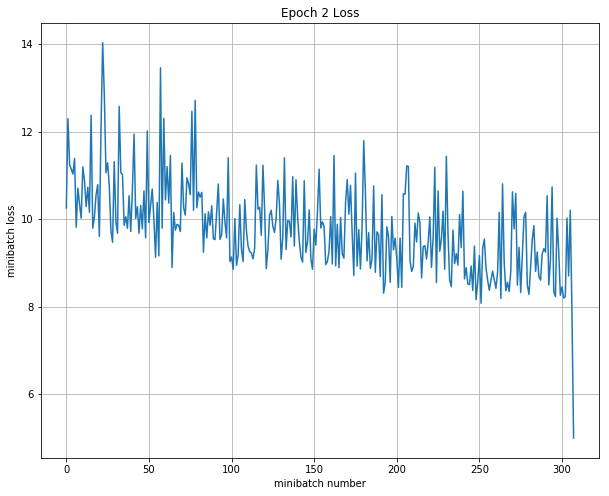

Iteration 700: with minibatch training loss = 1.45 and accuracy of 0.67
Iteration 800: with minibatch training loss = 1.32 and accuracy of 0.5
Iteration 900: with minibatch training loss = 1.34 and accuracy of 0.5
Epoch 3, Overall loss = 1.44 and accuracy of 0.334


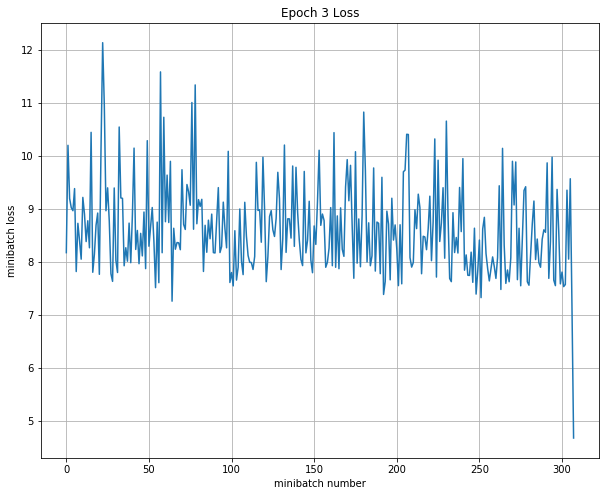

Iteration 1000: with minibatch training loss = 1.77 and accuracy of 0.17
Iteration 1100: with minibatch training loss = 1.28 and accuracy of 0.33
Iteration 1200: with minibatch training loss = 1.38 and accuracy of 0.33
Epoch 4, Overall loss = 1.38 and accuracy of 0.334


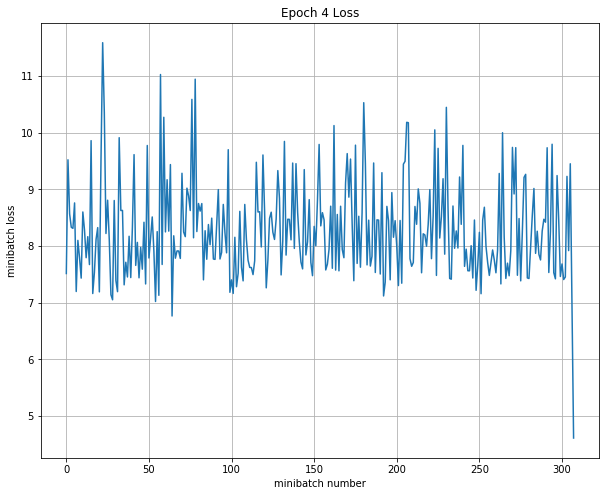

Iteration 1300: with minibatch training loss = 1.3 and accuracy of 0.17
Iteration 1400: with minibatch training loss = 1.29 and accuracy of 0.17
Iteration 1500: with minibatch training loss = 1.24 and accuracy of 0.33
Epoch 5, Overall loss = 1.37 and accuracy of 0.334


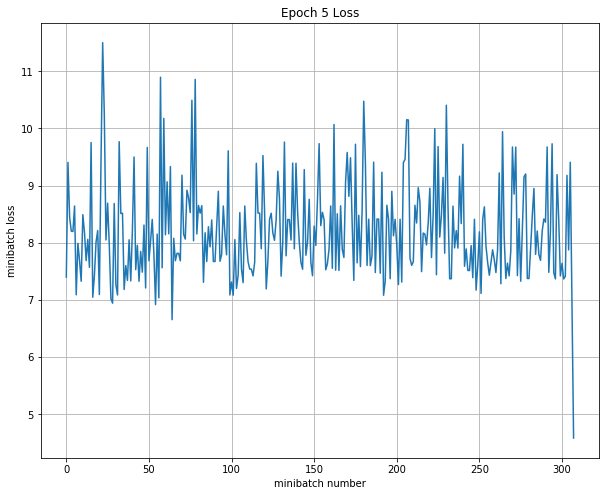

Iteration 1600: with minibatch training loss = 1.36 and accuracy of 0.33
Iteration 1700: with minibatch training loss = 1.44 and accuracy of 0.33
Iteration 1800: with minibatch training loss = 1.26 and accuracy of 0.17
Epoch 6, Overall loss = 1.38 and accuracy of 0.334


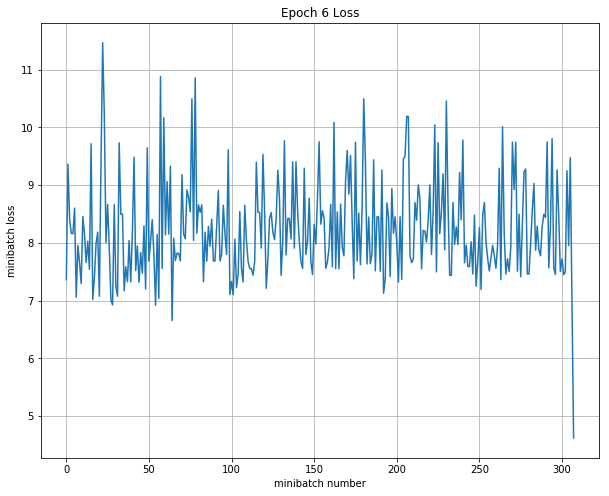

Iteration 1900: with minibatch training loss = 1.41 and accuracy of 0.33
Iteration 2000: with minibatch training loss = 1.47 and accuracy of 0.17
Iteration 2100: with minibatch training loss = 1.41 and accuracy of 0.33
Epoch 7, Overall loss = 1.38 and accuracy of 0.334


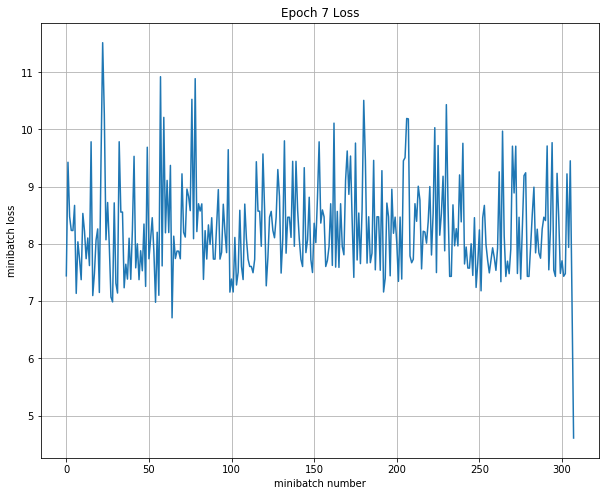

Iteration 2200: with minibatch training loss = 1.23 and accuracy of 0.5
Iteration 2300: with minibatch training loss = 1.56 and accuracy of 0.17
Iteration 2400: with minibatch training loss = 1.27 and accuracy of 0.17
Epoch 8, Overall loss = 1.39 and accuracy of 0.334


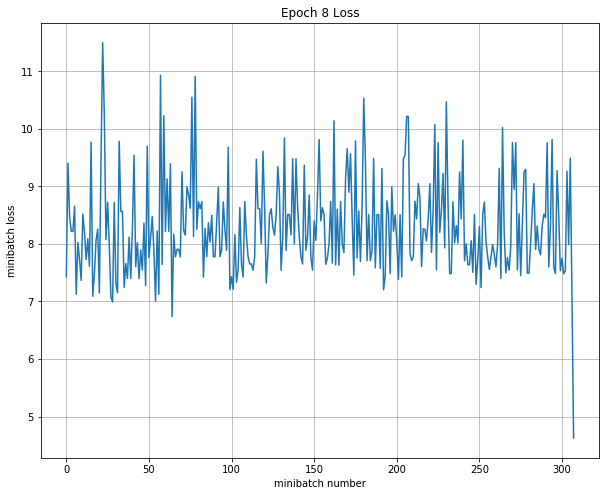

Iteration 2500: with minibatch training loss = 1.28 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 1.36 and accuracy of 0.5
Iteration 2700: with minibatch training loss = 1.39 and accuracy of 0.17
Epoch 9, Overall loss = 1.39 and accuracy of 0.334


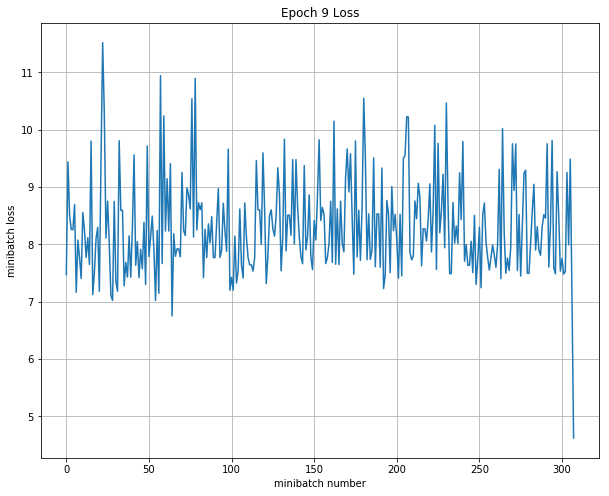

Iteration 2800: with minibatch training loss = 1.17 and accuracy of 0.83
Iteration 2900: with minibatch training loss = 1.55 and accuracy of 0.17
Iteration 3000: with minibatch training loss = 1.53 and accuracy of 0.33
Epoch 10, Overall loss = 1.39 and accuracy of 0.334


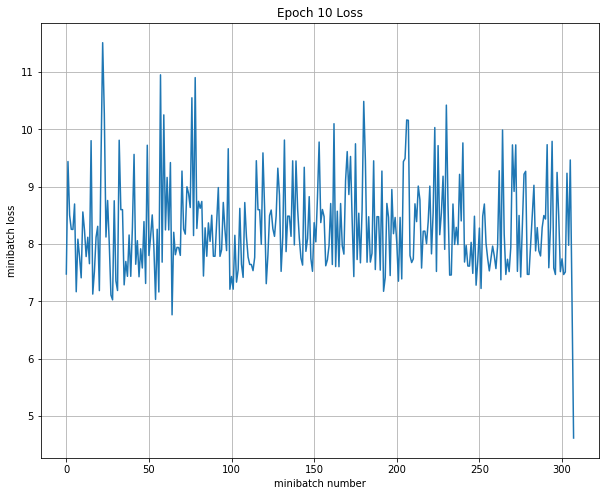

Validation
Epoch 1, Overall loss = 1.38 and accuracy of 0.35
Test
Epoch 1, Overall loss = 1.35 and accuracy of 0.38

--------------------------------------------------------------------------------
Trial number: 6
--------------------------------------------------------------------------------
reg: 0.156836, lr: 0.000054, dr: 0.910519, dc: 915, FC_size: 100 
INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


Train last layer
Iteration 0: with minibatch training loss = 17.8 and accuracy of 0.17
Iteration 100: with minibatch training loss = 8.18 and accuracy of 0
Iteration 200: with minibatch training loss = 5.51 and accuracy of 0.33
Iteration 300: with minibatch training loss = 4.45 and accuracy of 0.5
Epoch 1, Overall loss = 7.59 and accuracy of 0.344


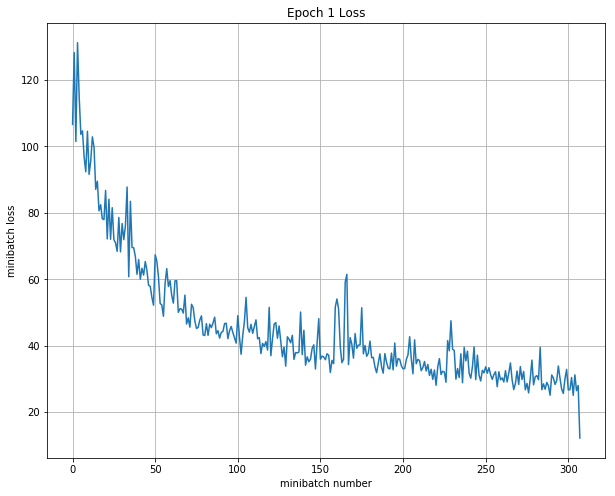

Iteration 400: with minibatch training loss = 4.28 and accuracy of 0.33
Iteration 500: with minibatch training loss = 3.26 and accuracy of 0.83
Iteration 600: with minibatch training loss = 3.26 and accuracy of 0.17
Epoch 2, Overall loss = 4.06 and accuracy of 0.374


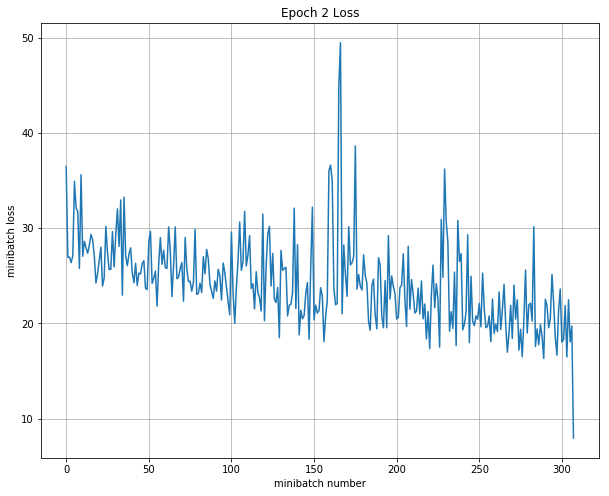

Iteration 700: with minibatch training loss = 3.06 and accuracy of 0.67
Iteration 800: with minibatch training loss = 2.36 and accuracy of 0.67
Iteration 900: with minibatch training loss = 2.29 and accuracy of 0.67
Epoch 3, Overall loss = 3.09 and accuracy of 0.388


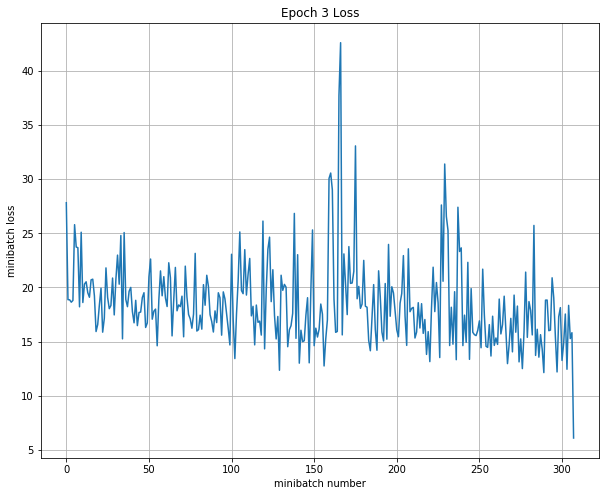

Iteration 1000: with minibatch training loss = 2.12 and accuracy of 0.33
Iteration 1100: with minibatch training loss = 2.6 and accuracy of 0
Iteration 1200: with minibatch training loss = 1.75 and accuracy of 0.67
Epoch 4, Overall loss = 2.59 and accuracy of 0.384


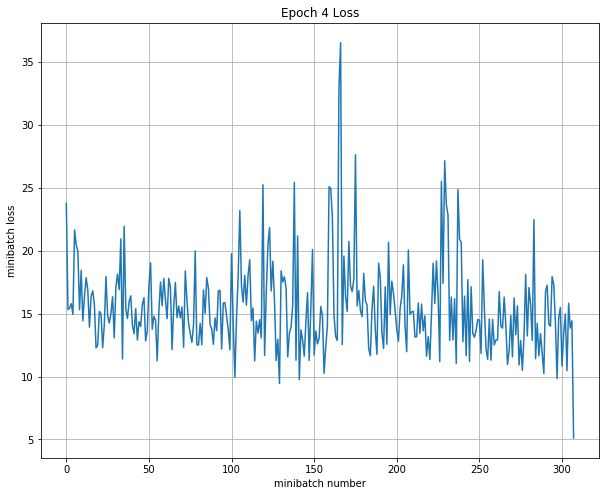

Iteration 1300: with minibatch training loss = 2.48 and accuracy of 0
Iteration 1400: with minibatch training loss = 2.76 and accuracy of 0.17
Iteration 1500: with minibatch training loss = 1.79 and accuracy of 0.67
Epoch 5, Overall loss = 2.3 and accuracy of 0.383


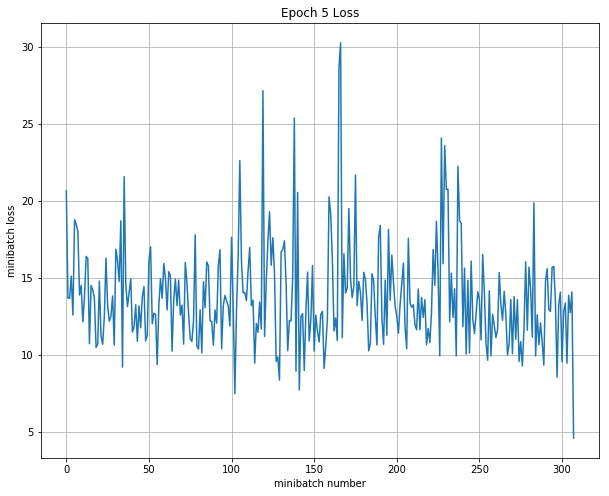

Iteration 1600: with minibatch training loss = 2.52 and accuracy of 0.17
Iteration 1700: with minibatch training loss = 2.83 and accuracy of 0.33
Iteration 1800: with minibatch training loss = 1.6 and accuracy of 0.5
Epoch 6, Overall loss = 2.12 and accuracy of 0.385


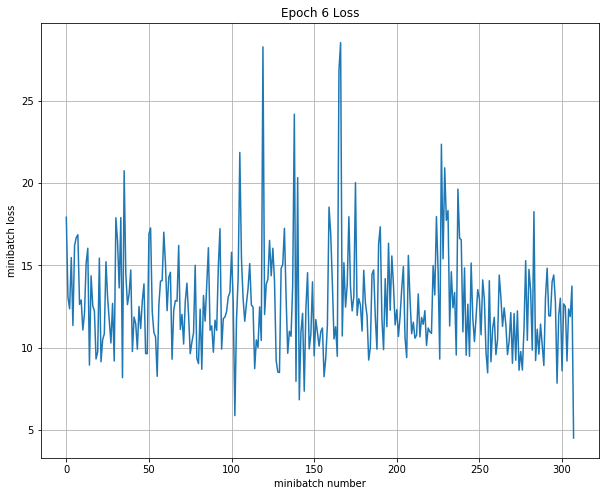

Iteration 1900: with minibatch training loss = 2.19 and accuracy of 0.33
Iteration 2000: with minibatch training loss = 1.69 and accuracy of 0.67
Iteration 2100: with minibatch training loss = 2.02 and accuracy of 0
Epoch 7, Overall loss = 2 and accuracy of 0.386


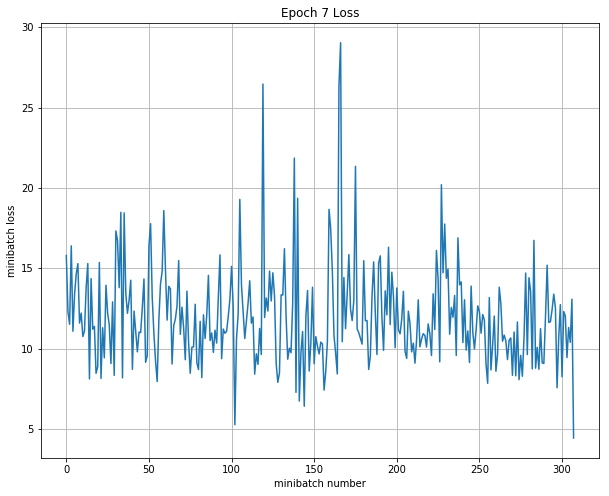

Iteration 2200: with minibatch training loss = 1.69 and accuracy of 0.5
Iteration 2300: with minibatch training loss = 0.973 and accuracy of 0.83
Iteration 2400: with minibatch training loss = 1.55 and accuracy of 0.67
Epoch 8, Overall loss = 1.91 and accuracy of 0.375


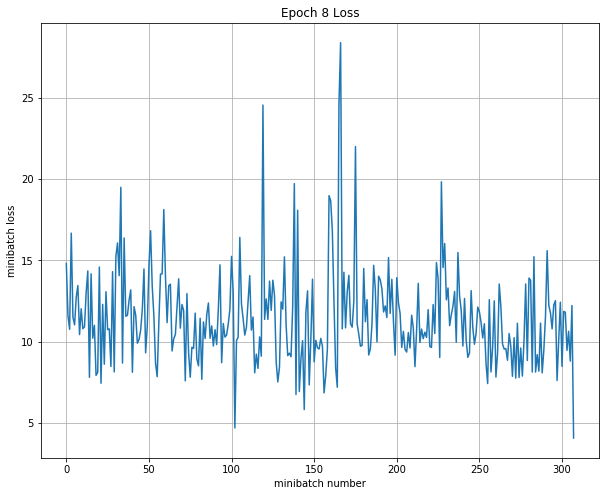

Iteration 2500: with minibatch training loss = 1.61 and accuracy of 0.67
Iteration 2600: with minibatch training loss = 1.42 and accuracy of 0.33
Iteration 2700: with minibatch training loss = 1.67 and accuracy of 0.5
Epoch 9, Overall loss = 1.86 and accuracy of 0.363


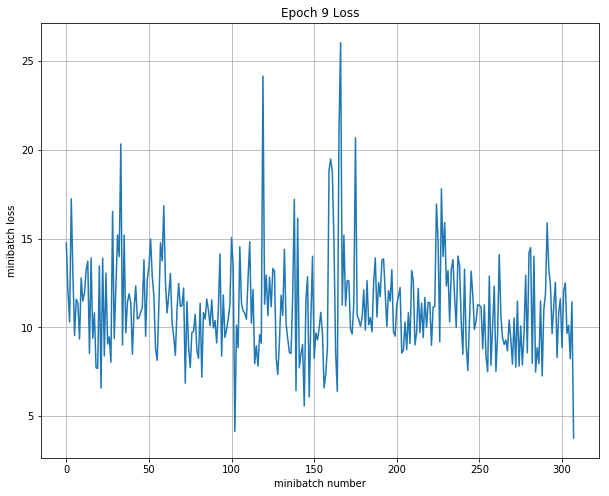

Iteration 2800: with minibatch training loss = 2.6 and accuracy of 0
Iteration 2900: with minibatch training loss = 1.2 and accuracy of 0.67
Iteration 3000: with minibatch training loss = 1.93 and accuracy of 0.33
Epoch 10, Overall loss = 1.81 and accuracy of 0.35


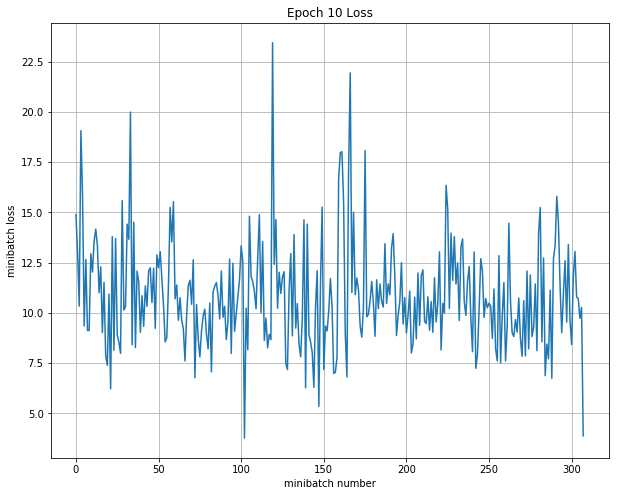

Train all layer
Iteration 0: with minibatch training loss = 3.05 and accuracy of 0.5
Iteration 100: with minibatch training loss = 1.3 and accuracy of 0.67
Iteration 200: with minibatch training loss = 1.74 and accuracy of 0.17
Iteration 300: with minibatch training loss = 1.51 and accuracy of 0.67
Epoch 1, Overall loss = 1.53 and accuracy of 0.465


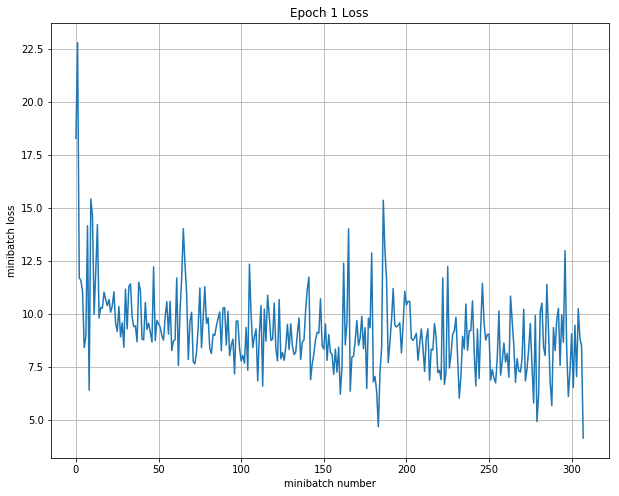

Iteration 400: with minibatch training loss = 1.56 and accuracy of 0.5
Iteration 500: with minibatch training loss = 1.52 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.14 and accuracy of 0.67
Epoch 2, Overall loss = 1.19 and accuracy of 0.666


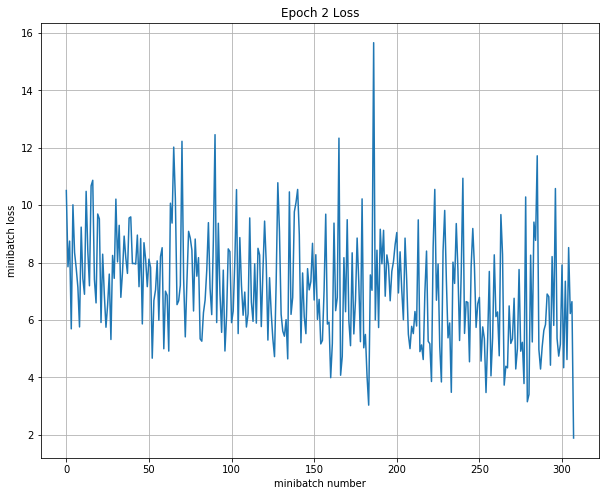

Iteration 700: with minibatch training loss = 0.933 and accuracy of 0.83
Iteration 800: with minibatch training loss = 0.961 and accuracy of 0.83
Iteration 900: with minibatch training loss = 1.29 and accuracy of 0.67
Epoch 3, Overall loss = 0.967 and accuracy of 0.765


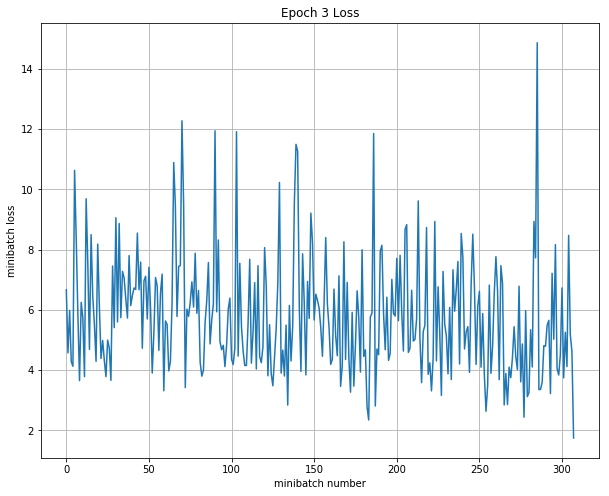

Iteration 1000: with minibatch training loss = 0.956 and accuracy of 0.67
Iteration 1100: with minibatch training loss = 0.849 and accuracy of 1
Iteration 1200: with minibatch training loss = 0.914 and accuracy of 0.67
Epoch 4, Overall loss = 0.801 and accuracy of 0.836


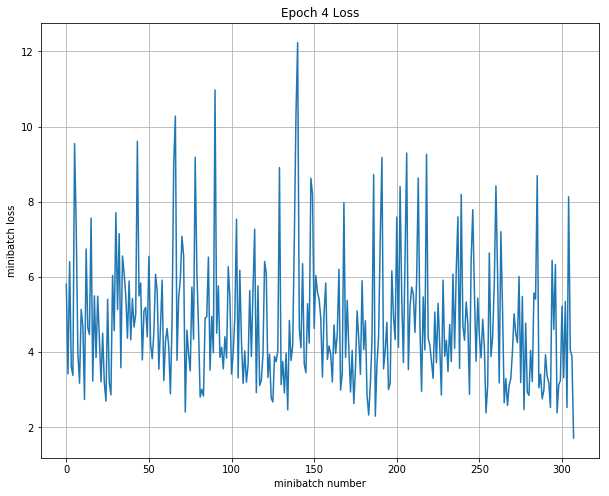

Iteration 1300: with minibatch training loss = 1.02 and accuracy of 0.67
Iteration 1400: with minibatch training loss = 1.21 and accuracy of 0.83
Iteration 1500: with minibatch training loss = 0.443 and accuracy of 1
Epoch 5, Overall loss = 0.709 and accuracy of 0.872


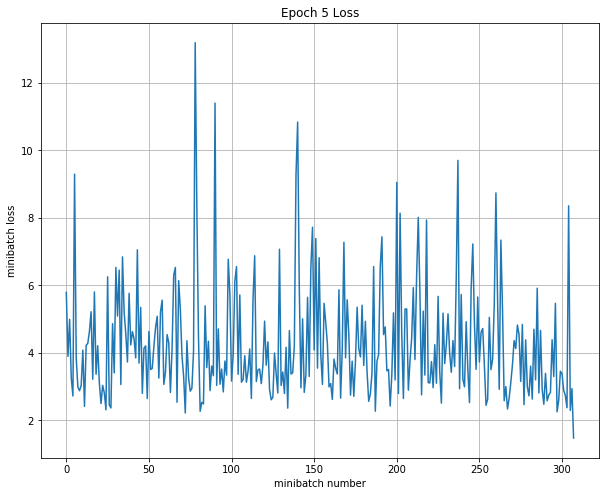

Iteration 1600: with minibatch training loss = 0.402 and accuracy of 1
Iteration 1700: with minibatch training loss = 0.724 and accuracy of 0.83
Iteration 1800: with minibatch training loss = 1.53 and accuracy of 0.67
Epoch 6, Overall loss = 0.632 and accuracy of 0.899


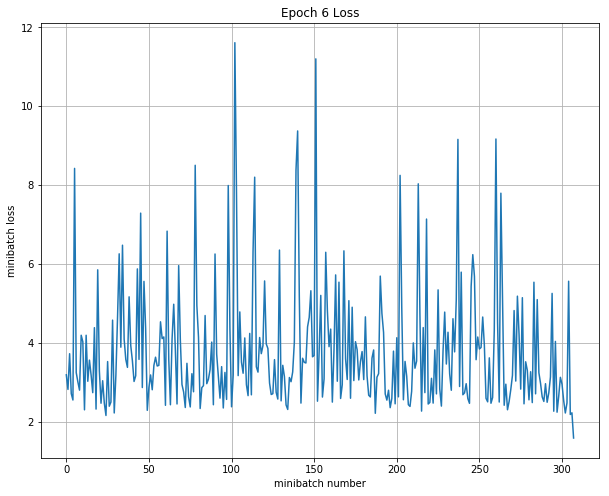

Iteration 1900: with minibatch training loss = 0.489 and accuracy of 1
Iteration 2000: with minibatch training loss = 0.469 and accuracy of 1
Iteration 2100: with minibatch training loss = 0.511 and accuracy of 0.83
Epoch 7, Overall loss = 0.572 and accuracy of 0.919


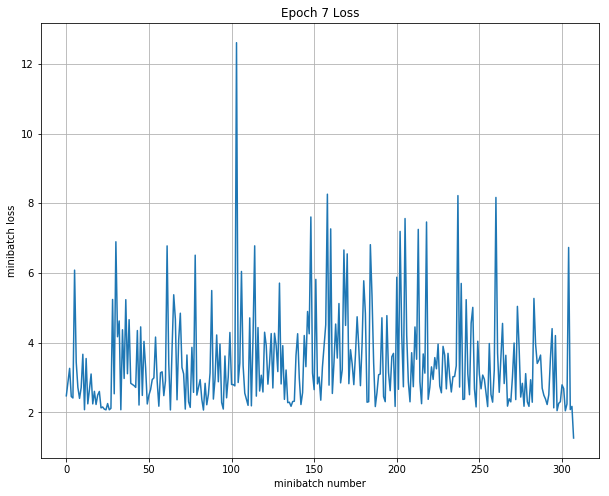

Iteration 2200: with minibatch training loss = 0.329 and accuracy of 1
Iteration 2300: with minibatch training loss = 0.644 and accuracy of 0.83
Iteration 2400: with minibatch training loss = 0.455 and accuracy of 1
Epoch 8, Overall loss = 0.51 and accuracy of 0.93


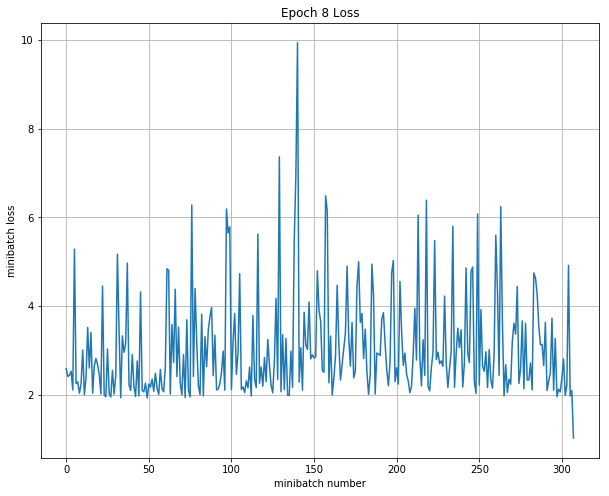

Iteration 2500: with minibatch training loss = 0.533 and accuracy of 0.83
Iteration 2600: with minibatch training loss = 0.33 and accuracy of 1
Iteration 2700: with minibatch training loss = 0.461 and accuracy of 1
Epoch 9, Overall loss = 0.487 and accuracy of 0.932


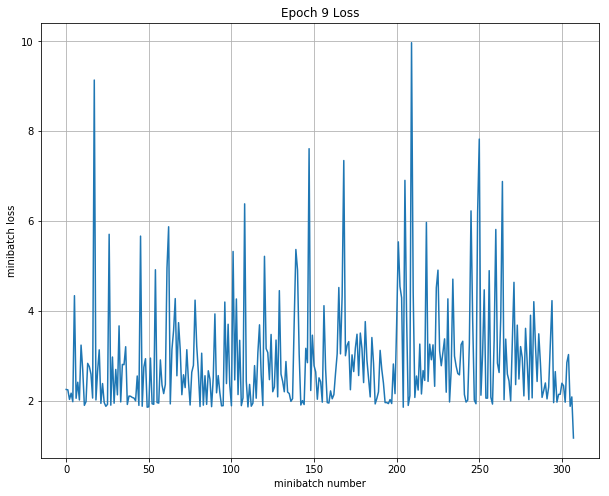

Iteration 2800: with minibatch training loss = 0.558 and accuracy of 0.83
Iteration 2900: with minibatch training loss = 0.371 and accuracy of 1
Iteration 3000: with minibatch training loss = 0.748 and accuracy of 0.83
Epoch 10, Overall loss = 0.426 and accuracy of 0.954


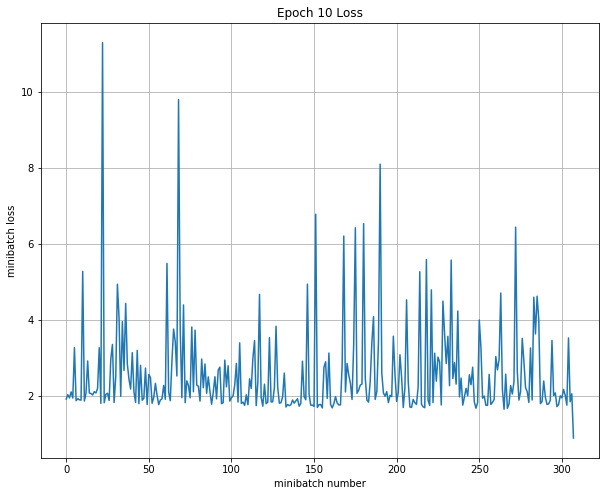

Validation
Epoch 1, Overall loss = 0.596 and accuracy of 0.88
Test
Epoch 1, Overall loss = 0.418 and accuracy of 0.95

--------------------------------------------------------------------------------
Trial number: 7
--------------------------------------------------------------------------------
reg: 0.001852, lr: 0.000004, dr: 0.792815, dc: 987, FC_size: 100 
INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


Train last layer
Iteration 0: with minibatch training loss = 1.81 and accuracy of 0.17
Iteration 100: with minibatch training loss = 1.58 and accuracy of 0.33
Iteration 200: with minibatch training loss = 1.43 and accuracy of 0.33
Iteration 300: with minibatch training loss = 1.23 and accuracy of 0.5
Epoch 1, Overall loss = 1.51 and accuracy of 0.343


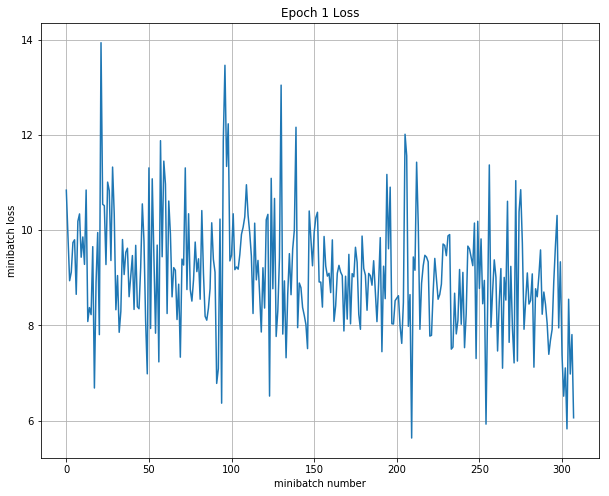

Iteration 400: with minibatch training loss = 1.1 and accuracy of 0.83
Iteration 500: with minibatch training loss = 1.42 and accuracy of 0.33
Iteration 600: with minibatch training loss = 1.15 and accuracy of 0.67
Epoch 2, Overall loss = 1.42 and accuracy of 0.404


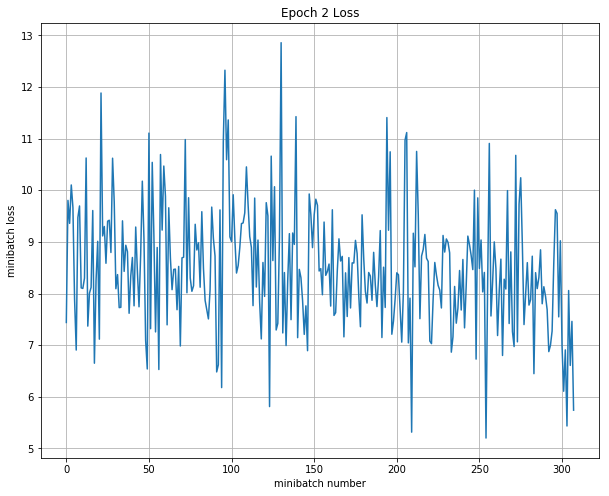

Iteration 700: with minibatch training loss = 1.28 and accuracy of 0.5
Iteration 800: with minibatch training loss = 1.31 and accuracy of 0.67
Iteration 900: with minibatch training loss = 1.36 and accuracy of 0.33
Epoch 3, Overall loss = 1.36 and accuracy of 0.452


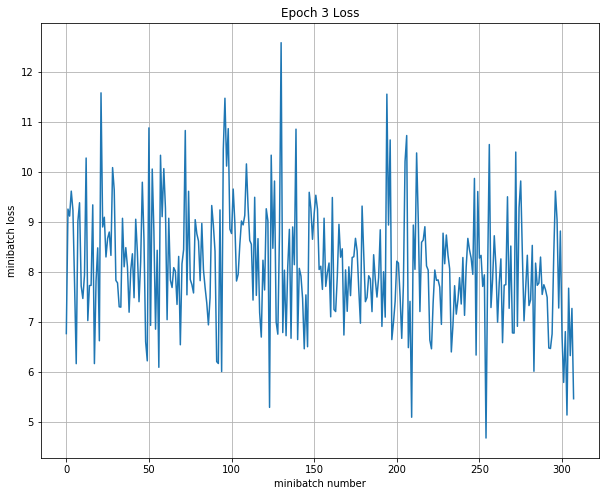

Iteration 1000: with minibatch training loss = 1.26 and accuracy of 0.5
Iteration 1100: with minibatch training loss = 1.37 and accuracy of 0.67
Iteration 1200: with minibatch training loss = 1.32 and accuracy of 0.5
Epoch 4, Overall loss = 1.31 and accuracy of 0.493


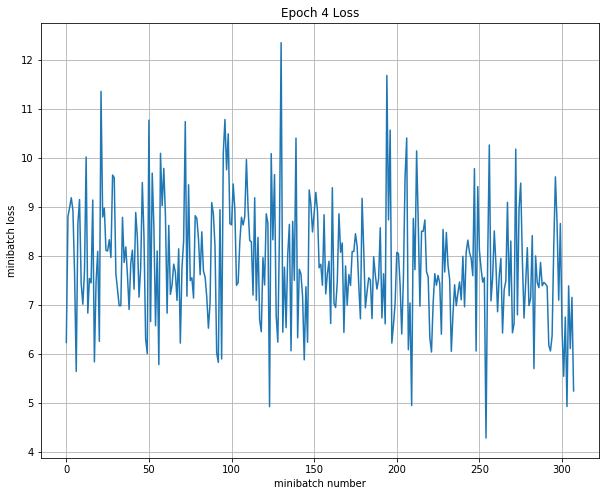

Iteration 1300: with minibatch training loss = 1.33 and accuracy of 0.5
Iteration 1400: with minibatch training loss = 1.03 and accuracy of 0.67
Iteration 1500: with minibatch training loss = 1.19 and accuracy of 0.5
Epoch 5, Overall loss = 1.27 and accuracy of 0.517


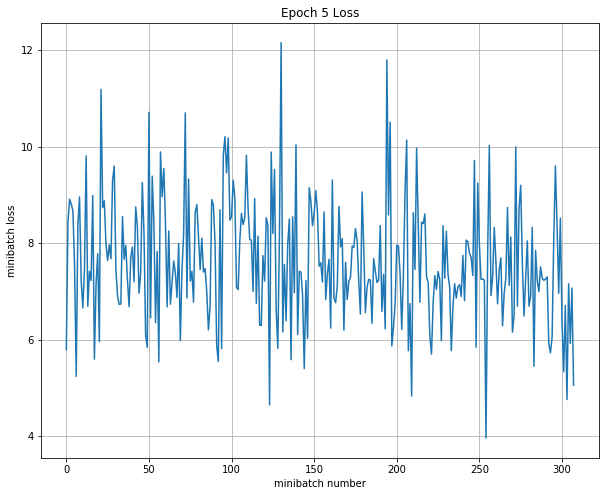

Iteration 1600: with minibatch training loss = 1.35 and accuracy of 0.17
Iteration 1700: with minibatch training loss = 0.987 and accuracy of 0.83
Iteration 1800: with minibatch training loss = 1.24 and accuracy of 0.33
Epoch 6, Overall loss = 1.24 and accuracy of 0.538


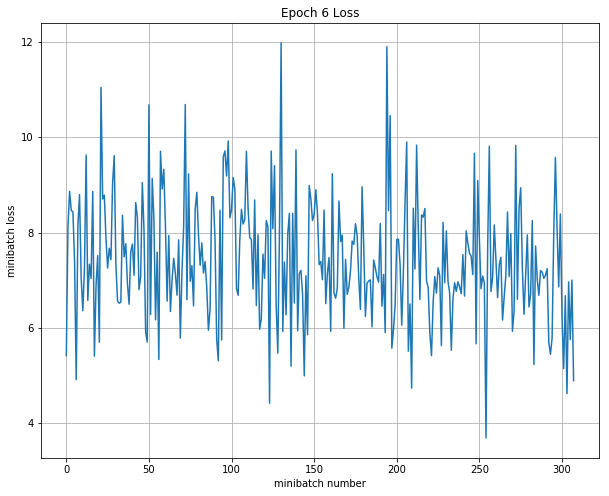

Iteration 1900: with minibatch training loss = 1.49 and accuracy of 0.17
Iteration 2000: with minibatch training loss = 1.37 and accuracy of 0.5
Iteration 2100: with minibatch training loss = 1.15 and accuracy of 0.5
Epoch 7, Overall loss = 1.21 and accuracy of 0.552


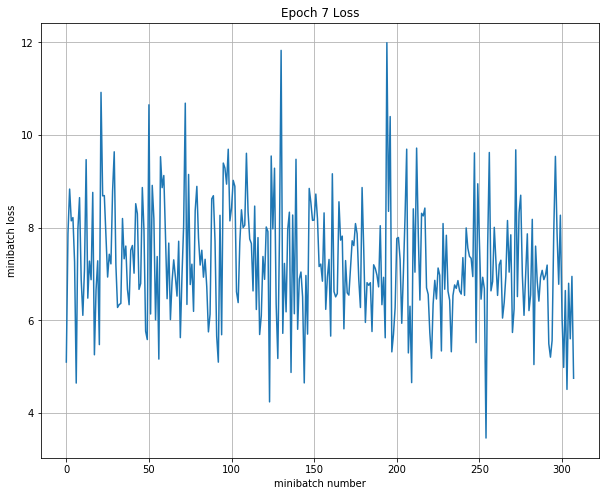

Iteration 2200: with minibatch training loss = 1.09 and accuracy of 0.67
Iteration 2300: with minibatch training loss = 0.726 and accuracy of 0.83
Iteration 2400: with minibatch training loss = 1.2 and accuracy of 0.5
Epoch 8, Overall loss = 1.19 and accuracy of 0.571


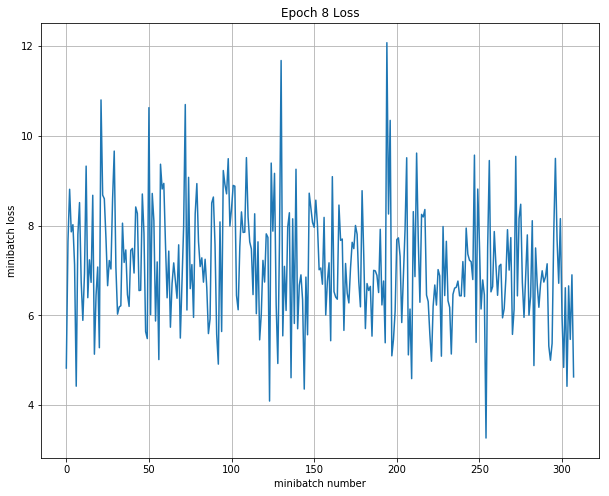

Iteration 2500: with minibatch training loss = 1.22 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 0.73 and accuracy of 1
Iteration 2700: with minibatch training loss = 1.09 and accuracy of 0.67
Epoch 9, Overall loss = 1.17 and accuracy of 0.582


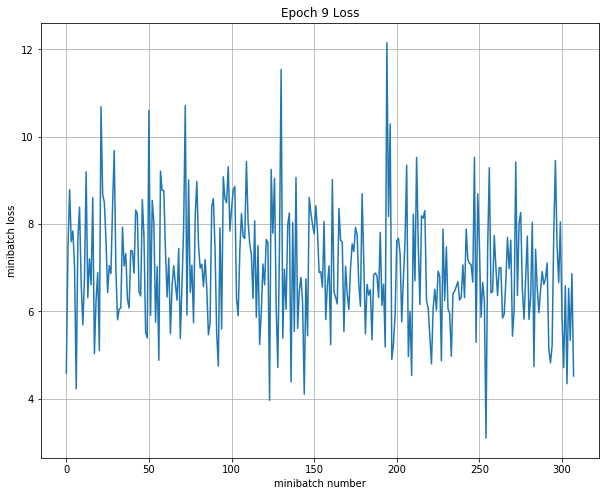

Iteration 2800: with minibatch training loss = 1.38 and accuracy of 0.33
Iteration 2900: with minibatch training loss = 0.754 and accuracy of 0.83
Iteration 3000: with minibatch training loss = 1.3 and accuracy of 0.67
Epoch 10, Overall loss = 1.15 and accuracy of 0.592


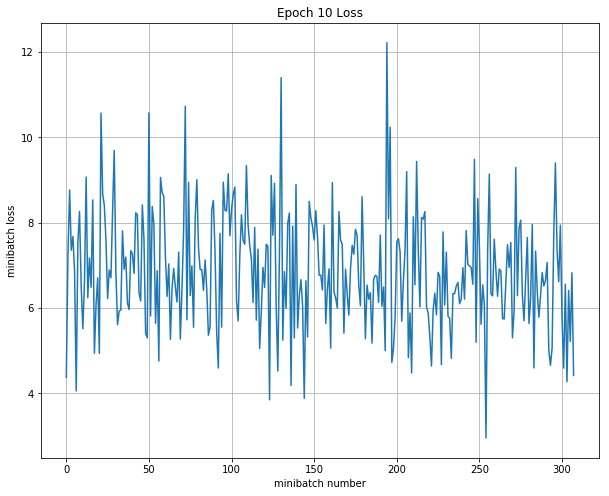

Train all layer
Iteration 0: with minibatch training loss = 0.859 and accuracy of 1
Iteration 100: with minibatch training loss = 0.917 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.986 and accuracy of 0.5
Iteration 300: with minibatch training loss = 1.02 and accuracy of 0.67
Epoch 1, Overall loss = 1.05 and accuracy of 0.63


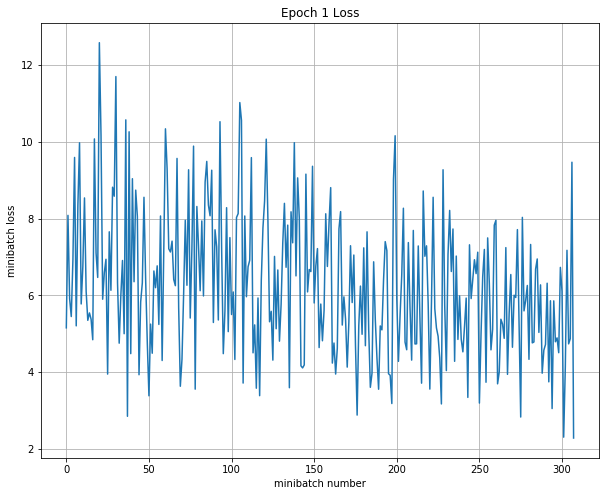

Iteration 400: with minibatch training loss = 0.736 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.975 and accuracy of 0.33
Iteration 600: with minibatch training loss = 0.562 and accuracy of 1
Epoch 2, Overall loss = 0.935 and accuracy of 0.678


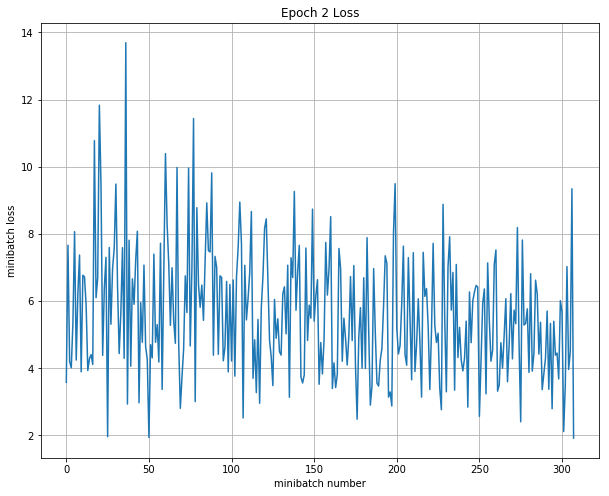

Iteration 700: with minibatch training loss = 0.989 and accuracy of 0.5
Iteration 800: with minibatch training loss = 0.395 and accuracy of 0.83
Iteration 900: with minibatch training loss = 1.09 and accuracy of 0.5
Epoch 3, Overall loss = 0.851 and accuracy of 0.726


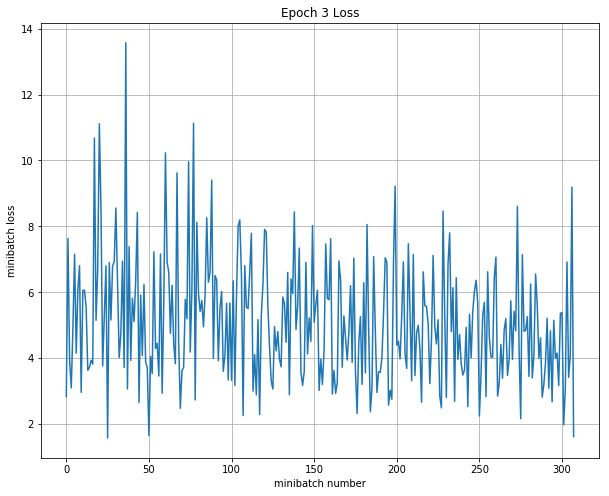

Iteration 1000: with minibatch training loss = 0.907 and accuracy of 0.83
Iteration 1100: with minibatch training loss = 0.361 and accuracy of 1
Iteration 1200: with minibatch training loss = 1.07 and accuracy of 0.5
Epoch 4, Overall loss = 0.776 and accuracy of 0.762


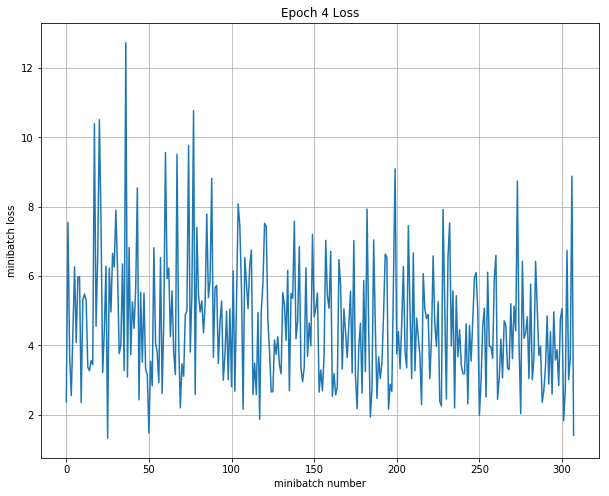

Iteration 1300: with minibatch training loss = 0.63 and accuracy of 0.83
Iteration 1400: with minibatch training loss = 0.798 and accuracy of 0.5
Iteration 1500: with minibatch training loss = 0.46 and accuracy of 1
Epoch 5, Overall loss = 0.708 and accuracy of 0.794


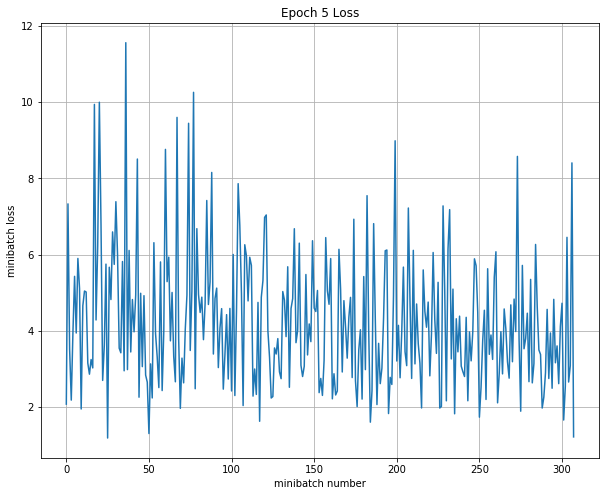

Iteration 1600: with minibatch training loss = 1.31 and accuracy of 0.5
Iteration 1700: with minibatch training loss = 0.87 and accuracy of 0.83
Iteration 1800: with minibatch training loss = 0.926 and accuracy of 0.67
Epoch 6, Overall loss = 0.644 and accuracy of 0.822


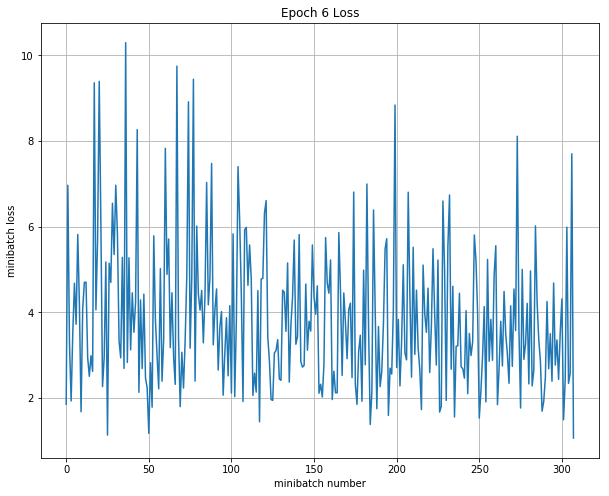

Iteration 1900: with minibatch training loss = 0.244 and accuracy of 1
Iteration 2000: with minibatch training loss = 0.703 and accuracy of 0.83
Iteration 2100: with minibatch training loss = 0.394 and accuracy of 1
Epoch 7, Overall loss = 0.584 and accuracy of 0.849


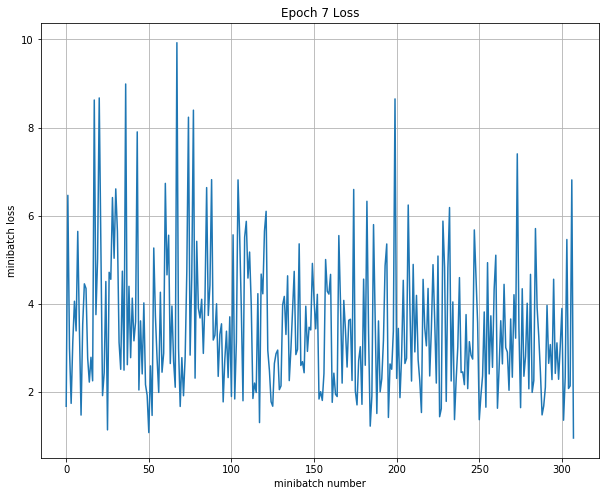

Iteration 2200: with minibatch training loss = 0.327 and accuracy of 1
Iteration 2300: with minibatch training loss = 0.357 and accuracy of 1
Iteration 2400: with minibatch training loss = 0.469 and accuracy of 0.83
Epoch 8, Overall loss = 0.529 and accuracy of 0.867


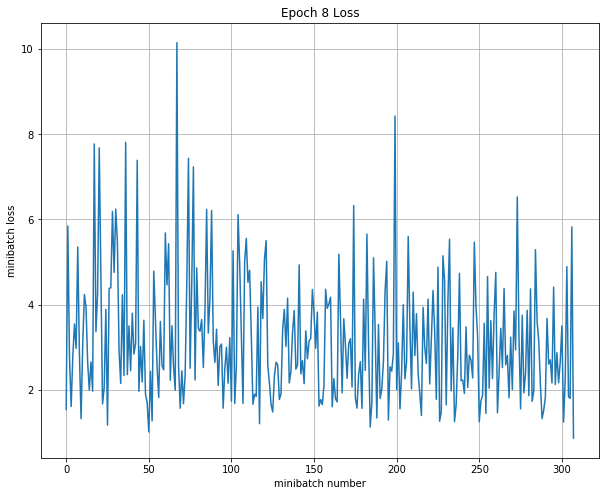

Iteration 2500: with minibatch training loss = 1.14 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 0.336 and accuracy of 1
Iteration 2700: with minibatch training loss = 0.218 and accuracy of 1
Epoch 9, Overall loss = 0.479 and accuracy of 0.89


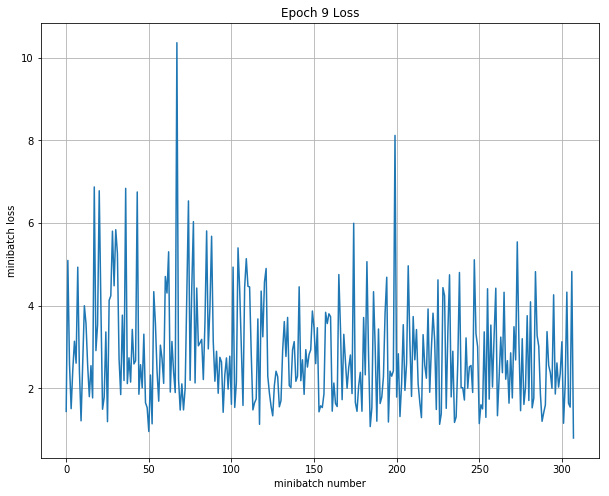

Iteration 2800: with minibatch training loss = 0.87 and accuracy of 0.5
Iteration 2900: with minibatch training loss = 0.333 and accuracy of 1
Iteration 3000: with minibatch training loss = 0.628 and accuracy of 0.67
Epoch 10, Overall loss = 0.434 and accuracy of 0.905


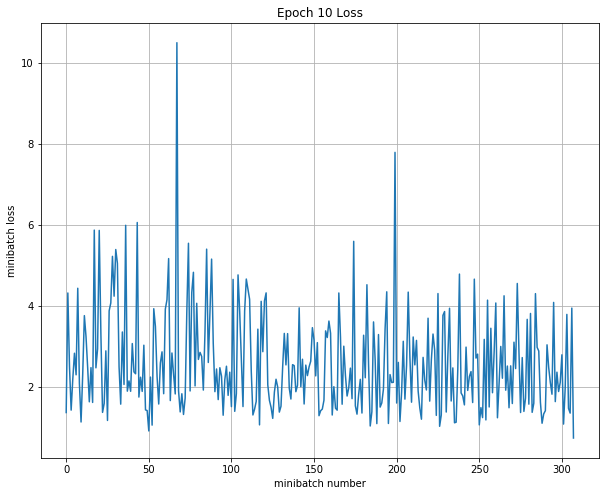

Validation
Epoch 1, Overall loss = 0.451 and accuracy of 0.885
Test
Epoch 1, Overall loss = 0.339 and accuracy of 0.93

--------------------------------------------------------------------------------
Trial number: 8
--------------------------------------------------------------------------------
reg: 0.009421, lr: 0.000038, dr: 0.854109, dc: 642, FC_size: 100 
INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


Train last layer
Iteration 0: with minibatch training loss = 2.53 and accuracy of 0.33
Iteration 100: with minibatch training loss = 1.44 and accuracy of 0.67
Iteration 200: with minibatch training loss = 1.87 and accuracy of 0.5
Iteration 300: with minibatch training loss = 2.86 and accuracy of 0.17
Epoch 1, Overall loss = 2.11 and accuracy of 0.352


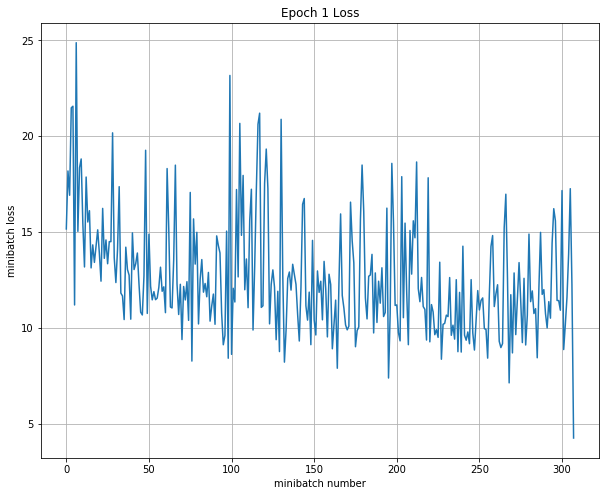

Iteration 400: with minibatch training loss = 2.37 and accuracy of 0.33
Iteration 500: with minibatch training loss = 1.74 and accuracy of 0.5
Iteration 600: with minibatch training loss = 1.7 and accuracy of 0.33
Epoch 2, Overall loss = 1.86 and accuracy of 0.405


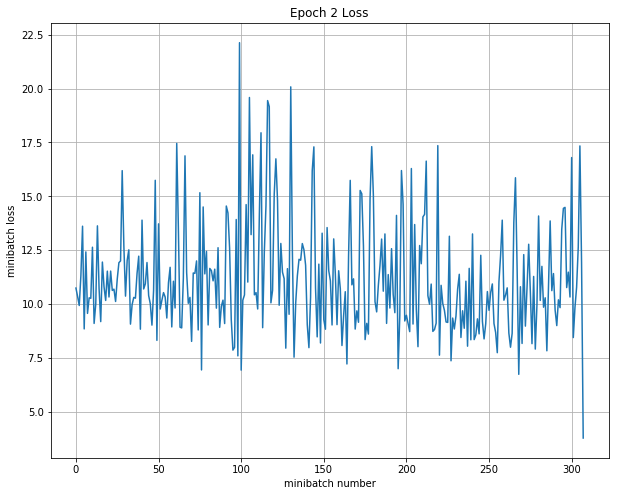

Iteration 700: with minibatch training loss = 1.84 and accuracy of 0.17
Iteration 800: with minibatch training loss = 1.86 and accuracy of 0.5
Iteration 900: with minibatch training loss = 1.61 and accuracy of 0.5
Epoch 3, Overall loss = 1.77 and accuracy of 0.441


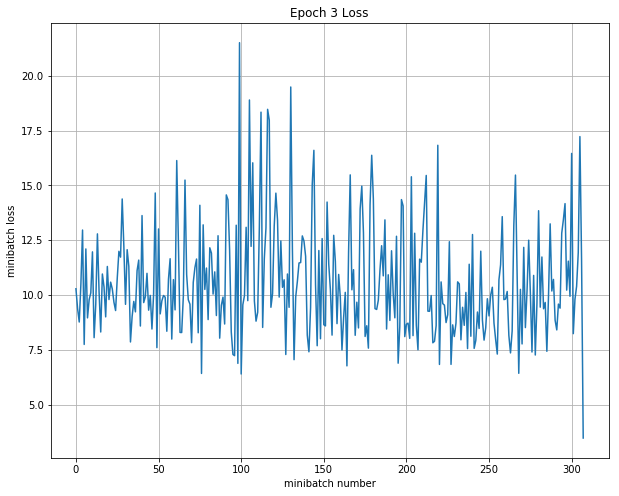

Iteration 1000: with minibatch training loss = 1.01 and accuracy of 0.83
Iteration 1100: with minibatch training loss = 1.38 and accuracy of 0.5
Iteration 1200: with minibatch training loss = 1.14 and accuracy of 1
Epoch 4, Overall loss = 1.7 and accuracy of 0.459


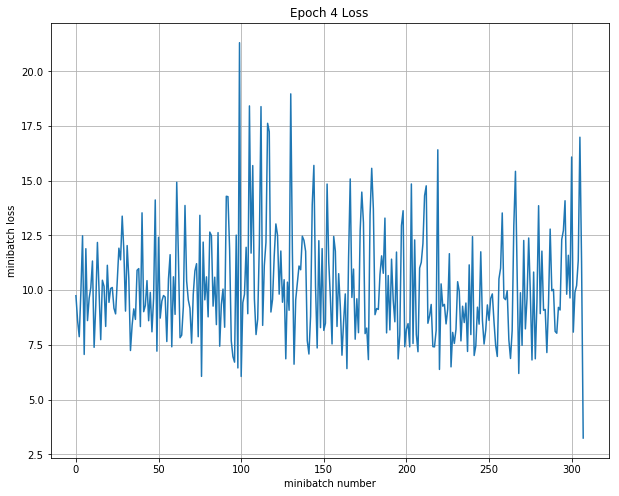

Iteration 1300: with minibatch training loss = 1.55 and accuracy of 0.33
Iteration 1400: with minibatch training loss = 1.78 and accuracy of 0.5
Iteration 1500: with minibatch training loss = 1.01 and accuracy of 0.83
Epoch 5, Overall loss = 1.65 and accuracy of 0.467


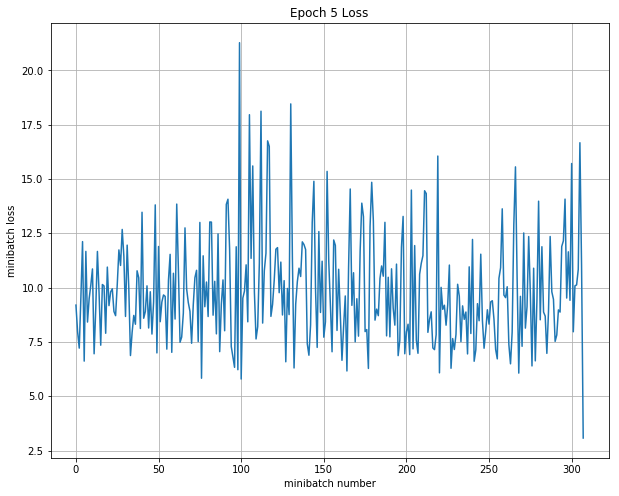

Iteration 1600: with minibatch training loss = 1.38 and accuracy of 0.67
Iteration 1700: with minibatch training loss = 1.4 and accuracy of 0.33
Iteration 1800: with minibatch training loss = 1.61 and accuracy of 0.5
Epoch 6, Overall loss = 1.6 and accuracy of 0.483


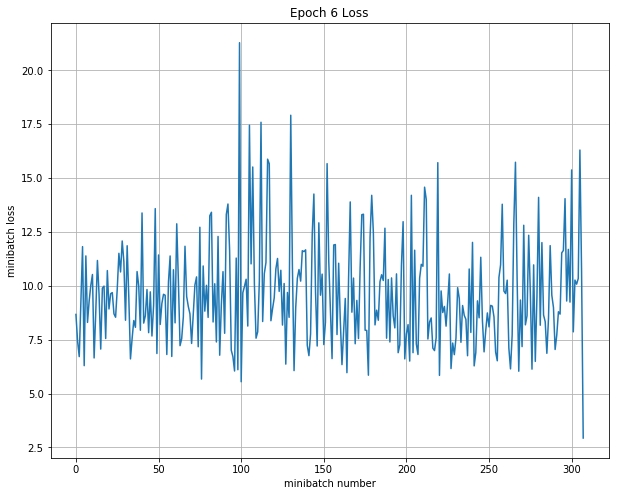

Iteration 1900: with minibatch training loss = 1.5 and accuracy of 0.33
Iteration 2000: with minibatch training loss = 2.63 and accuracy of 0.17
Iteration 2100: with minibatch training loss = 1.47 and accuracy of 0.67
Epoch 7, Overall loss = 1.57 and accuracy of 0.493


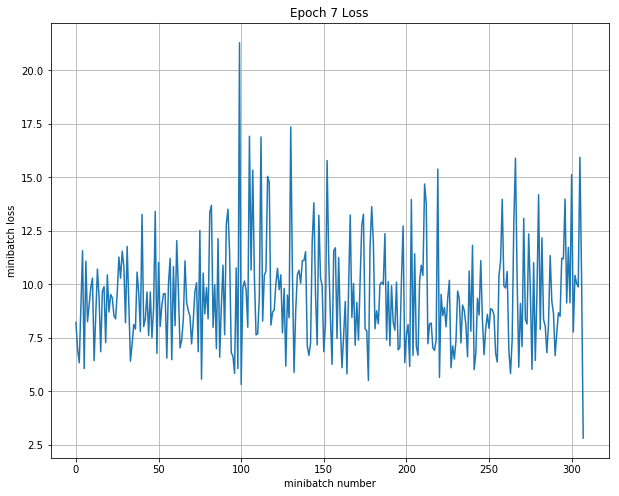

Iteration 2200: with minibatch training loss = 1.24 and accuracy of 0.67
Iteration 2300: with minibatch training loss = 2.25 and accuracy of 0.33
Iteration 2400: with minibatch training loss = 1.44 and accuracy of 0.83
Epoch 8, Overall loss = 1.54 and accuracy of 0.499


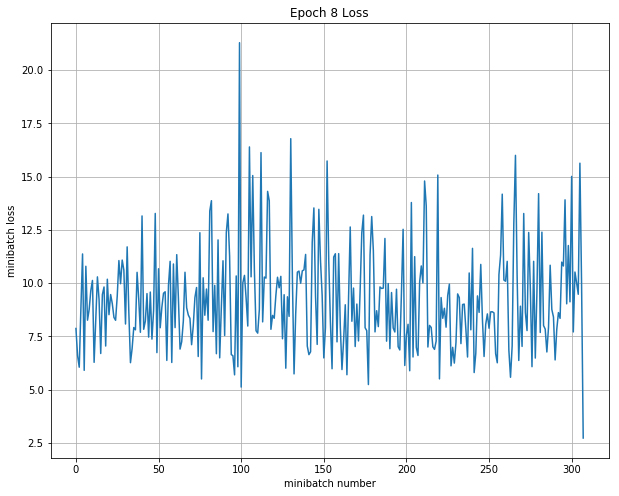

Iteration 2500: with minibatch training loss = 1.29 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 1.67 and accuracy of 0.17
Iteration 2700: with minibatch training loss = 1.26 and accuracy of 0.67
Epoch 9, Overall loss = 1.52 and accuracy of 0.509


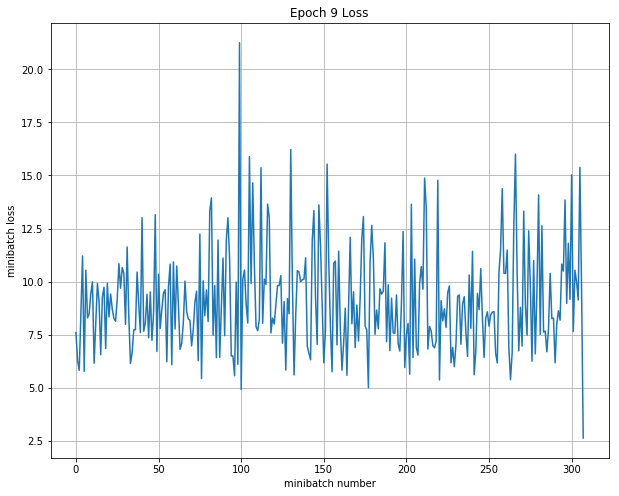

Iteration 2800: with minibatch training loss = 1.72 and accuracy of 0.33
Iteration 2900: with minibatch training loss = 1.51 and accuracy of 0.5
Iteration 3000: with minibatch training loss = 1.15 and accuracy of 0.67
Epoch 10, Overall loss = 1.5 and accuracy of 0.515


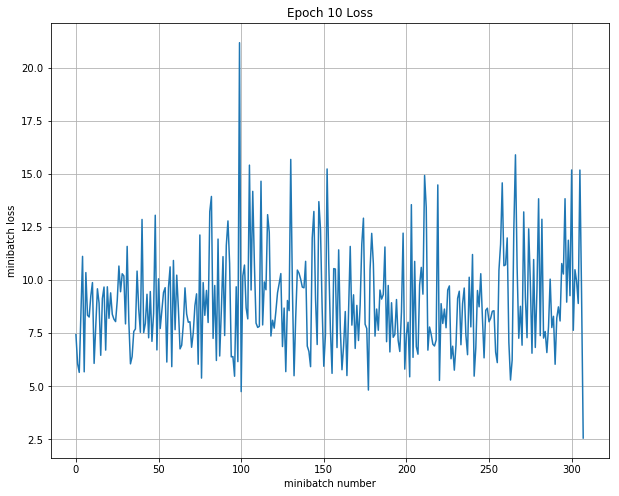

Train all layer
Iteration 0: with minibatch training loss = 1.69 and accuracy of 0.67
Iteration 100: with minibatch training loss = 0.909 and accuracy of 0.83
Iteration 200: with minibatch training loss = 0.571 and accuracy of 1
Iteration 300: with minibatch training loss = 1.5 and accuracy of 0.5
Epoch 1, Overall loss = 1.3 and accuracy of 0.593


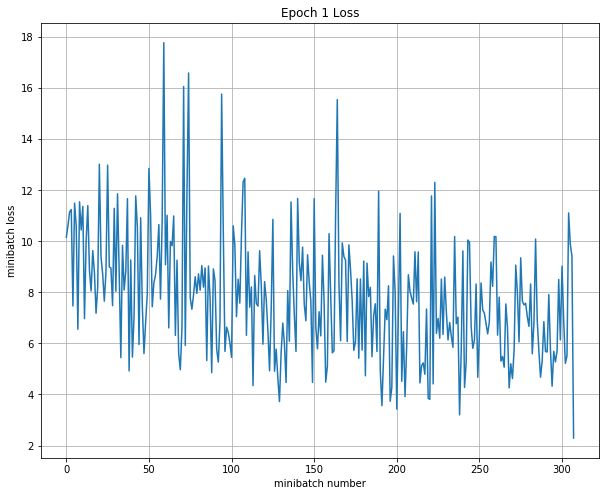

Iteration 400: with minibatch training loss = 0.552 and accuracy of 0.83
Iteration 500: with minibatch training loss = 0.868 and accuracy of 0.83
Iteration 600: with minibatch training loss = 0.975 and accuracy of 0.83
Epoch 2, Overall loss = 0.928 and accuracy of 0.769


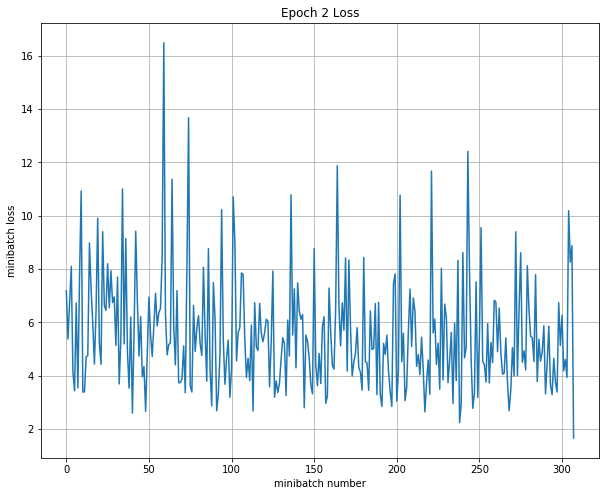

Iteration 700: with minibatch training loss = 0.728 and accuracy of 0.83
Iteration 800: with minibatch training loss = 0.901 and accuracy of 0.67
Iteration 900: with minibatch training loss = 0.819 and accuracy of 0.67
Epoch 3, Overall loss = 0.71 and accuracy of 0.852


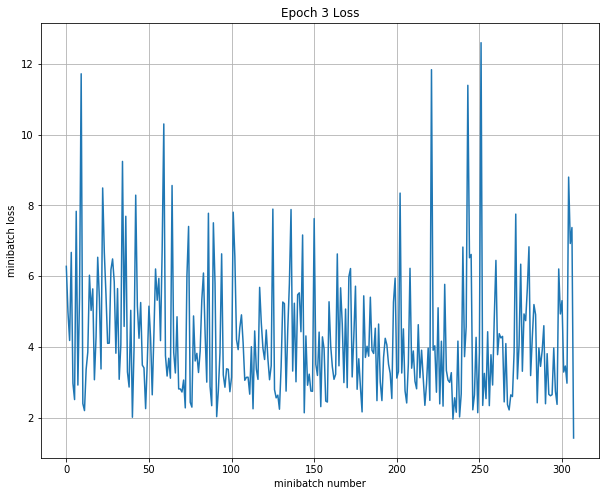

Iteration 1000: with minibatch training loss = 0.342 and accuracy of 1
Iteration 1100: with minibatch training loss = 0.409 and accuracy of 1
Iteration 1200: with minibatch training loss = 0.435 and accuracy of 1
Epoch 4, Overall loss = 0.587 and accuracy of 0.896


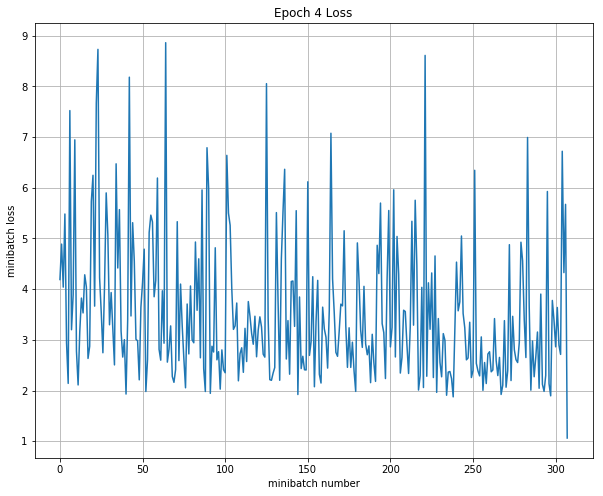

Iteration 1300: with minibatch training loss = 0.342 and accuracy of 1
Iteration 1400: with minibatch training loss = 0.444 and accuracy of 1
Iteration 1500: with minibatch training loss = 0.325 and accuracy of 1
Epoch 5, Overall loss = 0.504 and accuracy of 0.925


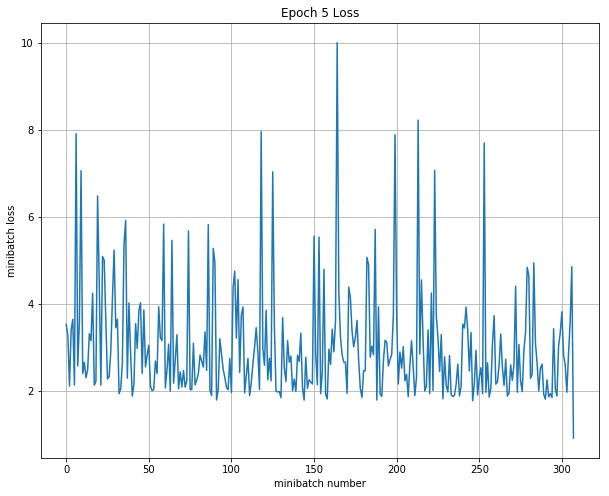

Iteration 1600: with minibatch training loss = 0.325 and accuracy of 1
Iteration 1700: with minibatch training loss = 0.306 and accuracy of 1
Iteration 1800: with minibatch training loss = 0.462 and accuracy of 0.83
Epoch 6, Overall loss = 0.427 and accuracy of 0.951


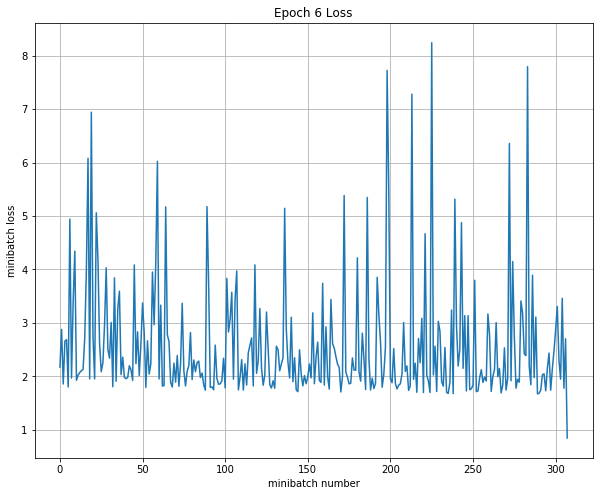

Iteration 1900: with minibatch training loss = 0.274 and accuracy of 1
Iteration 2000: with minibatch training loss = 0.378 and accuracy of 1
Iteration 2100: with minibatch training loss = 0.432 and accuracy of 0.83
Epoch 7, Overall loss = 0.375 and accuracy of 0.962


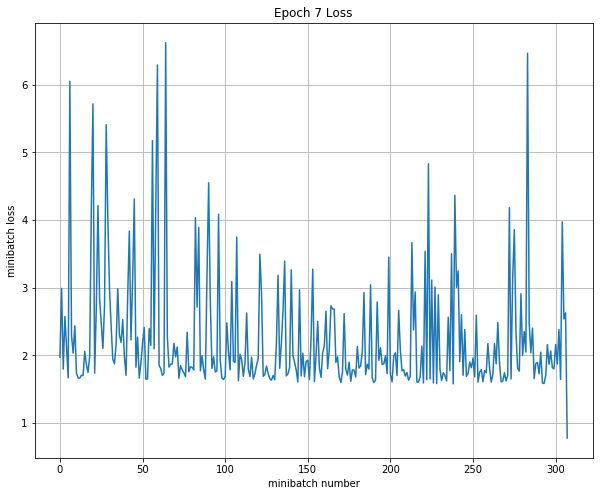

Iteration 2200: with minibatch training loss = 0.278 and accuracy of 1
Iteration 2300: with minibatch training loss = 0.25 and accuracy of 1
Iteration 2400: with minibatch training loss = 0.272 and accuracy of 1
Epoch 8, Overall loss = 0.342 and accuracy of 0.966


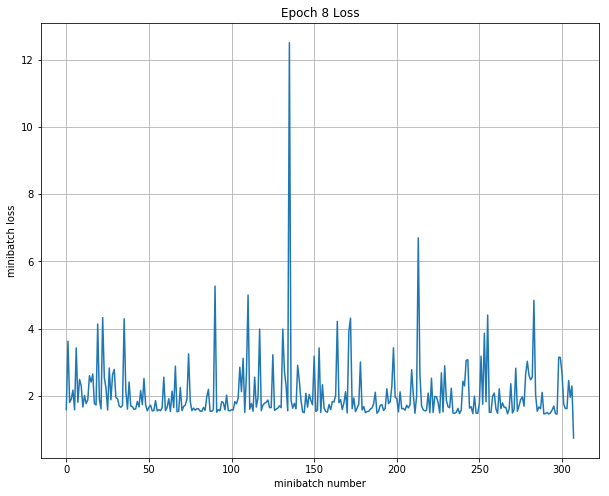

Iteration 2500: with minibatch training loss = 0.392 and accuracy of 1
Iteration 2600: with minibatch training loss = 0.315 and accuracy of 1
Iteration 2700: with minibatch training loss = 0.245 and accuracy of 1
Epoch 9, Overall loss = 0.312 and accuracy of 0.974


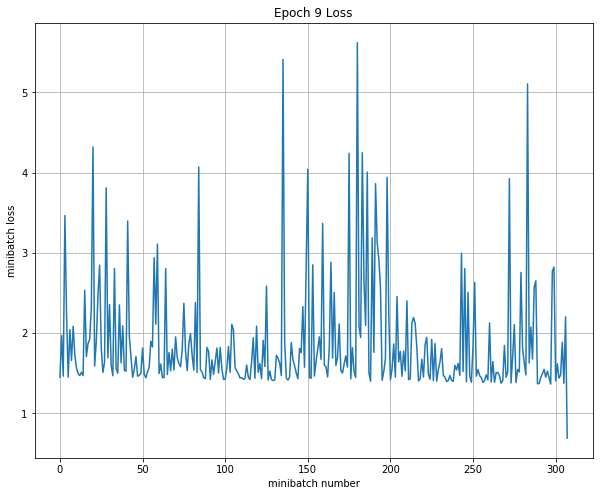

Iteration 2800: with minibatch training loss = 0.607 and accuracy of 0.83
Iteration 2900: with minibatch training loss = 0.24 and accuracy of 1
Iteration 3000: with minibatch training loss = 0.226 and accuracy of 1
Epoch 10, Overall loss = 0.33 and accuracy of 0.962


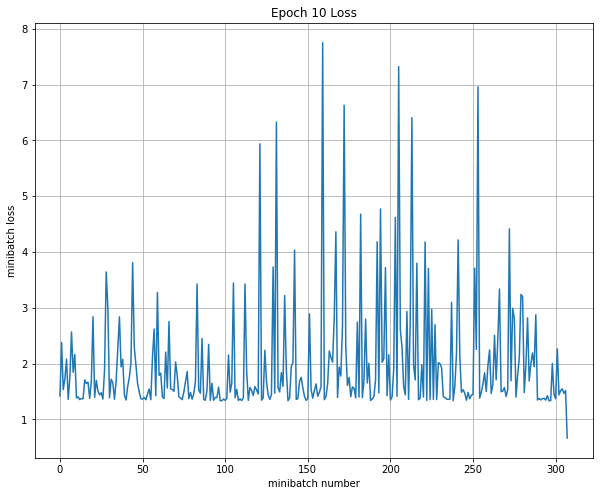

Validation
Epoch 1, Overall loss = 0.465 and accuracy of 0.93
Test
Epoch 1, Overall loss = 0.286 and accuracy of 0.975

--------------------------------------------------------------------------------
Trial number: 9
--------------------------------------------------------------------------------
reg: 4.438593, lr: 0.000013, dr: 0.931246, dc: 638, FC_size: 100 
INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


INFO:tensorflow:Restoring parameters from cs231n/datasets/squeezenet.ckpt


Train last layer
Iteration 0: with minibatch training loss = 463 and accuracy of 0.5
Iteration 100: with minibatch training loss = 217 and accuracy of 0.33
Iteration 200: with minibatch training loss = 101 and accuracy of 0.33
Iteration 300: with minibatch training loss = 50.8 and accuracy of 0.17
Epoch 1, Overall loss = 181 and accuracy of 0.296


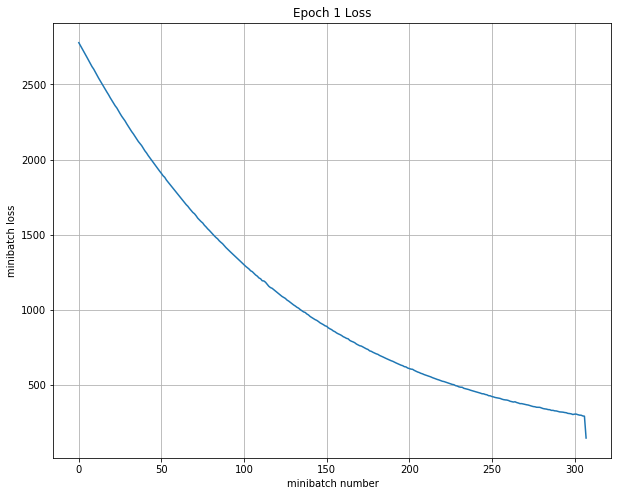

Iteration 400: with minibatch training loss = 29.8 and accuracy of 0.33
Iteration 500: with minibatch training loss = 21.9 and accuracy of 0.17
Iteration 600: with minibatch training loss = 19.1 and accuracy of 0.33
Epoch 2, Overall loss = 27.1 and accuracy of 0.294


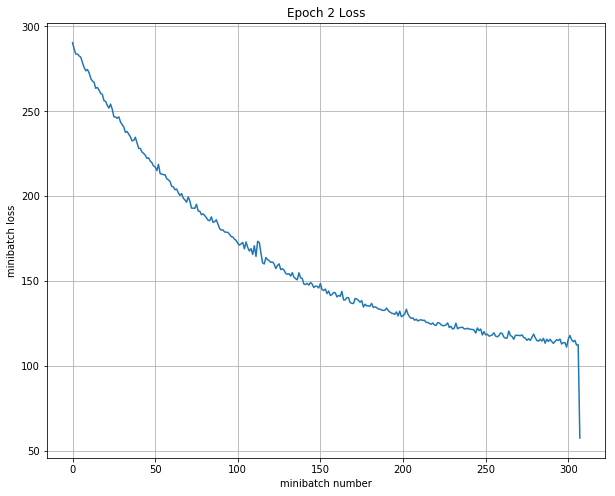

Iteration 700: with minibatch training loss = 18.5 and accuracy of 0
Iteration 800: with minibatch training loss = 17.6 and accuracy of 0.17
Iteration 900: with minibatch training loss = 17.1 and accuracy of 0.33
Epoch 3, Overall loss = 17.8 and accuracy of 0.297


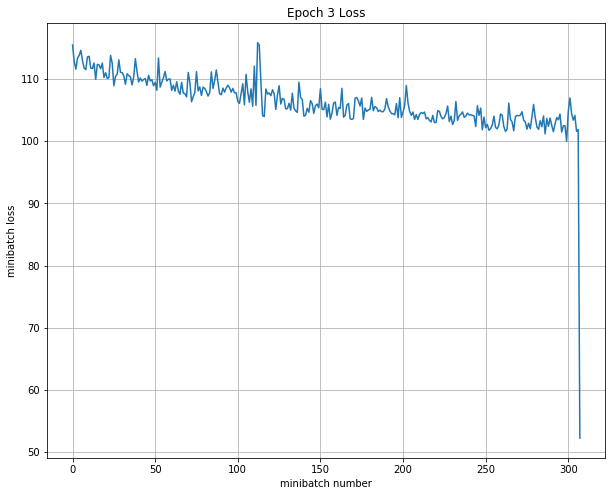

Iteration 1000: with minibatch training loss = 16.9 and accuracy of 0.33
Iteration 1100: with minibatch training loss = 16.4 and accuracy of 0.83
Iteration 1200: with minibatch training loss = 16.4 and accuracy of 0.33
Epoch 4, Overall loss = 16.7 and accuracy of 0.296


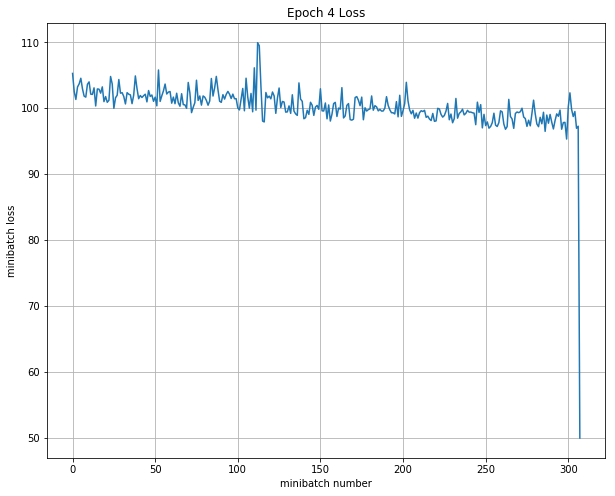

Iteration 1300: with minibatch training loss = 16 and accuracy of 0.33
Iteration 1400: with minibatch training loss = 15.7 and accuracy of 0.17
Iteration 1500: with minibatch training loss = 15.8 and accuracy of 0.5
Epoch 5, Overall loss = 16 and accuracy of 0.297


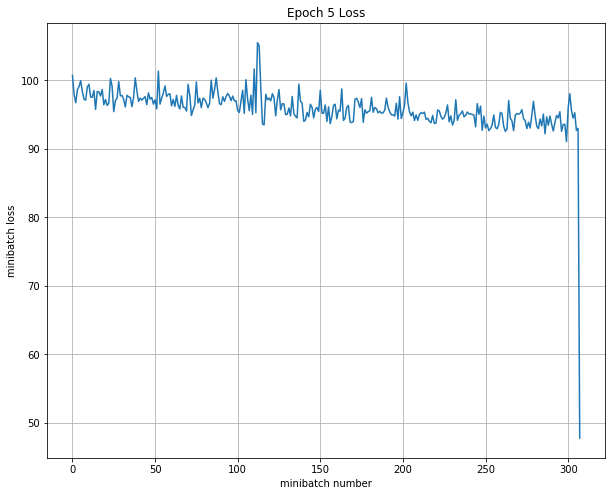

Iteration 1600: with minibatch training loss = 15.3 and accuracy of 0.33
Iteration 1700: with minibatch training loss = 15 and accuracy of 0.17
Iteration 1800: with minibatch training loss = 15.2 and accuracy of 0.17
Epoch 6, Overall loss = 15.3 and accuracy of 0.294


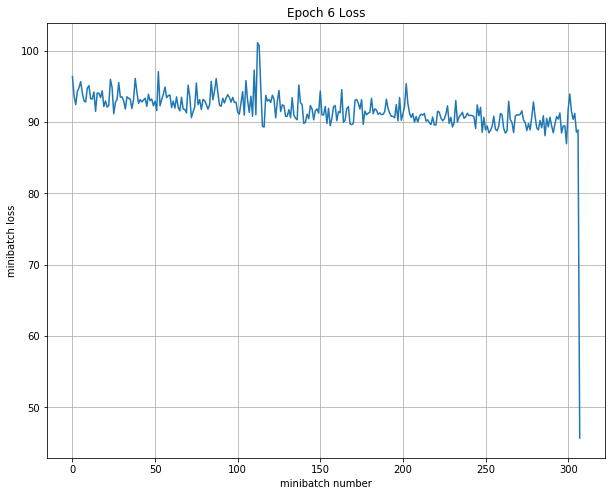

Iteration 1900: with minibatch training loss = 15.5 and accuracy of 0.17
Iteration 2000: with minibatch training loss = 14.5 and accuracy of 0.33
Iteration 2100: with minibatch training loss = 14.1 and accuracy of 0.5
Epoch 7, Overall loss = 14.6 and accuracy of 0.291


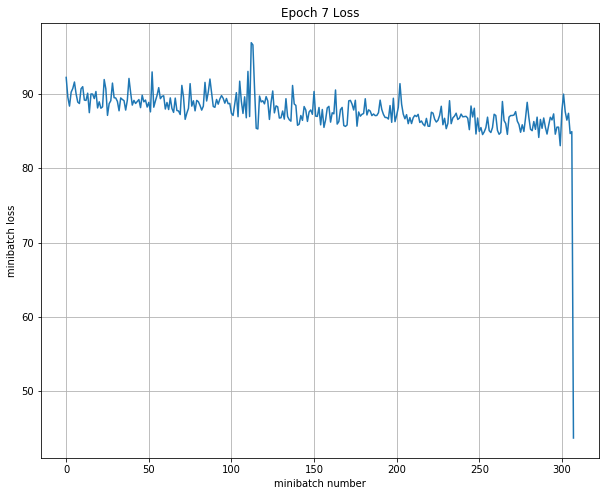

Iteration 2200: with minibatch training loss = 14.2 and accuracy of 0.33
Iteration 2300: with minibatch training loss = 14.1 and accuracy of 0.17
Iteration 2400: with minibatch training loss = 13.6 and accuracy of 0.67
Epoch 8, Overall loss = 14 and accuracy of 0.29


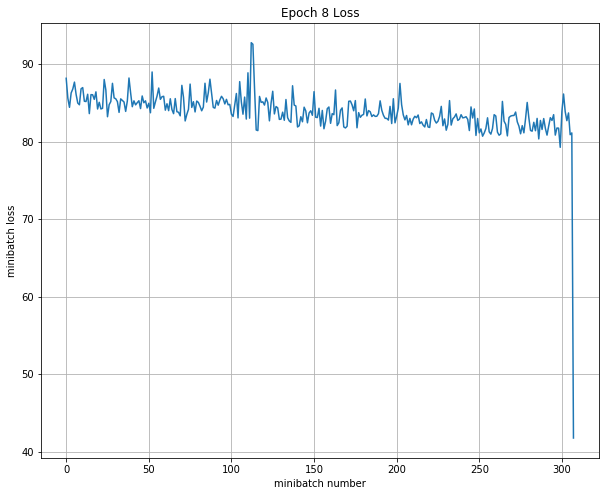

Iteration 2500: with minibatch training loss = 13.3 and accuracy of 0.5
Iteration 2600: with minibatch training loss = 13.1 and accuracy of 0.5
Iteration 2700: with minibatch training loss = 13.3 and accuracy of 0.17
Epoch 9, Overall loss = 13.4 and accuracy of 0.292


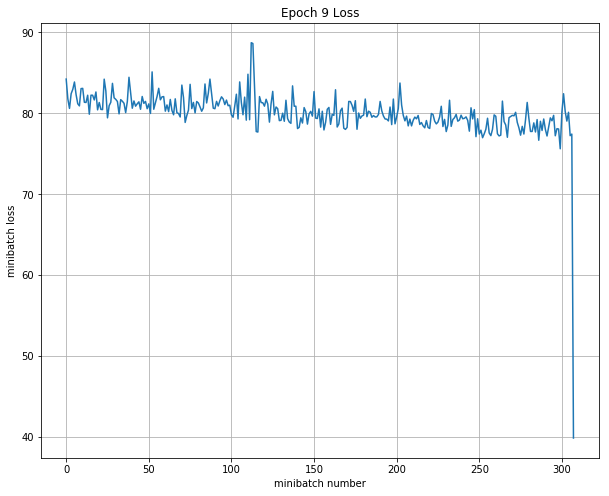

Iteration 2800: with minibatch training loss = 13.3 and accuracy of 0.33
Iteration 2900: with minibatch training loss = 12.8 and accuracy of 0.33
Iteration 3000: with minibatch training loss = 12.5 and accuracy of 0.33
Epoch 10, Overall loss = 12.8 and accuracy of 0.294


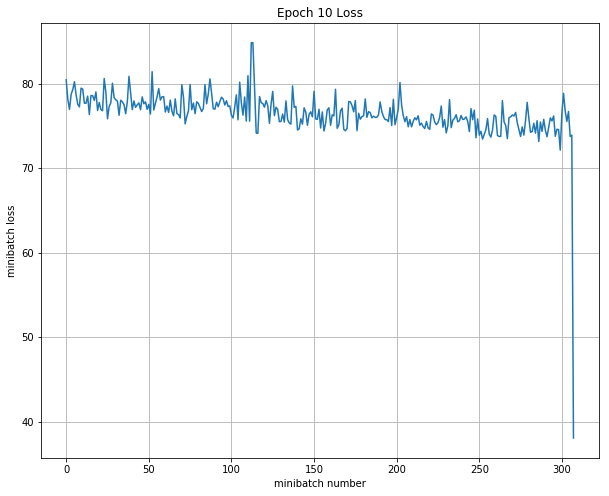

Train all layer
Iteration 0: with minibatch training loss = 12.4 and accuracy of 0.33
Iteration 100: with minibatch training loss = 12.1 and accuracy of 0.5
Iteration 200: with minibatch training loss = 11.9 and accuracy of 0.33
Iteration 300: with minibatch training loss = 11.7 and accuracy of 0.83
Epoch 1, Overall loss = 12.1 and accuracy of 0.345


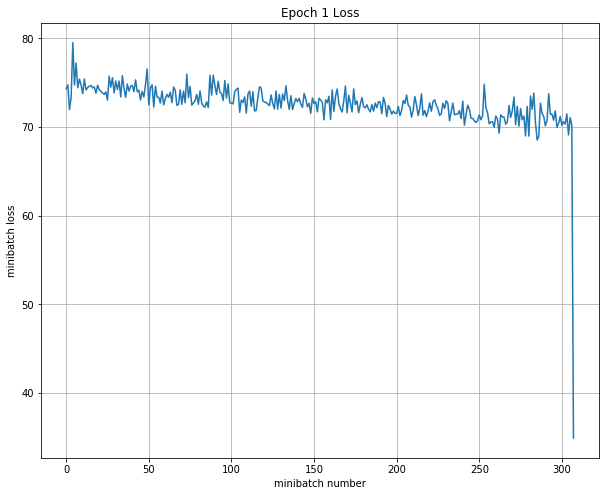

Iteration 400: with minibatch training loss = 11.9 and accuracy of 0.17
Iteration 500: with minibatch training loss = 11.8 and accuracy of 0.5
Iteration 600: with minibatch training loss = 11.9 and accuracy of 0.5
Epoch 2, Overall loss = 11.5 and accuracy of 0.489


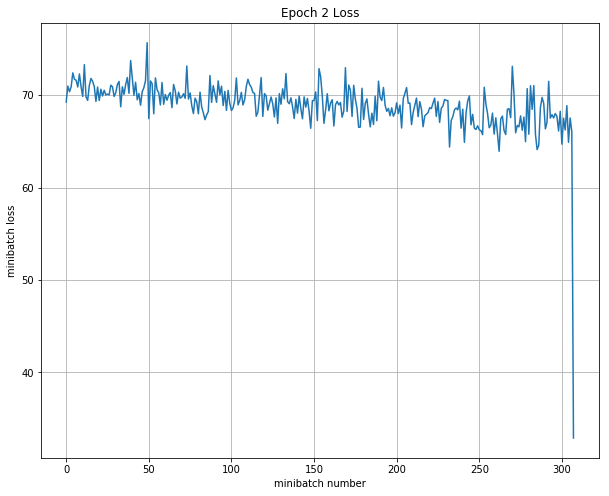

Iteration 700: with minibatch training loss = 10.6 and accuracy of 0.67
Iteration 800: with minibatch training loss = 10.4 and accuracy of 0.83
Iteration 900: with minibatch training loss = 10.3 and accuracy of 1
Epoch 3, Overall loss = 10.9 and accuracy of 0.553


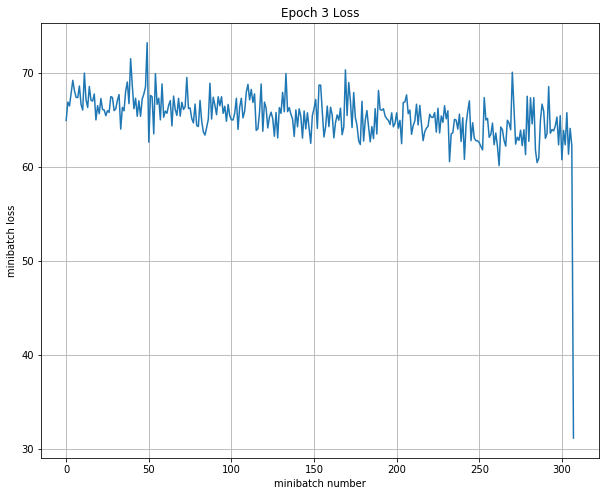

Iteration 1000: with minibatch training loss = 10.3 and accuracy of 0.33
Iteration 1100: with minibatch training loss = 10.1 and accuracy of 0.83
Iteration 1200: with minibatch training loss = 9.76 and accuracy of 0.83
Epoch 4, Overall loss = 10.3 and accuracy of 0.601


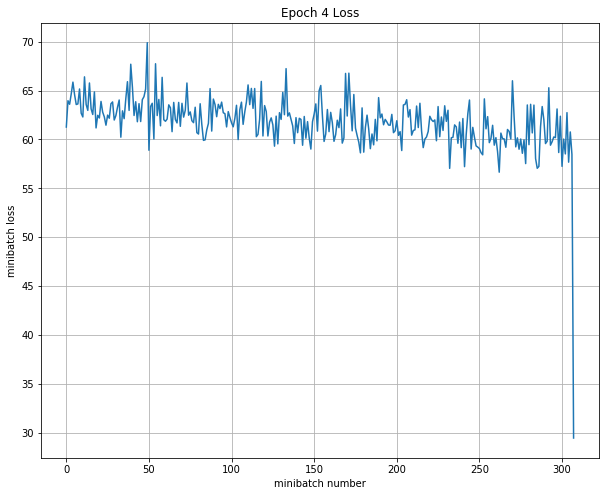

Iteration 1300: with minibatch training loss = 10.1 and accuracy of 0.5
Iteration 1400: with minibatch training loss = 9.33 and accuracy of 0.83
Iteration 1500: with minibatch training loss = 9.57 and accuracy of 0.67
Epoch 5, Overall loss = 9.73 and accuracy of 0.648


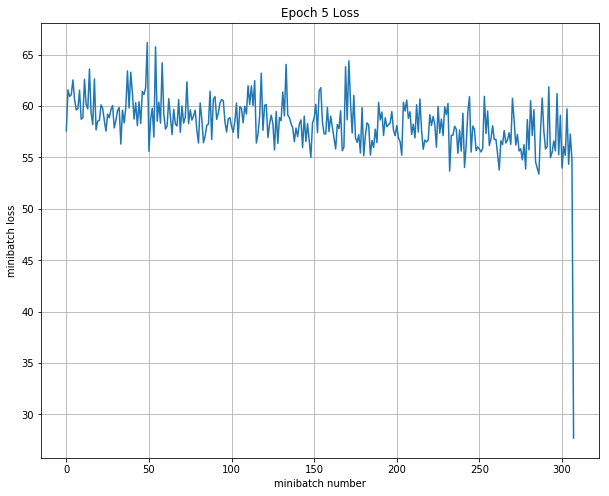

Iteration 1600: with minibatch training loss = 9 and accuracy of 1
Iteration 1700: with minibatch training loss = 9.16 and accuracy of 0.83
Iteration 1800: with minibatch training loss = 8.93 and accuracy of 0.67
Epoch 6, Overall loss = 9.17 and accuracy of 0.693


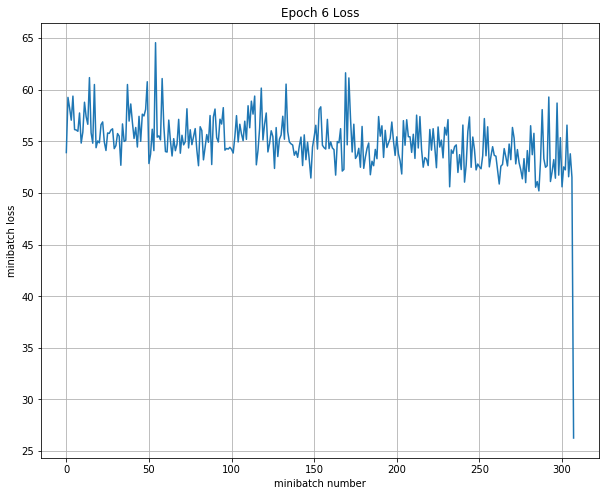

Iteration 1900: with minibatch training loss = 8.92 and accuracy of 0.5
Iteration 2000: with minibatch training loss = 8.53 and accuracy of 0.67
Iteration 2100: with minibatch training loss = 8.5 and accuracy of 0.67
Epoch 7, Overall loss = 8.64 and accuracy of 0.717


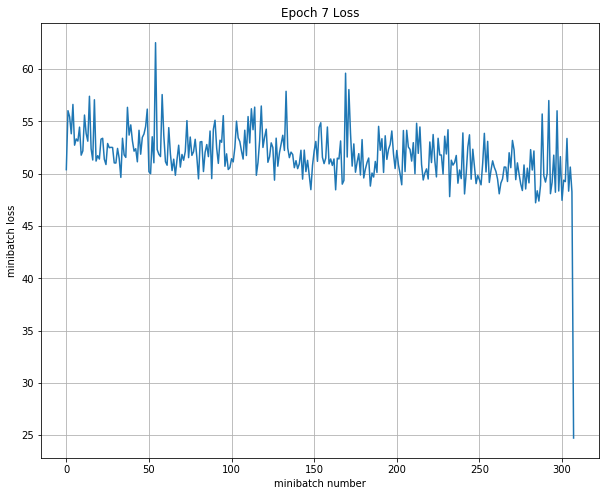

Iteration 2200: with minibatch training loss = 8.46 and accuracy of 0.5
Iteration 2300: with minibatch training loss = 8.22 and accuracy of 0.67
Iteration 2400: with minibatch training loss = 8.42 and accuracy of 0.5
Epoch 8, Overall loss = 8.14 and accuracy of 0.737


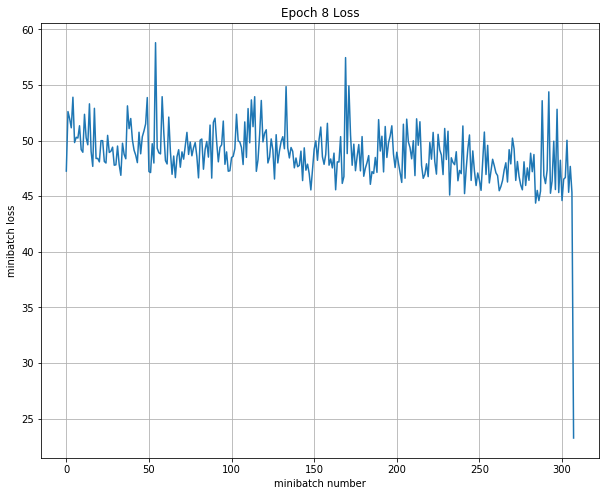

Iteration 2500: with minibatch training loss = 7.55 and accuracy of 0.83
Iteration 2600: with minibatch training loss = 7.78 and accuracy of 0.83
Iteration 2700: with minibatch training loss = 7.67 and accuracy of 0.67
Epoch 9, Overall loss = 7.67 and accuracy of 0.759


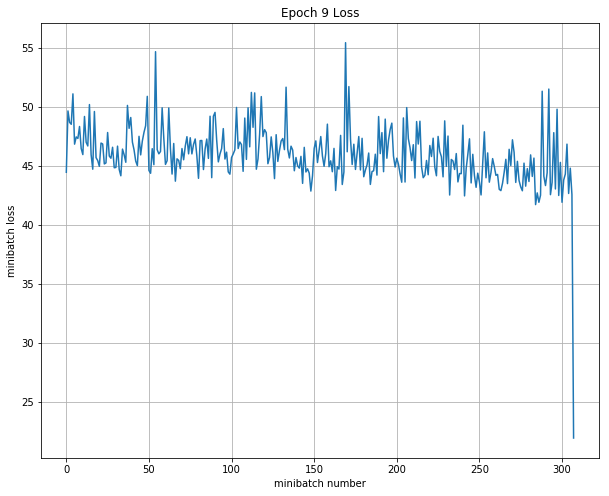

Iteration 2800: with minibatch training loss = 7.32 and accuracy of 0.67
Iteration 2900: with minibatch training loss = 7.14 and accuracy of 0.67
Iteration 3000: with minibatch training loss = 6.89 and accuracy of 1
Epoch 10, Overall loss = 7.22 and accuracy of 0.774


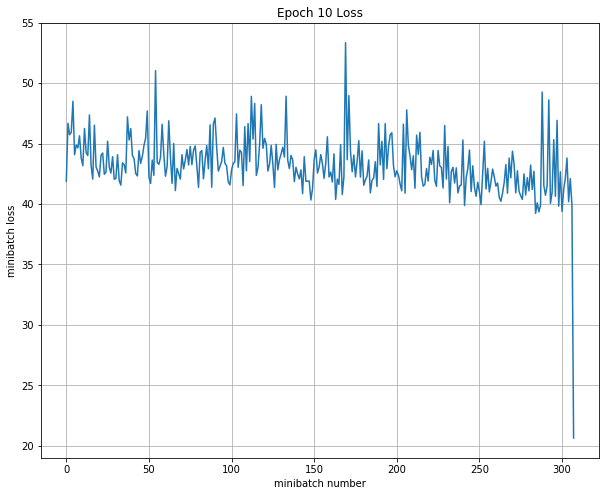

Validation
Epoch 1, Overall loss = 7.03 and accuracy of 0.795
Test
Epoch 1, Overall loss = 6.85 and accuracy of 0.865

--------------------------------------------------------------------------------
Conslusion
--------------------------------------------------------------------------------
Best hyperparam for rg, lr, dr, dc, FC_size is
[0.009421485372153818, 3.835293194437157e-05, 0.8541090942386702, 642, 100]
Best validation accuracy is 0.930000
Best test accuracy is 0.975000


In [5]:
best_acc = 0
test_acc = 0
best_sess = None
best_hyper = None
best_model = None
best_mean_loss = None
with tf.device("/gpu:0") as dev:
    for i in range(10):
        rg = 10**np.random.uniform(-3,1) # regularization
        lr = 10**np.random.uniform(-6,-2) # learning rate
        dr = np.random.uniform(0.75,1) # decay rate
        dc = np.random.randint(500,1000) # decay cut
        FC_size = 100
        # FC_size = np.random.randint(100,150) # decay cut
        print ('')
        print ('-'*80)
        print ('Trial number: %d' %i)
        print ('-'*80)
        print ('reg: %f, lr: %f, dr: %f, dc: %d, FC_size: %d ' %(rg, lr, dr, dc, FC_size))
        sess, model, mean_loss, train_step_last_layer, train_step_all_layer = my_model(rg, lr, dr, dc, FC_size)
        sess.run(tf.global_variables_initializer())
        print('Train last layer')
        run_model(sess,model,mean_loss,x_train,y_train,10,6,100,train_step_last_layer,True)
        print('Train all layer')
        run_model(sess,model,mean_loss,x_train,y_train,10,6,100,train_step_all_layer,True)
        print('Validation')
        _, val_acc = run_model(sess,model,mean_loss,x_val,y_val,1,200)
        print('Test')
        _, test_acc = run_model(sess,model,mean_loss,x_test,y_test,1,200) 
        if val_acc > best_acc:
            best_sess = sess
            best_model = model
            best_mean_loss = mean_loss
            best_acc = val_acc
            best_hyper = [rg, lr, dr, dc, FC_size] 
            test_under_best_val = test_acc
    print ('')
    print ('-'*80)
    print ('Conslusion')
    print ('-'*80)
    print ('Best hyperparam for rg, lr, dr, dc, FC_size is')
    print (best_hyper)
    print ('Best validation accuracy is %f' %best_acc)
    print ('Best test accuracy is %f' %test_under_best_val)
    

# test result

In [ ]:
print('Test')
_, test_acc = run_model(best_sess,best_model,best_mean_loss,x_test,y_test,1,200) 